In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import os
os.getcwd()

'/content'

In [4]:
os.chdir('/content/drive/MyDrive')
print(os.getcwd())

/content/drive/MyDrive


In [5]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import itertools
import re

def read_csv(path):
    return pd.read_csv(path, header=None, delimiter=r"\s+")

#loading the features' names (each line ends with the \n special char)
with open('UCI HAR Dataset/features.txt', 'r') as f:
    columns = [el.rstrip('\n') for el in f.readlines()] 
    
#opening the training files
labels_train = read_csv('UCI HAR Dataset/train/y_train.txt')
ind_train = read_csv('UCI HAR Dataset/train/subject_train.txt')
df_train = read_csv('UCI HAR Dataset/train/X_train.txt')
df_train.columns = columns

#opening the test files
labels_test = read_csv('UCI HAR Dataset/test/y_test.txt')
ind_test = read_csv('UCI HAR Dataset/test/subject_test.txt')
df_test = read_csv('UCI HAR Dataset/test/X_test.txt')
df_test.columns = columns

#concatenate training and test set for the EDA
df = pd.concat([df_train, df_test], ignore_index=True)
individuals = pd.concat([ind_train, ind_test], ignore_index=True)
labels = pd.concat([labels_train, labels_test], ignore_index=True)

#remapping the labels to their meaning to enhance readability (info were in )
with open('UCI HAR Dataset/activity_labels.txt', 'r') as f:
    act_lab = dict(el.strip().split(' ') for el in f.readlines())
to_remap = labels[0]
remap_dict = dict((int(k), v) for k, v in act_lab.items())
remapped_labels = [remap_dict.get(number, number) for number in to_remap]
print(remap_dict)

#inserting the the column of the feature labels as the first column
df.insert(loc=0, column='label', value=remapped_labels)
df.insert(loc=1, column='individuals', value=individuals.values)
df

{1: 'WALKING', 2: 'WALKING_UPSTAIRS', 3: 'WALKING_DOWNSTAIRS', 4: 'SITTING', 5: 'STANDING', 6: 'LAYING'}


,label,individuals,1 tBodyAcc-mean()-X,2 tBodyAcc-mean()-Y,3 tBodyAcc-mean()-Z,4 tBodyAcc-std()-X,5 tBodyAcc-std()-Y,6 tBodyAcc-std()-Z,7 tBodyAcc-mad()-X,8 tBodyAcc-mad()-Y,...,552 fBodyBodyGyroJerkMag-meanFreq(),553 fBodyBodyGyroJerkMag-skewness(),554 fBodyBodyGyroJerkMag-kurtosis(),"555 angle(tBodyAccMean,gravity)","556 angle(tBodyAccJerkMean),gravityMean)","557 angle(tBodyGyroMean,gravityMean)","558 angle(tBodyGyroJerkMean,gravityMean)","559 angle(X,gravityMean)","560 angle(Y,gravityMean)","561 angle(Z,gravityMean)"
0,STANDING,1,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,...,-0.074323,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627
1,STANDING,1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,...,0.158075,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317
2,STANDING,1,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,...,0.414503,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118
3,STANDING,1,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,...,0.404573,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663
4,STANDING,1,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,...,0.087753,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10294,WALKING_UPSTAIRS,24,0.310155,-0.053391,-0.099109,-0.287866,-0.140589,-0.215088,-0.356083,-0.148775,...,0.074472,-0.376278,-0.750809,-0.337422,0.346295,0.884904,-0.698885,-0.651732,0.274627,0.184784
10295,WALKING_UPSTAIRS,24,0.363385,-0.039214,-0.105915,-0.305388,0.028148,-0.196373,-0.373540,-0.030036,...,0.101859,-0.320418,-0.700274,-0.736701,-0.372889,-0.657421,0.322549,-0.655181,0.273578,0.182412
10296,WALKING_UPSTAIRS,24,0.349966,0.030077,-0.115788,-0.329638,-0.042143,-0.250181,-0.388017,-0.133257,...,-0.066249,-0.118854,-0.467179,-0.181560,0.088574,0.696663,0.363139,-0.655357,0.274479,0.181184
10297,WALKING_UPSTAIRS,24,0.237594,0.018467,-0.096499,-0.323114,-0.229775,-0.207574,-0.392380,-0.279610,...,-0.046467,-0.205445,-0.617737,0.444558,-0.819188,0.929294,-0.008398,-0.659719,0.264782,0.187563


# Data Understanding and Preparation

In [6]:
df.describe()

,individuals,1 tBodyAcc-mean()-X,2 tBodyAcc-mean()-Y,3 tBodyAcc-mean()-Z,4 tBodyAcc-std()-X,5 tBodyAcc-std()-Y,6 tBodyAcc-std()-Z,7 tBodyAcc-mad()-X,8 tBodyAcc-mad()-Y,9 tBodyAcc-mad()-Z,...,552 fBodyBodyGyroJerkMag-meanFreq(),553 fBodyBodyGyroJerkMag-skewness(),554 fBodyBodyGyroJerkMag-kurtosis(),"555 angle(tBodyAccMean,gravity)","556 angle(tBodyAccJerkMean),gravityMean)","557 angle(tBodyGyroMean,gravityMean)","558 angle(tBodyGyroJerkMean,gravityMean)","559 angle(X,gravityMean)","560 angle(Y,gravityMean)","561 angle(Z,gravityMean)"
count,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,...,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000
mean,16.146422,0.274347,-0.017743,-0.108925,-0.607784,-0.510191,-0.613064,-0.633593,-0.525697,-0.614989,...,0.126708,-0.298592,-0.617700,0.007705,0.002648,0.017683,-0.009219,-0.496522,0.063255,-0.054284
std,8.679067,0.067628,0.037128,0.053033,0.438694,0.500240,0.403657,0.413333,0.484201,0.399034,...,0.245443,0.320199,0.308796,0.336591,0.447364,0.616188,0.484770,0.511158,0.305468,0.268898
min,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,9.000000,0.262625,-0.024902,-0.121019,-0.992360,-0.976990,-0.979137,-0.993293,-0.977017,-0.979064,...,-0.019481,-0.536174,-0.841847,-0.124694,-0.287031,-0.493108,-0.389041,-0.817288,0.002151,-0.131880
50%,17.000000,0.277174,-0.017162,-0.108596,-0.943030,-0.835032,-0.850773,-0.948244,-0.843670,-0.845068,...,0.136245,-0.335160,-0.703402,0.008146,0.007668,0.017192,-0.007186,-0.715631,0.182028,-0.003882
75%,24.000000,0.288354,-0.010625,-0.097589,-0.250293,-0.057336,-0.278737,-0.302033,-0.087405,-0.288149,...,0.288960,-0.113167,-0.487981,0.149005,0.291490,0.536137,0.365996,-0.521503,0.250790,0.102970
max,30.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


The data are clearly already preprocessed and normalized in a range [-1, +1]

<font size = "5">Counting the records with respect to individuals and labels</font>

In [7]:
#training set
df_train.values.shape

(7352, 561)

In [8]:
#test set
df_test.values.shape

(2947, 561)

In [9]:
#checking if individuals are 30 as stated in the readme
len(df['individuals'].unique())

30

In [10]:
#to count and show quickly the unique elements of a collection
def count_unique(collection):
    unreadable_count = np.unique(collection, return_counts=True)
    readable_count = dict(zip(*list(unreadable_count)))
    return readable_count

In [11]:
#count of labels of the dataset
print(count_unique(df['label']))

{'LAYING': 1944, 'SITTING': 1777, 'STANDING': 1906, 'WALKING': 1722, 'WALKING_DOWNSTAIRS': 1406, 'WALKING_UPSTAIRS': 1544}


In [12]:
#count of individuals of the dataset
print(count_unique(df['individuals']))

{1: 347, 2: 302, 3: 341, 4: 317, 5: 302, 6: 325, 7: 308, 8: 281, 9: 288, 10: 294, 11: 316, 12: 320, 13: 327, 14: 323, 15: 328, 16: 366, 17: 368, 18: 364, 19: 360, 20: 354, 21: 408, 22: 321, 23: 372, 24: 381, 25: 409, 26: 392, 27: 376, 28: 382, 29: 344, 30: 383}


In [13]:
#checking activity records for each individual
act_ind_records = {}
for ind in df['individuals'].unique():
    activity_dict = {}
    for act in df['label'].unique():
        temp = df[df['individuals'] == ind]
        activity_dict[act] = len(temp[temp['label'] == act])
    act_ind_records["IND "+str(ind)] = activity_dict
value_counted_df = pd.DataFrame(act_ind_records)
total_by_activity = [value_counted_df.iloc[i].sum() for i in range(len(df['label'].unique()))]
value_counted_df['Tot_by_Act'] = total_by_activity
total_by_individual = [value_counted_df[col].sum() for col in value_counted_df.columns]
value_counted_df.loc['Tot_by_Ind'] = total_by_individual
value_counted_df

,IND 1,IND 3,IND 5,IND 6,IND 7,IND 8,IND 11,IND 14,IND 15,IND 16,...,IND 2,IND 4,IND 9,IND 10,IND 12,IND 13,IND 18,IND 20,IND 24,Tot_by_Act
STANDING,53,61,56,57,53,54,47,60,53,78,...,54,56,45,44,61,57,73,73,69,1906
SITTING,47,52,44,55,48,46,53,54,59,69,...,46,50,50,54,51,49,57,66,68,1777
LAYING,50,62,52,57,52,54,57,51,72,70,...,48,54,50,58,60,62,65,68,72,1944
WALKING,95,58,56,57,57,48,59,59,54,51,...,59,60,52,53,50,57,56,51,58,1722
WALKING_DOWNSTAIRS,49,49,47,48,47,38,46,45,42,47,...,47,45,42,38,46,47,55,45,55,1406
WALKING_UPSTAIRS,53,59,47,51,51,41,54,54,48,51,...,48,52,49,47,52,55,58,51,59,1544
Tot_by_Ind,347,341,302,325,308,281,316,323,328,366,...,302,317,288,294,320,327,364,354,381,10299


The data also seems to be balanced

<BarContainer object of 30 artists>

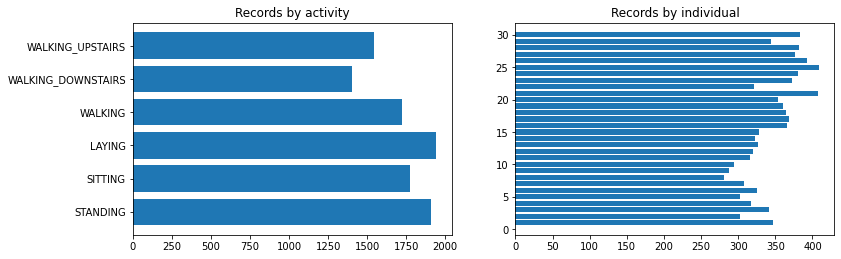

In [14]:
#visualize balance between records by activity and by individual
fig = plt.subplots(figsize=(40, 32))
fig_dims = (7, 6)

plt.subplot2grid(fig_dims, (0, 0), title='Records by activity')
plt.barh(df['label'].unique(), value_counted_df['Tot_by_Act'][:-1])
plt.subplot2grid(fig_dims, (0, 1), title='Records by individual')
plt.barh(df['individuals'].unique(), value_counted_df.loc['Tot_by_Ind'][:-1])

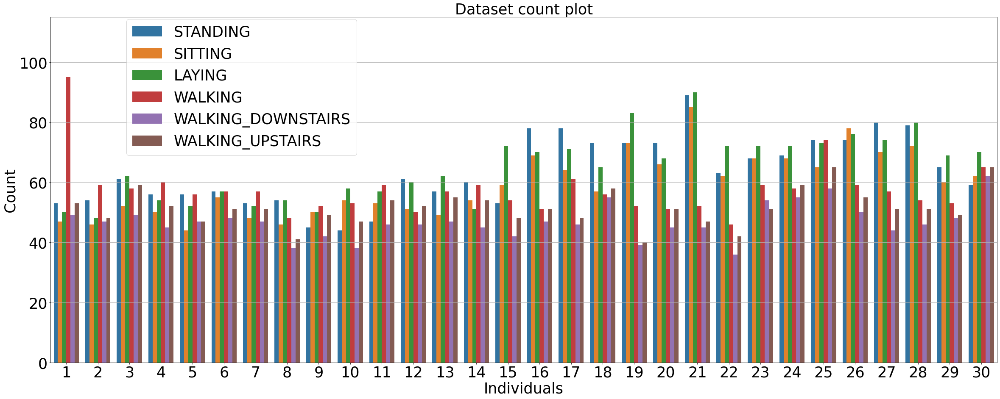

In [15]:
plt.figure(figsize=(40,15))
plt.grid()
#sns.set(rc={'figure.figsize':(40,15)}, font_scale=3) #to fix the scaling of the plot
sns.countplot(x="individuals", hue="label", data=df)
plt.title('Dataset count plot',fontsize=35)
plt.xlabel('Individuals',fontsize=35)
plt.ylabel('Count',fontsize=35)
plt.xticks(fontsize=35)
plt.yticks(fontsize=35)
plt.ylim(0, 115)
plt.legend(loc=(0.08,0.60), fontsize=35)
plt.show()

plt.style.use('default') #otherwise the rest of the plots take seaborn style

In [16]:
#I may need them to balance out the values, maybe
min_value_ts = value_counted_df.min().min()
max_value_ts = value_counted_df[:-1].T[:-1].T.max().max()
print("Minimum number of records (individual-w-action): {}\nMaximum number of records (individual-w-action): {}".format(min_value_ts, max_value_ts))

Minimum number of records (individual-w-action): 36
Maximum number of records (individual-w-action): 95


In [17]:
#checking the correspondence of the test set concatenated to the complete dataset with the original test set
check_index = df_test.index+len(df_train)
check_df = df.loc[check_index].drop(columns=['label', 'individuals'])
check_df.reset_index(drop=True, inplace=True)

for i in range(len(df_test)):
    if (df_test.loc[i] != check_df.loc[i]).sum() >= 1:
        raise Exception("Values do not corresponds at index {}".format(i))

<font size = "5">Checking if there are some missing or duplicate values</font>

In [18]:
#printing the columns with missing values
for col in df.columns:
    if df[df[col].isnull()].values.size > 0: #if there are some missing value the array is non null therefore with a size > 0
        print(col)

In [19]:
#double checking that the sum is really zero for missing values
print(df.isnull().sum().sum())

0


Checking n° DUPLICATE ROWS (it should be impossible for records to be the same all across different features in principle, if that's the case it is certainly an error)

In [20]:
print(df.duplicated().sum())

0


Checking n° of DUPLICATE COLUMNS (if some columns are duplicates it may be relevant to consider to remove them during the feature selection as some algorithm may give double the weight to the values in that column)

In [21]:
print(df.T.duplicated().sum())

21


In [22]:
#printing the features which are duplicated
col_dup = df.columns[df.T.duplicated()]
print('Duplicate columns: ', len(col_dup))
col_dup

Duplicate columns:  21


Index(['206 tBodyAccMag-sma()', '214 tGravityAccMag-mean()',
       '215 tGravityAccMag-std()', '216 tGravityAccMag-mad()',
       '217 tGravityAccMag-max()', '218 tGravityAccMag-min()',
       '219 tGravityAccMag-sma()', '220 tGravityAccMag-energy()',
       '221 tGravityAccMag-iqr()', '222 tGravityAccMag-entropy()',
       '223 tGravityAccMag-arCoeff()1', '224 tGravityAccMag-arCoeff()2',
       '225 tGravityAccMag-arCoeff()3', '226 tGravityAccMag-arCoeff()4',
       '232 tBodyAccJerkMag-sma()', '245 tBodyGyroMag-sma()',
       '258 tBodyGyroJerkMag-sma()', '508 fBodyAccMag-sma()',
       '521 fBodyBodyAccJerkMag-sma()', '534 fBodyBodyGyroMag-sma()',
       '547 fBodyBodyGyroJerkMag-sma()'],
      dtype='object')

In [23]:
#adding the column excluded by the algorithm of pd.DataFrame.duplicated()
#it exclude the first column it finds labeling as unique
#by reversing the indices of columns it will find that column as last
reversed_df = df[reversed(df.columns)]
col_dup_reverse = reversed_df.columns[reversed_df.T.duplicated()]
print('Duplicate columns (reverse): ', len(col_dup_reverse))
col_dup_reverse

Duplicate columns (reverse):  21


Index(['542 fBodyBodyGyroJerkMag-mean()', '529 fBodyBodyGyroMag-mean()',
       '516 fBodyBodyAccJerkMag-mean()', '503 fBodyAccMag-mean()',
       '253 tBodyGyroJerkMag-mean()', '240 tBodyGyroMag-mean()',
       '227 tBodyAccJerkMag-mean()', '214 tGravityAccMag-mean()',
       '213 tBodyAccMag-arCoeff()4', '212 tBodyAccMag-arCoeff()3',
       '211 tBodyAccMag-arCoeff()2', '210 tBodyAccMag-arCoeff()1',
       '209 tBodyAccMag-entropy()', '208 tBodyAccMag-iqr()',
       '207 tBodyAccMag-energy()', '206 tBodyAccMag-sma()',
       '205 tBodyAccMag-min()', '204 tBodyAccMag-max()',
       '203 tBodyAccMag-mad()', '202 tBodyAccMag-std()',
       '201 tBodyAccMag-mean()'],
      dtype='object')

In [24]:
#now combining the lists
duplicate_columns = sorted(list(set(col_dup.tolist()+col_dup_reverse.tolist())))
print('Total duplicate columns: ', len(duplicate_columns))
print()
print(duplicate_columns)

Total duplicate columns:  40

['201 tBodyAccMag-mean()', '202 tBodyAccMag-std()', '203 tBodyAccMag-mad()', '204 tBodyAccMag-max()', '205 tBodyAccMag-min()', '206 tBodyAccMag-sma()', '207 tBodyAccMag-energy()', '208 tBodyAccMag-iqr()', '209 tBodyAccMag-entropy()', '210 tBodyAccMag-arCoeff()1', '211 tBodyAccMag-arCoeff()2', '212 tBodyAccMag-arCoeff()3', '213 tBodyAccMag-arCoeff()4', '214 tGravityAccMag-mean()', '215 tGravityAccMag-std()', '216 tGravityAccMag-mad()', '217 tGravityAccMag-max()', '218 tGravityAccMag-min()', '219 tGravityAccMag-sma()', '220 tGravityAccMag-energy()', '221 tGravityAccMag-iqr()', '222 tGravityAccMag-entropy()', '223 tGravityAccMag-arCoeff()1', '224 tGravityAccMag-arCoeff()2', '225 tGravityAccMag-arCoeff()3', '226 tGravityAccMag-arCoeff()4', '227 tBodyAccJerkMag-mean()', '232 tBodyAccJerkMag-sma()', '240 tBodyGyroMag-mean()', '245 tBodyGyroMag-sma()', '253 tBodyGyroJerkMag-mean()', '258 tBodyGyroJerkMag-sma()', '503 fBodyAccMag-mean()', '508 fBodyAccMag-sma()', 

In [25]:
#I looked intuitively and it seems the similarity may lay with these measures
df[['205 tBodyAccMag-min()', '218 tGravityAccMag-min()', 
    '542 fBodyBodyGyroJerkMag-mean()', '547 fBodyBodyGyroJerkMag-sma()']]

,205 tBodyAccMag-min(),218 tGravityAccMag-min(),542 fBodyBodyGyroJerkMag-mean(),547 fBodyBodyGyroJerkMag-sma()
0,-0.992556,-0.992556,-0.991990,-0.991990
1,-0.995333,-0.995333,-0.995854,-0.995854
2,-0.995333,-0.995333,-0.995031,-0.995031
3,-0.997045,-0.997045,-0.995221,-0.995221
4,-0.997045,-0.997045,-0.995093,-0.995093
...,...,...,...,...
10294,-0.726890,-0.726890,-0.601424,-0.601424
10295,-0.726890,-0.726890,-0.566344,-0.566344
10296,-0.681888,-0.681888,-0.592331,-0.592331
10297,-0.716092,-0.716092,-0.679711,-0.679711


It seems the majority of duplicates come from aggregate measures linked to the body and gravity acceleration signlas obtained through the Butterworth filter, intuitively I looked if the identical measures were in the ranges of the Body and Gravity Acceleration split. </br></br>
It also seems the Fast Fourier Transformation didn't generate many duplicate columns as it is with the time domain and the presence of duplicates is due to the similarity of calculation between the mean and the signal magnitude area. </br></br>
Hereunder I built the table to understand how many reference to the keyword selected were present in the duplicate columns

In [26]:
scan_idx = ['Gravity', 'BodyAcc', 'Gyro', 'Jerk', ' t', ' f']
scan_df = [[len([el for el in col if search in el]) for col in [col_dup, col_dup_reverse, duplicate_columns]] for search in scan_idx]
scan_df = pd.DataFrame(scan_df, index=scan_idx[:-2]+['Time domain', 'Frequency domain'], columns=['Firs Scan', 'Reverse Scan', 'Total Scan'])
scan_df

,Firs Scan,Reverse Scan,Total Scan
Gravity,13,1,13
BodyAcc,4,16,19
Gyro,4,4,8
Jerk,4,4,8
Time domain,17,17,32
Frequency domain,4,4,8


In [27]:
#extracting correlations with a value beyond a threshold
correlation = df.corr()
extract_threshold = 0.90

correl_extraction = {}
for col in correlation.columns:
    val = correlation.loc[abs(correlation[col]) > extract_threshold][col]
    if val.values.size > 1:
        correl_extraction[col] = [(x, val[x]) for x in val.index]
len(correl_extraction)

429

<font size = "5">Visualising some variables</font>

Visualizing some variables. I did this plot to check possible differential patterns by plotting 2 variables I later found with the decision tree. I also plotted dividing by stationary and moving state as they appeared correlated by looking at the data

In [28]:
val_to_plot = '10 tBodyAcc-max()-X'
val_y_to_plot = '53 tGravityAcc-min()-X'

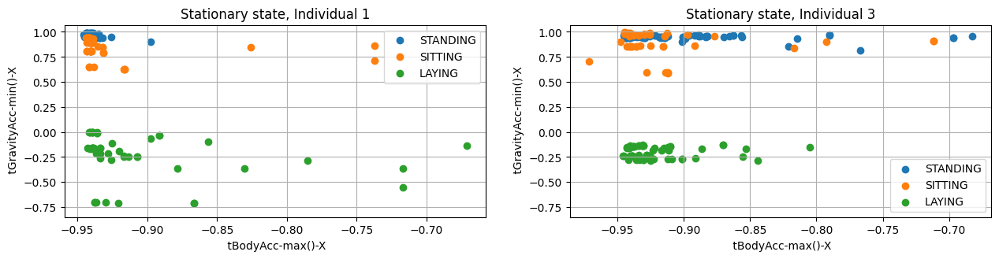

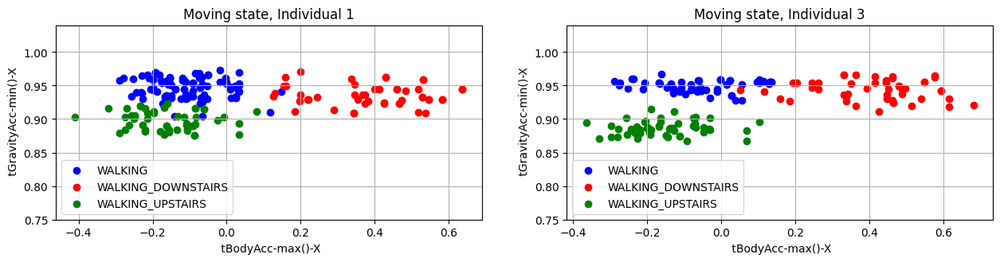

In [29]:
individual_loop = df['individuals'].unique() #to loop over individuals
label_loop = df['label'].unique() #to loop over actions

for x, state in {(0, 3) : 'stationary', (3, 6) : 'moving'}.items(): #in order to plot over two groups of variable separately 
    fig = plt.subplots(figsize=(40, 26))
    fig_dims = (7, 5)

    for colonna, ind in enumerate(individual_loop[0:2]):
        max_col = 2 #the max number of columns I want to plot
        righe = colonna//max_col #so that the rows stay proportional to the columns
        if colonna > max_col-1: 
            colonna -= max_col*righe #so that if it goes beyond the values of columns it redefine the index of column
        
        plt.subplot2grid(fig_dims, (righe, colonna), title="{} state, Individual {}".format(state[0].upper()+state[1:], str(ind)))

        for act in label_loop[x[0]:x[1]]:
            temp_ind = df[df['individuals'] == ind]
            temp_act = temp_ind[temp_ind['label'] == act]
            xdata = temp_act[val_to_plot]
            ydata = temp_act[val_y_to_plot]
            
            if state == 'stationary':
                plt.scatter(xdata, ydata, label = act)
                plt.ylim(-0.85, 1.07)
            else:
                colordict = {'WALKING':'blue', 'WALKING_DOWNSTAIRS':'red', 'WALKING_UPSTAIRS':'green'}
                plt.scatter(xdata, ydata, label = act, color=colordict[act])
                plt.ylim(0.75, 1.04)
            plt.xlabel(val_to_plot[2:])
            plt.ylabel(val_y_to_plot[2:])
            plt.grid()
        plt.legend()
    plt.show()

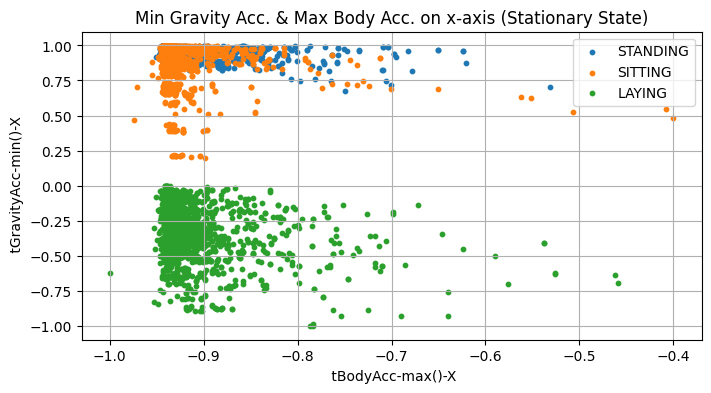

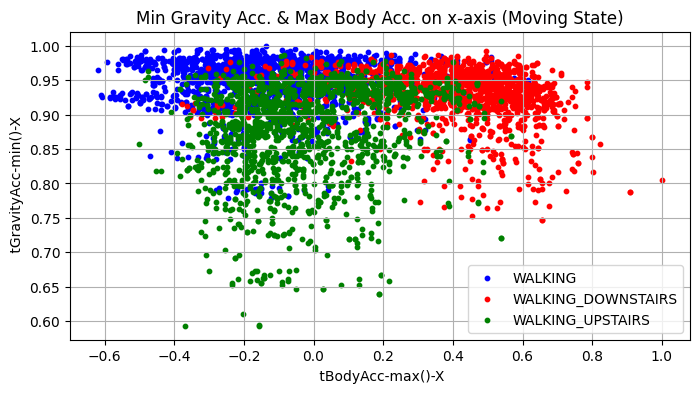

In [30]:
for x, state in {(0, 3) : 'stationary', (3, 6) : 'moving'}.items(): #in order to plot over two groups of variable separately 
    fig = plt.subplots(figsize=(8, 4))
    for act in label_loop[x[0]:x[1]]:
        temp_act = df[df['label'] == act]
        xdata = temp_act[val_to_plot]
        ydata = temp_act[val_y_to_plot]

        if state == 'stationary':
            plt.scatter(xdata, ydata, label = act, s=10)
        else:
            colordict = {'WALKING':'blue', 'WALKING_DOWNSTAIRS':'red', 'WALKING_UPSTAIRS':'green'}
            plt.scatter(xdata, ydata, label = act, color=colordict[act], s=10)
        plt.title('Min Gravity Acc. & Max Body Acc. on x-axis ({} State)'.format(state[0].upper()+state[1:]))
        plt.xlabel(val_to_plot[2:])
        plt.ylabel(val_y_to_plot[2:])
        plt.grid()
        plt.legend()

<font size = "5">Extracting feature importance from the decision tree</font>

In [31]:
#as a reference the original target variables with the original split
y_train, y_test = labels_train.copy(deep=True), labels_test.copy(deep=True)

Predicting STANDING with the Desision Tree:
Area Under the Curve (ROC):  0.9090486308940053
Confusion Matrix:
 [[ 431  101]
 [ 109 2306]]
              precision    recall  f1-score   support

           0       0.96      0.95      0.96      2415
           1       0.80      0.81      0.80       532

    accuracy                           0.93      2947
   macro avg       0.88      0.88      0.88      2947
weighted avg       0.93      0.93      0.93      2947
STANDING most important feature is tGravityAcc-mean()-Y which has an importance score of: 28.74%

Predicting SITTING with the Desision Tree:
Area Under the Curve (ROC):  0.8793084146559902
Confusion Matrix:
 [[ 372  119]
 [  66 2390]]
              precision    recall  f1-score   support

           0       0.95      0.97      0.96      2456
           1       0.85      0.76      0.80       491

    accuracy                           0.94      2947
   macro avg       0.90      0.87      0.88      2947
weighted avg       0.94      

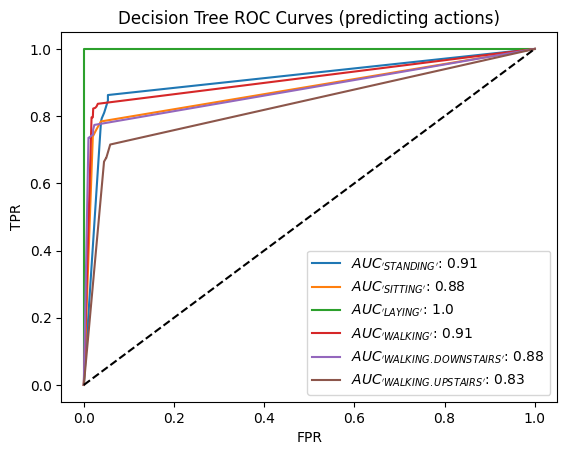

In [32]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score 
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc, roc_auc_score

X = df.drop(columns=['label', 'individuals']).values #the original df
X_train, X_test = df_train.copy(deep=True), df_test.copy(deep=True) #the original split
dict_importances = {} #the output I want

for el in df['label'].unique():
    #Create the target variable for the i label
    y = pd.Series(1 if i == el else 0 for i in df['label'])
    
    #Reset the training and test set target variable according to the new y
    y_train, y_test = y[:len(ind_train)], y[len(ind_train):]
    
    #Training
    clf = DecisionTreeClassifier(min_samples_leaf=3, random_state=42)
    clf.fit(X_train, y_train)
    
    #Predicting
    y_pred = clf.predict(X_test)
    y_score = clf.predict_proba(X_test)
    
    #Computing the ROC Curve
    fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
    roc_auc = auc(fpr, tpr)
    
    #Printing the classification results
    print('Predicting {} with the Desision Tree:'.format(el))
    print('Area Under the Curve (ROC): ', roc_auc)
    print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred, labels=[1,0]))
    print(classification_report(y_test, y_pred), end='')

    #Extracting the importance of the features for this label
    imp_dict = {attr: clf.feature_importances_[i] for i, attr in enumerate(df.columns[2:])} #so that I store importances
    imp_dict = {k: v for k, v in sorted(imp_dict.items(), key=lambda item: item[1], reverse=True)} #sorted
    
    #I extract features with an importance over 10% for the decision tree
    dict_importances[el] = dict((k, v) for k, v in imp_dict.items() if v >= 0.10)
    
    #Print info about the extraction of features
    most_important_feat = list(dict_importances[el])[0]
    most_important_score = round(100*dict_importances[el][most_important_feat], 2)
    print(str(el) + ' most important feature is ' + str(most_important_feat)[3:] + ' which has an importance score of: ' + str(most_important_score) + '%\n')
    
    #Plot the ROC Curve of the classification of this label
    plt.plot(fpr, tpr, label='$AUC_{action}$: '.format(action={el.replace('_', '.')}) + str(round(roc_auc, 2))) #. to avoid visualizing multiple subscripts preserving distance (space doesn't work)

plt.plot([0,1], [0,1], 'k--') #adding the baseline
plt.title("Decision Tree ROC Curves (predicting actions)")
plt.ylabel('TPR')
plt.xlabel('FPR')
plt.legend()
plt.show()

Walking Upstairs had the lowest AUC, I decided to use it as target variable

In [33]:
dict_importances #extracted importances

{'LAYING': {'53 tGravityAcc-min()-X': 1.0},
 'SITTING': {'427 fBodyGyro-std()-X': 0.15387594017993914,
  '53 tGravityAcc-min()-X': 0.3863777172177333,
  '560 angle(Y,gravityMean)': 0.23477367439428298},
 'STANDING': {'297 fBodyAcc-skewness()-X': 0.23503683561695696,
  '411 fBodyAccJerk-bandsEnergy()-9,16': 0.10156063604759441,
  '42 tGravityAcc-mean()-Y': 0.28738292334088905},
 'WALKING': {'167 tBodyGyroJerk-mad()-X': 0.30724935705429274,
  '504 fBodyAccMag-std()': 0.3060141314297988},
 'WALKING_DOWNSTAIRS': {'10 tBodyAcc-max()-X': 0.6892451764408278},
 'WALKING_UPSTAIRS': {'331 fBodyAcc-bandsEnergy()-1,8': 0.2710969645098043,
  '74 tGravityAcc-arCoeff()-Z,1': 0.2952026047023094}}

CHECKING WHETHERE LAYING IS TRULY PREDICTED PERFECTLY </br>
By verifying with cross validation on training set and comparing with test set

In [34]:
y = pd.Series(1 if i == 'LAYING' else 0 for i in df['label'])
y_train, y_test = y[:len(ind_train)], y[len(ind_train):]

clf = DecisionTreeClassifier(min_samples_leaf=3, random_state=42)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_train)

print(' ON TRAINING SET:\n')
print('Confusion Matrix (training set):\n', confusion_matrix(y_train, y_pred, labels=[1,0]))
print('Classification Report (training set):\n', classification_report(y_train, y_pred))
scores = cross_val_score(clf, X_train, y_train, cv=10)
print('Accuracy (Cross Validation Score on training set): {:.4f} mean (+/- {:.3f} std)'.format(scores.mean(), scores.std()))
scores = cross_val_score(clf, X_train, y_train, cv=10, scoring='f1_macro')
print('F1-score (Cross Validation Score on training set): {:.4f} mean (+/- {:.3f} std)\n'.format(scores.mean(), scores.std()))
print('__________________________________\n\n ON TEST SET:\n')

y_pred = clf.predict(X_test)
print('Confusion Matrix (test set):\n', confusion_matrix(y_test, y_pred, labels=[1,0]))
print('Classification Report (test set):\n', classification_report(y_test, y_pred))

 ON TRAINING SET:

Confusion Matrix (training set):
 [[1407    0]
 [   0 5945]]
Classification Report (training set):
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5945
           1       1.00      1.00      1.00      1407

    accuracy                           1.00      7352
   macro avg       1.00      1.00      1.00      7352
weighted avg       1.00      1.00      1.00      7352

Accuracy (Cross Validation Score on training set): 0.9977 mean (+/- 0.006 std)
F1-score (Cross Validation Score on training set): 0.9964 mean (+/- 0.009 std)

__________________________________

 ON TEST SET:

Confusion Matrix (test set):
 [[ 537    0]
 [   0 2410]]
Classification Report (test set):
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      2410
           1       1.00      1.00      1.00       537

    accuracy                           1.00      2947
   macro avg       1.00      1.00 

<b>Conclusion: LAYING is perfectly predicted by tGravityAcc-min()-X alone</b> By looking at the plots, it is easy to divide the decision space because of a large distance with the minimized value of gravity acceleration of a person lying down

In [35]:
features_to_keep = set()
for k, v in dict_importances.items():
    for inkey in dict_importances[k].keys():
        features_to_keep.add(inkey)
features_to_keep = list(features_to_keep)

In [36]:
features_to_keep = [' '.join([str(n), str(el)]) for n, el in sorted([(int(n), el) for n, el in [feat.split(' ') for feat in features_to_keep]])]

DEFINING THE DATAFRAME WITH THE FEATURES EXTRACTED FROM THE IMPORTANCE

In [37]:
df_select = df[features_to_keep]
print("columns:", len(df_select.columns))
df_select

columns: 11


,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
0,-0.934724,-0.140840,0.977436,-0.995112,-0.992165,0.142051,-0.993592,-0.999766,-0.985033,-0.956134,0.179941
1,-0.943068,-0.141551,0.984520,-0.833882,-0.989876,-0.692541,-0.998235,-0.999846,-0.984904,-0.975866,0.180289
2,-0.938692,-0.142010,0.986770,-0.705039,-0.987868,-0.727227,-0.999388,-0.999784,-0.976642,-0.989015,0.180637
3,-0.938692,-0.143976,0.986821,-0.385410,-0.991241,-0.599118,-0.999807,-0.999724,-0.992810,-0.986742,0.181935
4,-0.942469,-0.148750,0.987434,-0.237474,-0.992882,-0.676997,-0.999806,-0.999853,-0.985982,-0.990063,0.185151
...,...,...,...,...,...,...,...,...,...,...,...
10294,0.185361,-0.276718,0.903413,-0.258938,-0.652975,-0.073249,-0.708900,-0.797782,-0.590484,-0.332141,0.274627
10295,0.185361,-0.274976,0.903793,-0.432021,-0.626430,-0.328521,-0.685810,-0.838436,-0.478150,-0.316954,0.273578
10296,0.007471,-0.276165,0.903793,-0.523912,-0.653267,0.143487,-0.735537,-0.834130,-0.463566,-0.377240,0.274479
10297,0.007471,-0.262356,0.909007,-0.411005,-0.716997,0.233824,-0.721997,-0.747012,-0.681748,-0.390201,0.264782


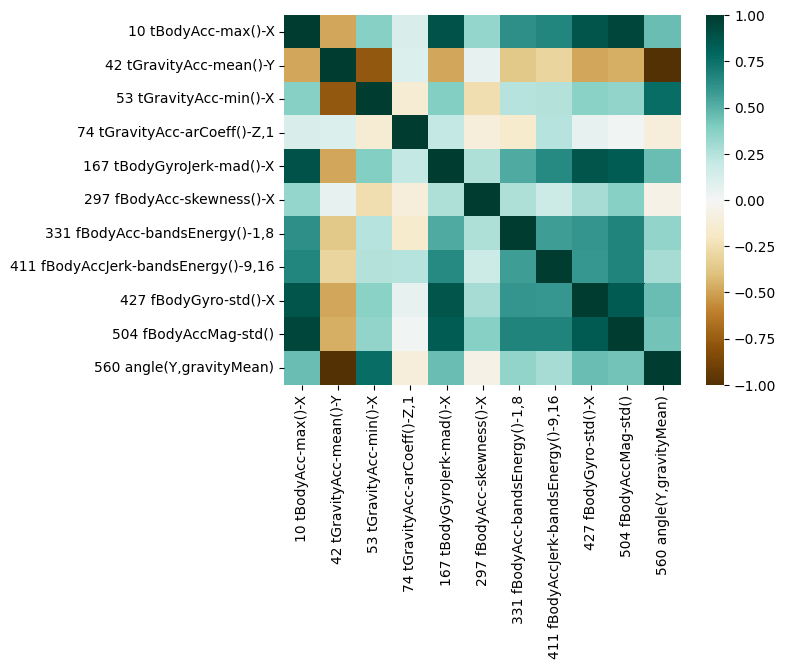

In [38]:
sns.heatmap(df_select.corr(), vmin=-1, vmax=1, cmap='BrBG')
plt.show()

<font size = "5">Feature Selection</font>

In [39]:
#I decided to measure the AUC with the lowest previous AUC's target variable 
y = pd.Series(1 if i == 'WALKING_UPSTAIRS' else 0 for i in df['label'])
y_train, y_test = y[:len(ind_train)], y[len(ind_train):]

#Setting the simplest parameter for the dt classifier
clf = DecisionTreeClassifier(min_samples_leaf=3, random_state=42)

#Setting a dictionary to save the AUC results for each dt classification after using a dimensionality reduction technique
auc_dict = dict()

<font size = "4">Original Dataset predictions as a comparison</font>

In [40]:
#Train and Predict
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(X_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_OR = auc(fpr, tpr)
print('ROC Curve:', roc_auc_OR)

#saving the AUC results
auc_dict['Original Dataset'] = (roc_auc_OR, X_train.shape[1])

[[2353  123]
 [ 153  318]]
Accuracy 0.9063454360366474
F1-score [0.94460056 0.69736842]
              precision    recall  f1-score   support

           0       0.94      0.95      0.94      2476
           1       0.72      0.68      0.70       471

    accuracy                           0.91      2947
   macro avg       0.83      0.81      0.82      2947
weighted avg       0.90      0.91      0.91      2947

ROC Curve: 0.8318404453453794


<font size = "4">DT Feature Importance</font>

In [41]:
#Defining the training and test set of the feature importance
X_train_FI, X_test_FI = df_select[:len(ind_train)], df_select[len(ind_train):]

#Train and Predict
clf.fit(X_train_FI, y_train)
y_pred = clf.predict(X_test_FI)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(X_test_FI)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_FI = auc(fpr, tpr)
print('ROC Curve:', roc_auc_FI)

#saving the AUC results
auc_dict['Feature Importance from DT'] = (roc_auc_FI, X_train_FI.shape[1])

[[2379   97]
 [ 141  330]]
Accuracy 0.9192399049881235
F1-score [0.95236189 0.73496659]
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      2476
           1       0.77      0.70      0.73       471

    accuracy                           0.92      2947
   macro avg       0.86      0.83      0.84      2947
weighted avg       0.92      0.92      0.92      2947

ROC Curve: 0.8530229909895078


<font size = "4">Feature selection using a Variance Threshold</font>

In [42]:
from sklearn.feature_selection import VarianceThreshold

VT = 0.8 #Variance Threshold selected
sel = VarianceThreshold(threshold=(VT * (1 - VT)))
X_train_VT = sel.fit_transform(X_train)
X_test_VT = sel.transform(X_test)

print('With a VT of {:.0%}:\nN° of features: {}'.format(VT, X_train_VT.shape[1]))

With a VT of 80%:
N° of features: 99


In [43]:
#Train and Predict
clf.fit(X_train_VT, y_train)
y_pred = clf.predict(X_test_VT)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(X_test_VT)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_VT = auc(fpr, tpr)
print('ROC Curve:', roc_auc_VT)

#saving the AUC results
auc_dict['Variance Threshold'] = (roc_auc_VT, X_train_VT.shape[1])

[[2329  147]
 [  93  378]]
Accuracy 0.9185612487275195
F1-score [0.95100041 0.75903614]
              precision    recall  f1-score   support

           0       0.96      0.94      0.95      2476
           1       0.72      0.80      0.76       471

    accuracy                           0.92      2947
   macro avg       0.84      0.87      0.86      2947
weighted avg       0.92      0.92      0.92      2947

ROC Curve: 0.8752722526916573


<font size = "4">Univariate Feature Selection</font>

In [44]:
from sklearn.feature_selection import SelectKBest

sel = SelectKBest(k=len(features_to_keep)) #to see if I get the same features
X_train_SKB = sel.fit_transform(X_train, y_train)
X_test_SKB = sel.transform(X_test)

print('Number of Features:', X_train_SKB.shape[1])

Number of Features: 11


In [45]:
print('Features Selected:', 
      sel.get_feature_names_out(), 
      end='\n\n')
print('Features Appearing in the Feature Importance:',
      [feat for feat in features_to_keep if feat in sel.get_feature_names_out()],
      )

Features Selected: ['22 tBodyAcc-iqr()-Z' '142 tBodyGyro-iqr()-Z' '271 fBodyAcc-std()-Z'
 '276 fBodyAcc-max()-Y' '277 fBodyAcc-max()-Z'
 '317 fBodyAcc-bandsEnergy()-1,8' '331 fBodyAcc-bandsEnergy()-1,8'
 '375 fBodyAccJerk-meanFreq()-Z' '429 fBodyGyro-std()-Z'
 '434 fBodyGyro-max()-Y' '435 fBodyGyro-max()-Z']

Features Appearing in the Feature Importance: ['331 fBodyAcc-bandsEnergy()-1,8']


In [46]:
#Train and Predict
clf.fit(X_train_SKB, y_train)
y_pred = clf.predict(X_test_SKB)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(X_test_SKB)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_SKB = auc(fpr, tpr)
print('ROC Curve:', roc_auc_SKB)

#saving the AUC results
auc_dict['Univariate Feature Selection'] = (roc_auc_SKB, X_train_SKB.shape[1])

[[2346  130]
 [ 161  310]]
Accuracy 0.9012555140821175
F1-score [0.94160144 0.6805708 ]
              precision    recall  f1-score   support

           0       0.94      0.95      0.94      2476
           1       0.70      0.66      0.68       471

    accuracy                           0.90      2947
   macro avg       0.82      0.80      0.81      2947
weighted avg       0.90      0.90      0.90      2947

ROC Curve: 0.8482737893115737


<font size = "4">Recursive Feature Elimination</font>

In [47]:
from sklearn.feature_selection import SelectFromModel

sel = SelectFromModel(DecisionTreeClassifier())
X_train_RFE = sel.fit_transform(X_train, y_train)
X_test_RFE = sel.transform(X_test)

print('Number of Features:', X_train_RFE.shape[1])

Number of Features: 32


In [48]:
#Train and Predict
clf.fit(X_train_RFE, y_train)
y_pred = clf.predict(X_test_RFE)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(X_test_RFE)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_RFE = auc(fpr, tpr)
print('ROC Curve:', roc_auc_RFE)

#saving the AUC results
auc_dict['Recursive Feature Elimination'] = (roc_auc_RFE, X_train_RFE.shape[1])

[[2328  148]
 [ 142  329]]
Accuracy 0.9015948422124194
F1-score [0.94136676 0.69409283]
              precision    recall  f1-score   support

           0       0.94      0.94      0.94      2476
           1       0.69      0.70      0.69       471

    accuracy                           0.90      2947
   macro avg       0.82      0.82      0.82      2947
weighted avg       0.90      0.90      0.90      2947

ROC Curve: 0.8340789198385177


<font size = "5">Dimensionality Reduction</font>

I won't really use these techniques for classification but only for visualization, the classification and AUC performed are only used as a compartive measure of the relatively best fitting reduction technique

<font size = "4">Principal Component Analysis</font>

In [49]:
from sklearn.decomposition import PCA

pca = PCA()
x_new = pca.fit_transform(df[df.columns[2:]])

df_pca = pd.DataFrame(x_new, columns=['PC'+str(i) for i in range(1, pca.n_components_+1)])
df_pca

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC552,PC553,PC554,PC555,PC556,PC557,PC558,PC559,PC560,PC561
0,-5.537858,-0.716345,-1.412546,1.733302,-0.920246,-0.467883,0.196259,0.845865,-1.324194,-0.181811,...,1.863513e-16,3.220743e-16,3.551414e-16,7.797311e-16,-2.883004e-16,3.738356e-17,-6.424328e-18,-1.185270e-17,1.219367e-17,5.677861e-19
1,-5.564174,-0.579506,-1.827912,0.796021,-0.626565,0.991651,0.065073,-0.758446,-0.944750,0.570210,...,-5.703689e-16,-9.033989e-16,5.708626e-16,6.263615e-16,-4.638262e-16,2.921392e-17,-2.938706e-17,1.489434e-17,-2.786260e-17,3.817537e-18
2,-5.499319,-0.297684,-2.148152,0.604225,-0.005493,-0.026151,0.018304,0.084837,-0.219448,0.216676,...,1.949542e-15,1.010397e-15,6.382651e-16,3.264179e-16,-1.385286e-16,-4.805804e-17,-4.041951e-17,-1.467672e-17,-5.061385e-17,4.446209e-18
3,-5.700396,0.354586,-2.149211,0.328516,-0.791819,0.898207,0.690719,-0.469168,0.390371,-0.247483,...,-8.089673e-16,-4.304563e-16,-2.479254e-16,9.369618e-16,-1.914531e-16,9.790745e-19,8.026702e-18,-2.089573e-17,8.766811e-19,-2.576081e-18
4,-5.769082,0.559389,-2.365302,0.333767,-0.448452,0.328038,0.252560,-0.044749,0.424875,-0.254294,...,-3.192372e-16,2.233951e-16,1.100327e-15,-3.327796e-16,5.614998e-16,-2.327944e-17,-3.277199e-17,-1.670063e-17,2.733714e-17,-5.258346e-18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10294,4.427804,-1.436294,0.540430,-0.655466,0.876412,0.045611,0.186602,-0.040852,1.414535,-0.626177,...,2.084991e-16,4.945948e-16,-9.822748e-17,1.700836e-16,-6.268799e-17,-2.182811e-17,-8.425166e-18,1.176385e-17,-1.590528e-18,3.427599e-18
10295,5.003146,-0.947679,0.358492,-0.376804,1.084618,0.097103,-0.257041,-0.365448,0.189482,0.500727,...,-6.472597e-16,5.266205e-16,6.723226e-19,2.226934e-16,-6.445412e-17,1.193643e-17,-6.276407e-18,1.273453e-17,-8.308760e-18,2.971220e-18
10296,4.536584,-0.994006,0.479970,-0.188002,0.594221,0.126399,0.283550,0.291437,0.519167,-0.702229,...,1.061095e-15,-1.173753e-16,-2.891002e-16,3.072315e-16,3.252762e-17,-2.936128e-17,7.128891e-17,4.142194e-17,-5.559014e-18,2.606104e-18
10297,3.744576,-1.276951,0.367379,-0.404793,0.839354,0.051404,0.895875,0.099919,1.012612,-1.049927,...,2.473649e-16,2.011998e-16,1.636142e-16,-6.461158e-17,-7.431426e-17,-3.396757e-17,-8.556242e-18,4.881817e-17,4.175194e-18,-3.365038e-20


Text(0, 0.5, 'Explained Variance Ratio')

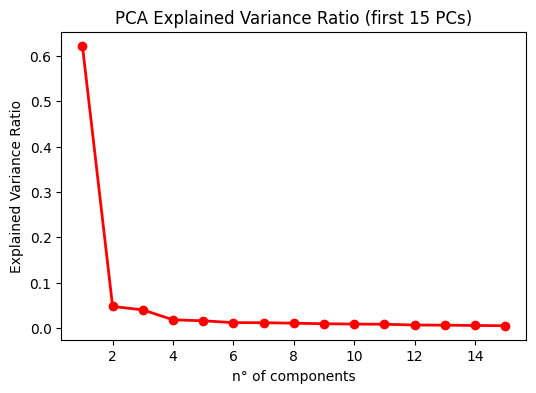

In [50]:
plt.figure(figsize=(6, 4))
reduce_length = 15
plt.plot((np.arange(pca.n_components_) + 1)[:reduce_length], pca.explained_variance_ratio_[:reduce_length], 'ro-', linewidth=2)
plt.title("PCA Explained Variance Ratio (first {} PCs)".format(reduce_length))
plt.xlabel("n° of components")
plt.ylabel("Explained Variance Ratio")

In [51]:
for x in range(4):
    print('PC{} Explained Variance Ratio: '.format(x+1), round(pca.explained_variance_ratio_[x]*100, 2), '%', sep='')

PC1 Explained Variance Ratio: 62.23%
PC2 Explained Variance Ratio: 4.77%
PC3 Explained Variance Ratio: 4.02%
PC4 Explained Variance Ratio: 1.82%


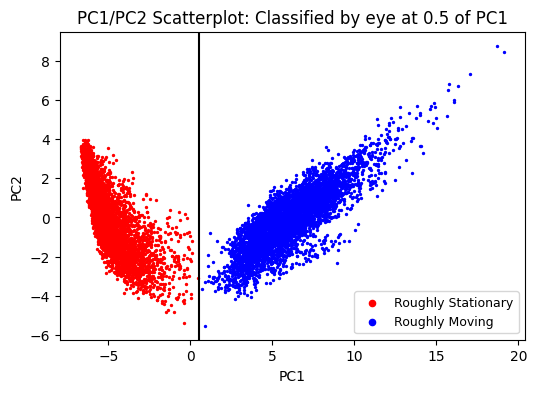

In [52]:
clf_by_look = 0.5
plt.figure(figsize=(6, 4))
plt.scatter(df_pca['PC1'].values[df_pca['PC1']<clf_by_look], df_pca['PC2'].values[df_pca['PC1']<clf_by_look], c='r', s=2, label='Roughly Stationary')
plt.scatter(df_pca['PC1'].values[df_pca['PC1']>=clf_by_look], df_pca['PC2'].values[df_pca['PC1']>=clf_by_look], c='b', s=2, label='Roughly Moving')
plt.title("PC1/PC2 Scatterplot: Classified by eye at {} of PC1".format(clf_by_look))
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.axvline(clf_by_look, c='k')
legend = plt.legend(loc='lower right', fontsize=9)
for x in range(2):
    legend.legendHandles[x]._sizes = [20]

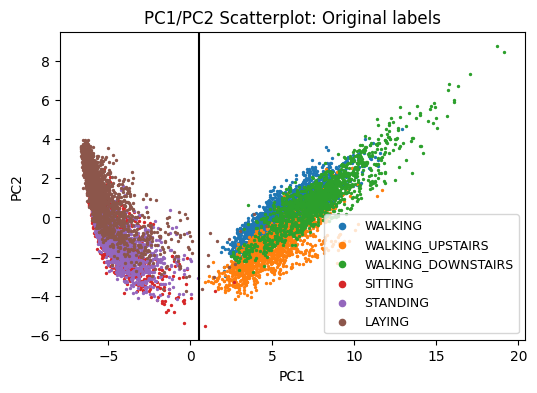

In [53]:
plt.figure(figsize=(6, 4))
for k, v in remap_dict.items():
    plt.scatter(df_pca[labels.values == k]['PC1'], df_pca[labels.values == k]['PC2'], label=v, s=2)
plt.title("PC1/PC2 Scatterplot: Original labels")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.axvline(clf_by_look, c='k')
legend = plt.legend(loc='lower right', fontsize=9)
for x in range(6):
    legend.legendHandles[x]._sizes = [20]
plt.show()

Text(0, 0.5, 'PC2')

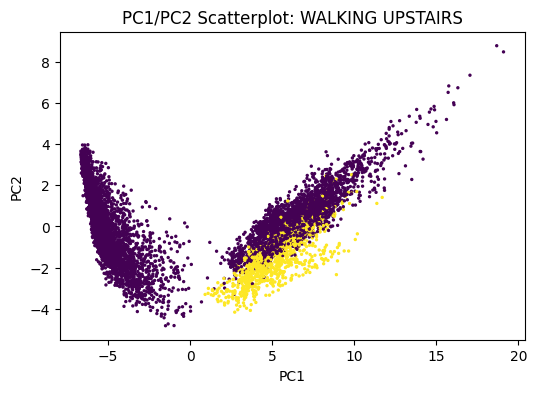

In [54]:
plt.figure(figsize=(6, 4))
plt.scatter(df_pca[:len(ind_train)].values[:,0], df_pca[:len(ind_train)].values[:,1], c=y_train, s=2)
plt.title("PC1/PC2 Scatterplot: WALKING UPSTAIRS")
plt.xlabel("PC1")
plt.ylabel("PC2")

It's not that good considering it perceive the variance as that of two distinct clusters (stationary and moving), inside those two there is a lot of overlapping, hereunder I analyzed the loadings of the variance explained by PC1

In [55]:
loadings = pd.DataFrame((abs(pca.components_)), columns=df.columns[2:], index=['PC'+str(i) for i in range(1, pca.n_components_+1)])[:1]
loadings

,1 tBodyAcc-mean()-X,2 tBodyAcc-mean()-Y,3 tBodyAcc-mean()-Z,4 tBodyAcc-std()-X,5 tBodyAcc-std()-Y,6 tBodyAcc-std()-Z,7 tBodyAcc-mad()-X,8 tBodyAcc-mad()-Y,9 tBodyAcc-mad()-Z,10 tBodyAcc-max()-X,...,552 fBodyBodyGyroJerkMag-meanFreq(),553 fBodyBodyGyroJerkMag-skewness(),554 fBodyBodyGyroJerkMag-kurtosis(),"555 angle(tBodyAccMean,gravity)","556 angle(tBodyAccJerkMean),gravityMean)","557 angle(tBodyGyroMean,gravityMean)","558 angle(tBodyGyroJerkMean,gravityMean)","559 angle(X,gravityMean)","560 angle(Y,gravityMean)","561 angle(Z,gravityMean)"
PC1,0.000011,0.000294,0.00026,0.072485,0.083685,0.064389,0.067979,0.080483,0.063358,0.08847,...,0.00558,0.013336,0.010927,0.00127,0.001081,0.001857,0.001935,0.036965,0.027084,0.021325


Here the most influenial features of PC1 (which explain over 60% of total variance), the threshold (loading_extract_lvl) I selected is kind of arbitrary (I used the plot I made afterwards to determine it)

In [56]:
loading_extract_lvl = 0.085
load_most_pc1 = loadings[loadings > loading_extract_lvl].T.dropna().T
load_most_pc1.T

,PC1
10 tBodyAcc-max()-X,0.088470
103 tBodyAccJerk-entropy()-X,0.107594
104 tBodyAccJerk-entropy()-Y,0.104647
105 tBodyAccJerk-entropy()-Z,0.100932
183 tBodyGyroJerk-entropy()-X,0.091157
184 tBodyGyroJerk-entropy()-Y,0.087326
185 tBodyGyroJerk-entropy()-Z,0.095634
209 tBodyAccMag-entropy(),0.108505
222 tGravityAccMag-entropy(),0.108505
235 tBodyAccJerkMag-entropy(),0.121879


Bar plot with the loadings on the y axis and the feature on the x axis, the number on the x axis doesn't hold any meaning other than indicating the number indicated on the label of the feature

Text(-23, 0.09100000000000001, 'Load over 0.085')

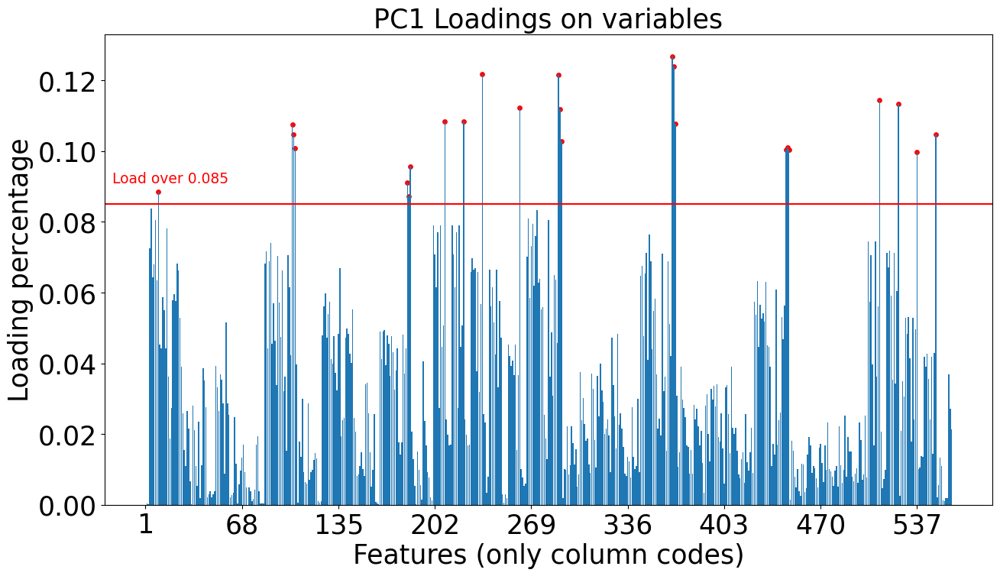

In [57]:
fig = plt.figure(figsize=(15, 8))

plt.bar(np.arange(0, len(loadings.columns)), loadings.T['PC1'])
plt.scatter(np.array([int(r[:3]) for r in dict(load_most_pc1).keys()])-1, (load_most_pc1).values, c='r', s=15)
plt.xlabel('Features (only column codes)', fontsize=25)
plt.ylabel('Loading percentage', fontsize=25)
plt.title('PC1 Loadings on variables',fontsize=25)
plt.xticks(np.arange(0, len(loadings.columns), 67), np.arange(0,len(loadings.columns), 67) +1, fontsize=25)
plt.yticks(fontsize=25)
plt.axhline(loading_extract_lvl, c='r')
plt.text(-23, loading_extract_lvl+0.006, s='Load over {}'.format(loading_extract_lvl), c='r', fontsize=13.5)

I used the PCA on the entire dataset to get a feeling of the internal structure of the data, but I will use the training and test set split as with feature selection to perform it now

In [58]:
pca_components = 4
pca = PCA(n_components=pca_components)
pca_train = pca.fit_transform(X_train)
pca_test = pca.transform(X_test)

In [59]:
remap_dict #just to remember it was used to get the labels in text from their number
reverted_map_dict = {v: k for k, v in remap_dict.items()} #just reverting it to get numbers from the text labels
mapping_color = {'WALKING' : 'b', 'WALKING_UPSTAIRS' : 'r', 'WALKING_DOWNSTAIRS' : 'g', 'SITTING' : 'y', 'STANDING' : 'c', 'LAYING' : 'm'} #setting the color I will use from now on

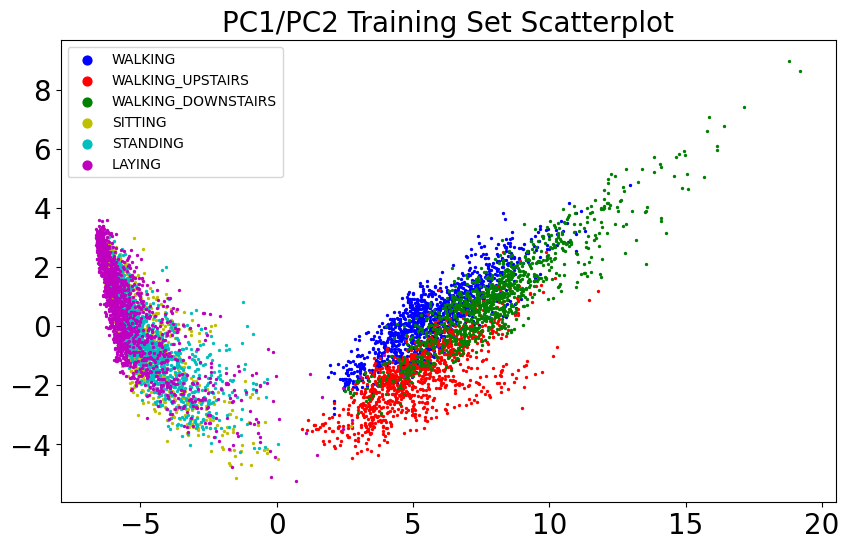

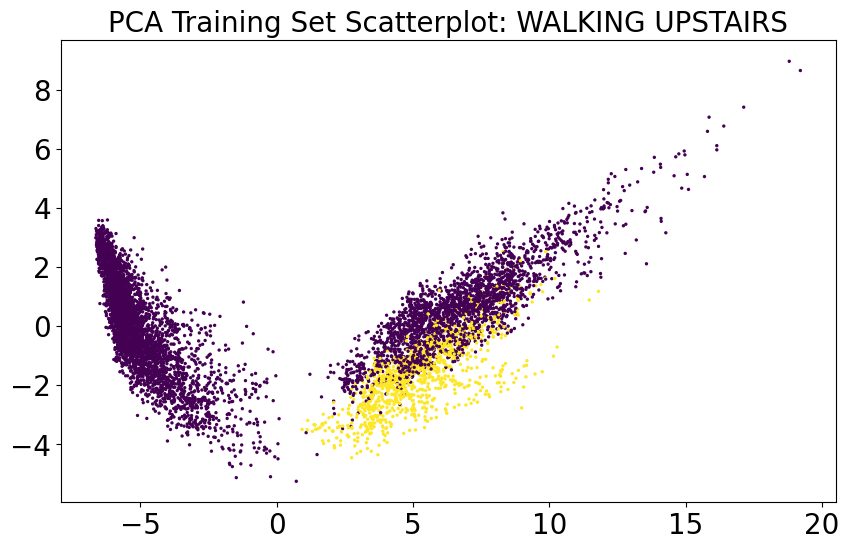

In [60]:
fig = plt.figure(figsize=(10, 6))

for action, color in mapping_color.items():
    number_action = reverted_map_dict[action] #getting the original numerical label
    plot_pca = pd.DataFrame(pca_train).loc[(labels_train == number_action).values].values
    plt.scatter(plot_pca[:, 0], plot_pca[:, 1], c=color, label=action, s=2)
    
plt.title('PC1/PC2 Training Set Scatterplot', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

legend = plt.legend()

for x in range(6):
    legend.legendHandles[x]._sizes = [40]
    
plt.show()

fig = plt.figure(figsize=(10, 6))

plt.scatter(pca_train[:,0], pca_train[:,1], c=y_train, s=2)

plt.title("PCA Training Set Scatterplot: WALKING UPSTAIRS", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [61]:
#Train and Predict
clf.fit(pca_train, y_train)
y_pred = clf.predict(pca_test)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(pca_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_PCA = auc(fpr, tpr)
print('ROC Curve:', roc_auc_PCA)

#saving the AUC results
auc_dict['PCA (4PC)'] = (roc_auc_PCA, pca_components)

[[2391   85]
 [ 116  355]]
Accuracy 0.9317950458092976
F1-score [0.95966285 0.77936334]
              precision    recall  f1-score   support

           0       0.95      0.97      0.96      2476
           1       0.81      0.75      0.78       471

    accuracy                           0.93      2947
   macro avg       0.88      0.86      0.87      2947
weighted avg       0.93      0.93      0.93      2947

ROC Curve: 0.9193308843453416


<font size = "4">Random Subspace Projection</font>

In [62]:
from sklearn import random_projection

rsp = random_projection.GaussianRandomProjection(n_components=2, random_state=42)
rsp_train = rsp.fit_transform(X_train)
rsp_test = rsp.transform(X_test)

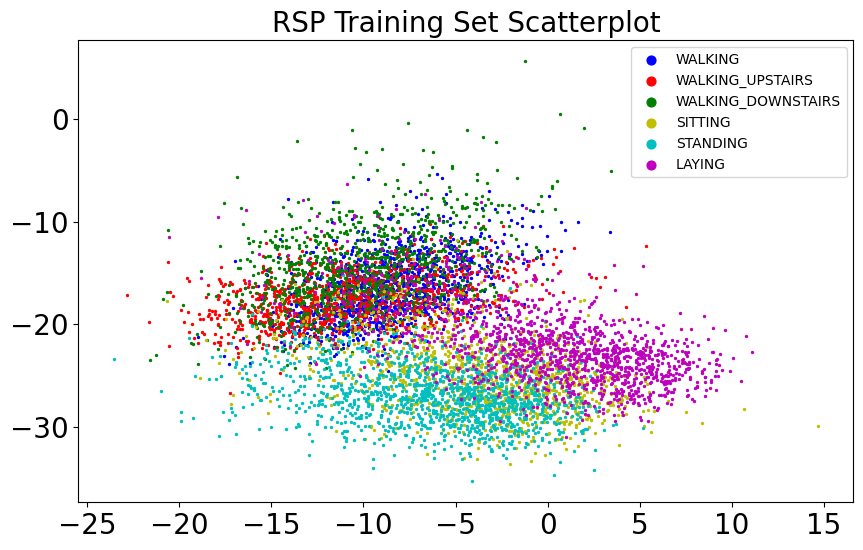

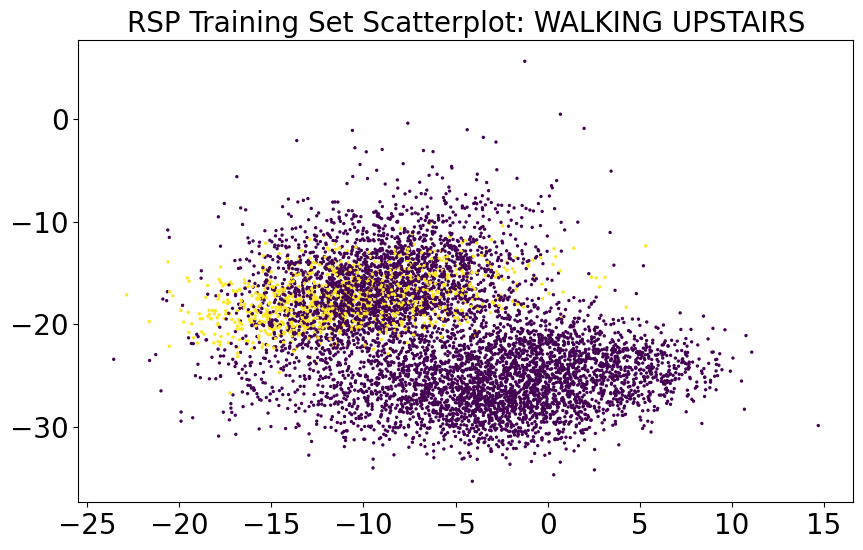

In [63]:
fig = plt.figure(figsize=(10, 6))

for action, color in mapping_color.items():
    number_action = reverted_map_dict[action] #getting the original numerical label
    plot_rsp = pd.DataFrame(rsp_train).loc[(labels_train == number_action).values].values
    plt.scatter(plot_rsp[:, 0], plot_rsp[:, 1], c=color, label=action, s=2)
    
plt.title('RSP Training Set Scatterplot', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

legend = plt.legend()

for x in range(6):
    legend.legendHandles[x]._sizes = [40]
    
plt.show()

fig = plt.figure(figsize=(10, 6))

plt.scatter(rsp_train[:,0], rsp_train[:,1], c=y_train, s=2)

plt.title("RSP Training Set Scatterplot: WALKING UPSTAIRS", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [64]:
#Train and Predict
clf.fit(rsp_train, y_train)
y_pred = clf.predict(rsp_test)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(rsp_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_RSP = auc(fpr, tpr)
print('ROC Curve:', roc_auc_RSP)

#saving the AUC results
auc_dict['Random Subspace Projection'] = (roc_auc_RSP, rsp.n_components)

[[2227  249]
 [ 339  132]]
Accuracy 0.8004750593824228
F1-score [0.88337961 0.30985915]
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2476
           1       0.35      0.28      0.31       471

    accuracy                           0.80      2947
   macro avg       0.61      0.59      0.60      2947
weighted avg       0.78      0.80      0.79      2947

ROC Curve: 0.6741791259788235


<font size = "4">Multi Dimensional Scaling</font>

WARNING: Slow (it took around 1 hour)

MDS doesn't use the fitting to transform other data, I had to split after fitting and trasnforming the entire dataset

In [65]:
from sklearn.manifold import MDS

mds = MDS(n_components=2, random_state=42)
mds_df = pd.DataFrame(mds.fit_transform(df[df.columns[2:]]))
mds_train = mds_df[:len(ind_train)].values
mds_test = mds_df[len(ind_train):].values

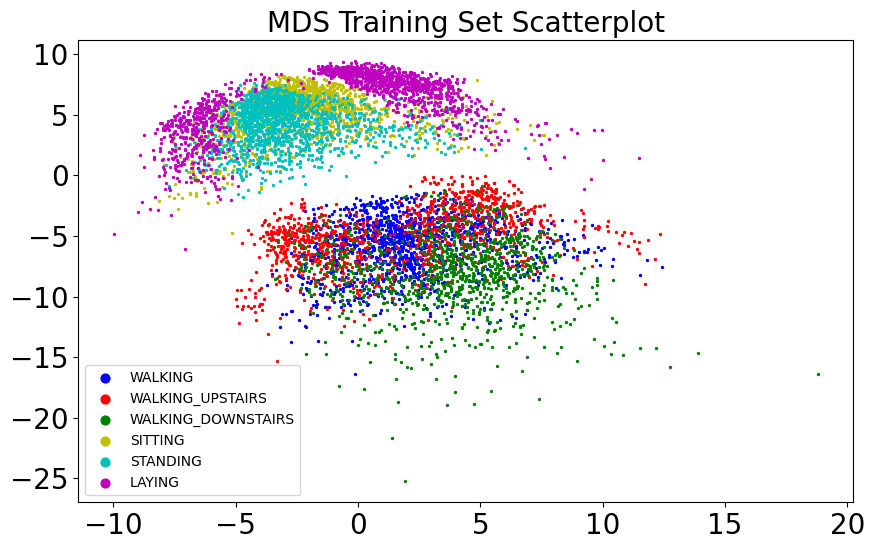

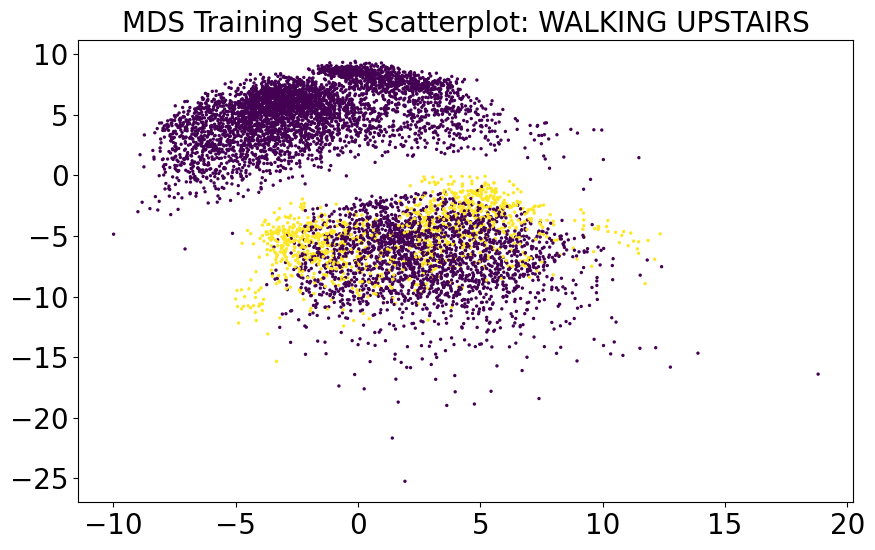

In [66]:
fig = plt.figure(figsize=(10, 6))

for action, color in mapping_color.items():
    number_action = reverted_map_dict[action] #getting the original numerical label
    plot_mds = pd.DataFrame(mds_train).loc[(labels_train == number_action).values].values
    plt.scatter(plot_mds[:, 0], plot_mds[:, 1], c=color, label=action, s=2)
    
plt.title('MDS Training Set Scatterplot', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

legend = plt.legend()

for x in range(6):
    legend.legendHandles[x]._sizes = [40]
    
plt.show()

fig = plt.figure(figsize=(10, 6))

plt.scatter(mds_train[:,0], mds_train[:,1], c=y_train, s=2)

plt.title("MDS Training Set Scatterplot: WALKING UPSTAIRS", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [67]:
#Train and Predict
clf.fit(mds_train, y_train)
y_pred = clf.predict(mds_test)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(mds_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_MDS = auc(fpr, tpr)
print('ROC Curve:', roc_auc_MDS)

#saving the AUC results
auc_dict['Multi Dimensional Scaling'] = (roc_auc_MDS, mds.n_components)

[[2270  206]
 [ 241  230]]
Accuracy 0.848320325755005
F1-score [0.91036695 0.50716648]
              precision    recall  f1-score   support

           0       0.90      0.92      0.91      2476
           1       0.53      0.49      0.51       471

    accuracy                           0.85      2947
   macro avg       0.72      0.70      0.71      2947
weighted avg       0.84      0.85      0.85      2947

ROC Curve: 0.7702388792278485


<font size = "4">IsoMap</font>

In [68]:
from sklearn.manifold import Isomap

iso = Isomap(n_neighbors=15, n_components=2)
iso_train = iso.fit_transform(X_train)
iso_test = iso.transform(X_test)

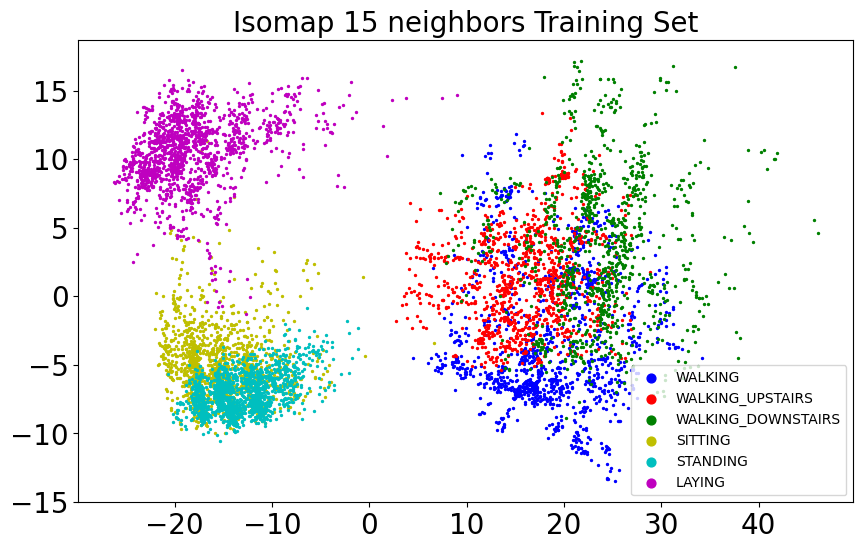

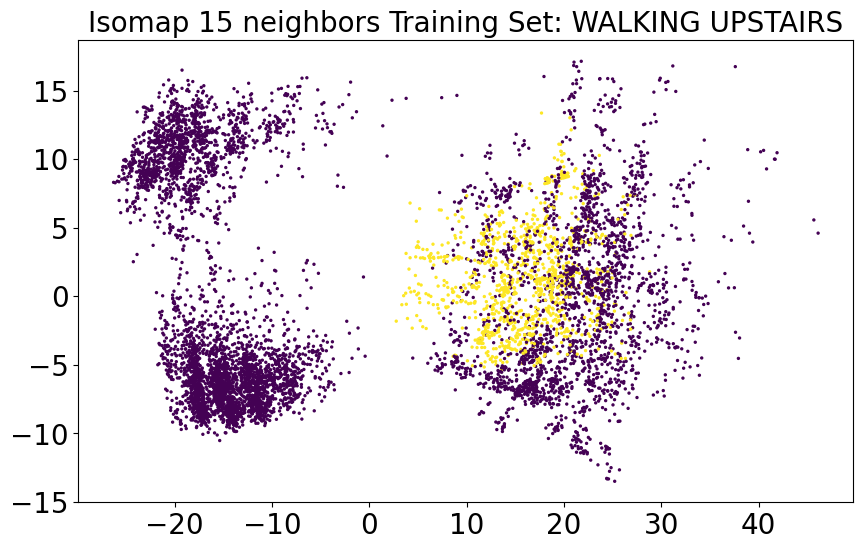

In [69]:
fig = plt.figure(figsize=(10, 6))

for action, color in mapping_color.items():
    number_action = reverted_map_dict[action] #getting the original numerical label
    plot_iso = pd.DataFrame(iso_train).loc[(labels_train == number_action).values].values
    plt.scatter(plot_iso[:, 0], plot_iso[:, 1], c=color, label=action, s=2)
    
plt.title('Isomap 15 neighbors Training Set', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

legend = plt.legend()

for x in range(6):
    legend.legendHandles[x]._sizes = [40]
    
plt.show()

fig = plt.figure(figsize=(10, 6))

plt.scatter(iso_train[:,0], iso_train[:,1], c=y_train, s=2)

plt.title("Isomap 15 neighbors Training Set: WALKING UPSTAIRS", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [70]:
#Train and Predict
clf.fit(iso_train, y_train)
y_pred = clf.predict(iso_test)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(iso_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_ISO = auc(fpr, tpr)
print('ROC Curve:', roc_auc_ISO)

#saving the AUC results
auc_dict['Isomap'] = (roc_auc_ISO, iso.n_components)

[[2295  181]
 [ 194  277]]
Accuracy 0.8727519511367492
F1-score [0.9244713  0.59634015]
              precision    recall  f1-score   support

           0       0.92      0.93      0.92      2476
           1       0.60      0.59      0.60       471

    accuracy                           0.87      2947
   macro avg       0.76      0.76      0.76      2947
weighted avg       0.87      0.87      0.87      2947

ROC Curve: 0.8182290969957022


<font size = "4">t-SNE</font>

tSNE doesn't use the fitting to transform other data, I had to split after fitting and trasnforming the entire dataset

In [71]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, init='random', learning_rate='auto', random_state=42)
tsne_df = pd.DataFrame(tsne.fit_transform(df[df.columns[2:]]))
tsne_train = tsne_df[:len(ind_train)].values
tsne_test = tsne_df[len(ind_train):].values

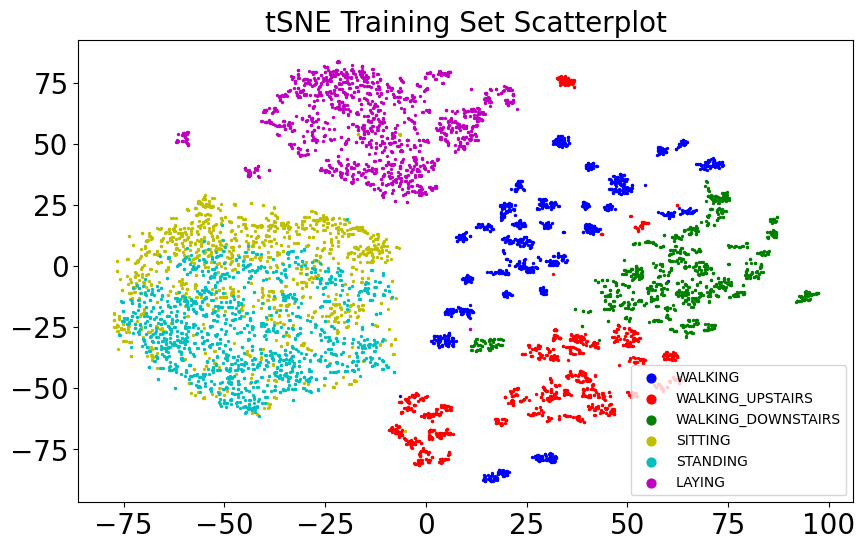

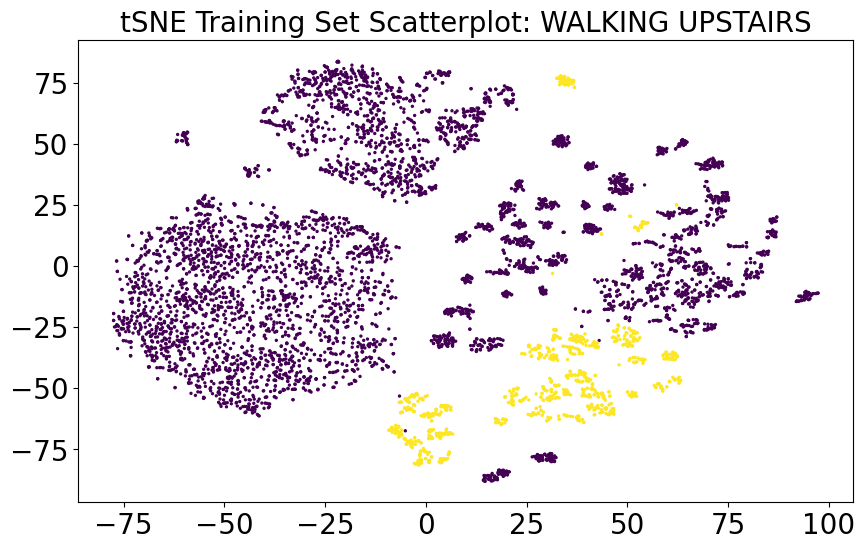

In [72]:
fig = plt.figure(figsize=(10, 6))

for action, color in mapping_color.items():
    number_action = reverted_map_dict[action] #getting the original numerical label
    plot_tsne = pd.DataFrame(tsne_train).loc[(labels_train == number_action).values].values
    plt.scatter(plot_tsne[:, 0], plot_tsne[:, 1], c=color, label=action, s=2)
    
plt.title('tSNE Training Set Scatterplot', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

legend = plt.legend()

for x in range(6):
    legend.legendHandles[x]._sizes = [40]
    
plt.show()

fig = plt.figure(figsize=(10, 6))

plt.scatter(tsne_train[:,0], tsne_train[:,1], c=y_train, s=2)

plt.title("tSNE Training Set Scatterplot: WALKING UPSTAIRS", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [73]:
#Train and Predict
clf.fit(tsne_train, y_train)
y_pred = clf.predict(tsne_test)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(tsne_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_tSNE = auc(fpr, tpr)
print('ROC Curve:', roc_auc_tSNE)

#saving the AUC results
auc_dict['tSNE'] = (roc_auc_tSNE, tsne.n_components)

[[2426   50]
 [  90  381]]
Accuracy 0.9524940617577197
F1-score [0.97195513 0.84478936]
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      2476
           1       0.88      0.81      0.84       471

    accuracy                           0.95      2947
   macro avg       0.92      0.89      0.91      2947
weighted avg       0.95      0.95      0.95      2947

ROC Curve: 0.9199491337648218


Now I looked at the resulting AUC for each reduction technique, PCA and tSNE give the best results with a classifier but regarding the explainability of the models it's better to use some feature reduction technique, I opted for the Feature Importance as it had a solid AUC score and it didn't have neither few nor too many features to build explainable models. </br></br> I also kept the tSNE results in mind for how well it separated correctly the different cluster of records pertaining to each class (I will use that later)

In [74]:
pd.DataFrame(auc_dict, index=['ROC AUC', 'n° Features']).T

,ROC AUC,n° Features
Original Dataset,0.831840,561.0
Feature Importance from DT,0.853023,11.0
Variance Threshold,0.875272,99.0
Univariate Feature Selection,0.848274,11.0
Recursive Feature Elimination,0.834079,32.0
PCA (4PC),0.919331,4.0
Random Subspace Projection,0.674179,2.0
Multi Dimensional Scaling,0.770239,2.0
Isomap,0.818229,2.0
tSNE,0.919949,2.0


<font size = "4">Exploring K-Means results</font>

In [75]:
from sklearn.cluster import KMeans

x_select = df_select.values

kmeans = KMeans(n_clusters=6, n_init=10, max_iter=100) #didn't tune because I just wanted six clusters because I know the actual labels
kmeans.fit(x_select)

centroids = kmeans.cluster_centers_
clusters = kmeans.labels_ + 1
inertia = kmeans.inertia_

print("SSE:", inertia)

SSE: 3106.221687586178


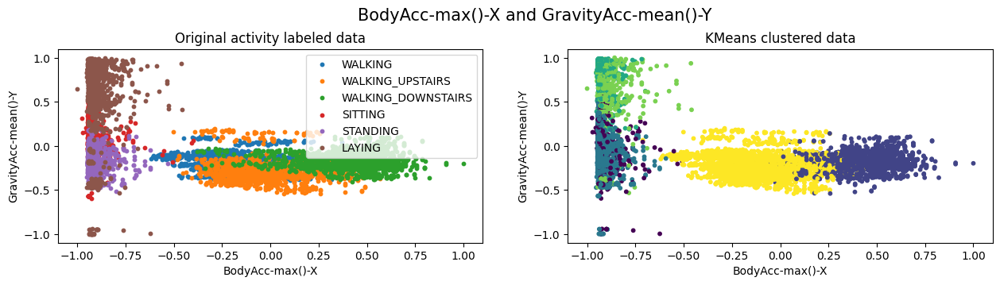

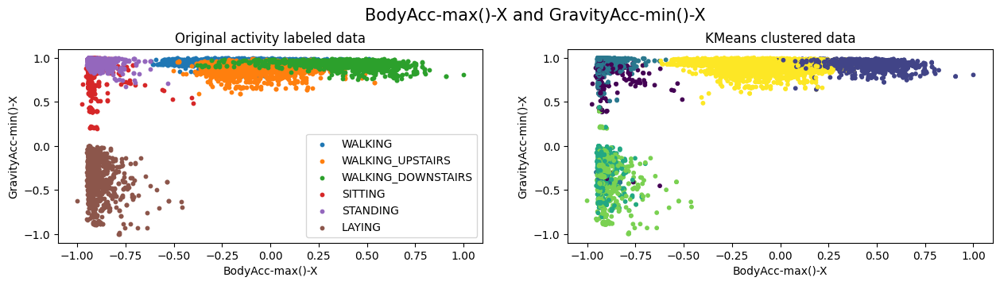

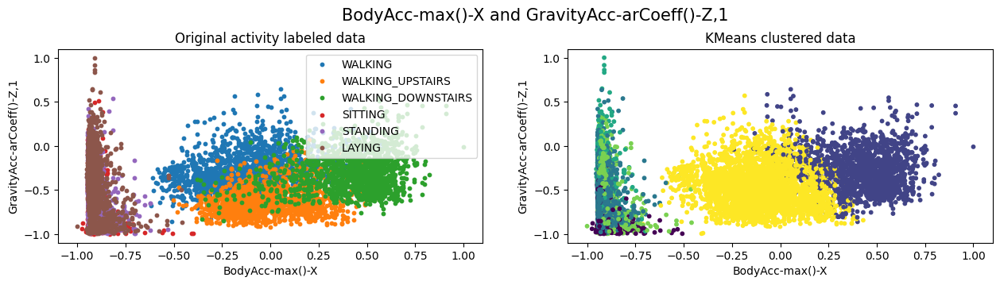

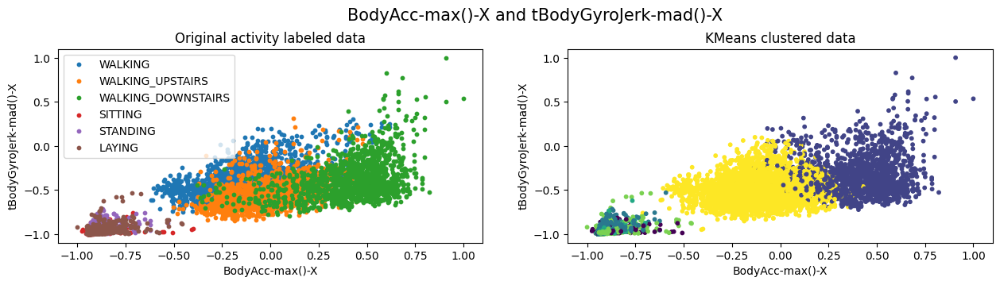

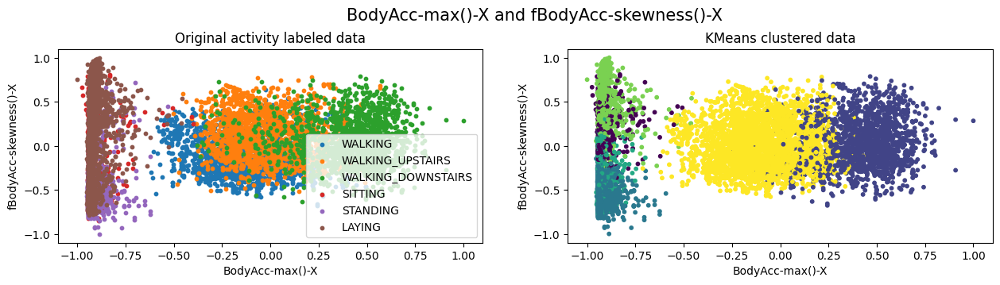

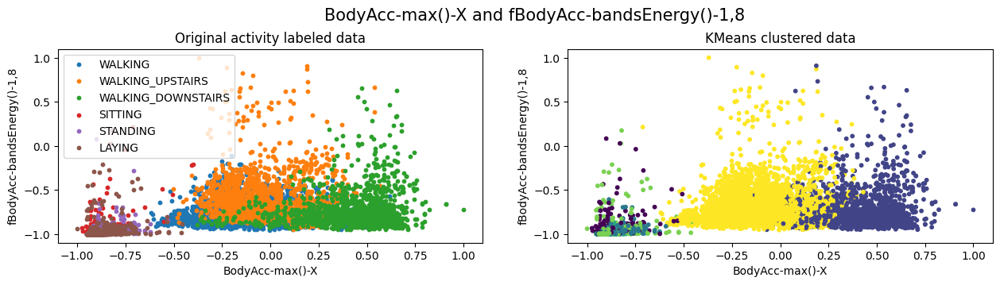

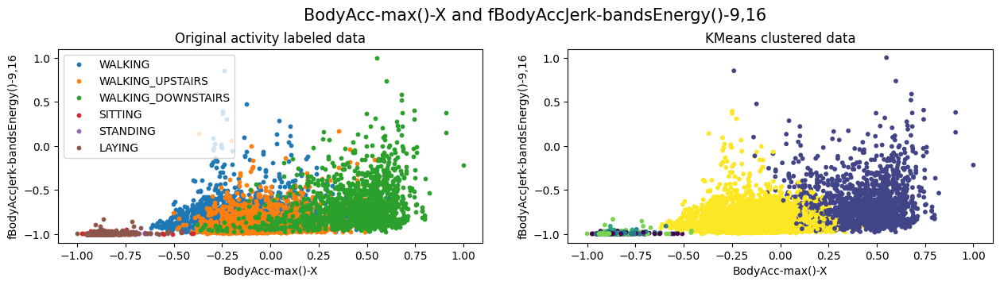

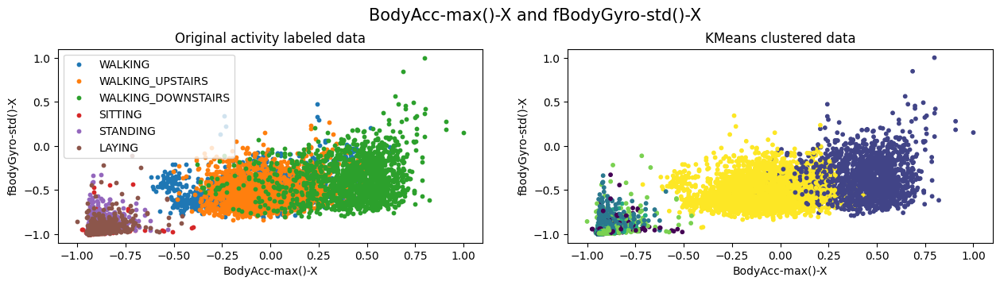

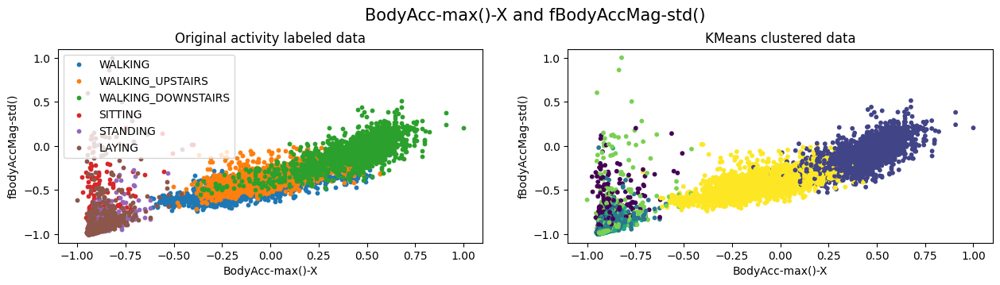

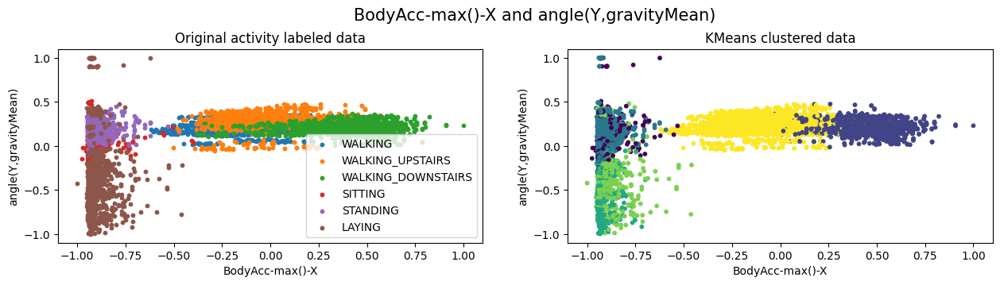

In [76]:
x_feature = '10 tBodyAcc-max()-X'
for col in df_select.columns:
    if col != x_feature:
        y_feature = col
        fig = plt.subplots(figsize=(40, 26))
        fig_dims = (7, 5)

        x = list(df_select.columns).index(x_feature)
        y = list(df_select.columns).index(y_feature)

        plt.suptitle("{} and {}".format(x_feature[4:], y_feature[4:]), x=0.275, y=0.9, fontsize=15)
        plt.subplot2grid((fig_dims), (0, 0), title="Original activity labeled data")
        for k, v in remap_dict.items():
            plt.scatter(df_select[labels.values == k].values[:,x], df_select[labels.values == k].values[:,y], label = v, s=10)
        plt.xlabel(x_feature[4:])
        plt.ylabel(y_feature[4:])
        plt.legend()
        plt.subplot2grid((fig_dims), (0, 1), title="KMeans clustered data")
        plt.scatter(x_select[:,x], x_select[:,y], c=clusters, s=10)
        plt.xlabel(x_feature[4:])
        plt.ylabel(y_feature[4:])

In [77]:
df_select.columns

Index(['10 tBodyAcc-max()-X', '42 tGravityAcc-mean()-Y',
       '53 tGravityAcc-min()-X', '74 tGravityAcc-arCoeff()-Z,1',
       '167 tBodyGyroJerk-mad()-X', '297 fBodyAcc-skewness()-X',
       '331 fBodyAcc-bandsEnergy()-1,8', '411 fBodyAccJerk-bandsEnergy()-9,16',
       '427 fBodyGyro-std()-X', '504 fBodyAccMag-std()',
       '560 angle(Y,gravityMean)'],
      dtype='object')

One hot encoding to count how much kmeans captured the actual labels

In [78]:
from sklearn.preprocessing import LabelBinarizer

encode = LabelBinarizer()
encode.fit(clusters)
transf = encode.transform(clusters)
one_hot_df = pd.DataFrame(transf)
one_hot_df.columns = np.unique(clusters)

check_correspondence = pd.concat([pd.Series(remapped_labels), one_hot_df], axis=1)
check_correspondence = check_correspondence.groupby(0).agg(['sum'])
check_correspondence.insert(loc=0, column='count', value=pd.Series(remapped_labels).value_counts())
check_correspondence

,count,1,2,3,4,5,6
,,sum,sum,sum,sum,sum,sum
0,,,,,,,
LAYING,1944,20,0,28,974,922,0
SITTING,1777,416,0,1327,7,24,3
STANDING,1906,166,0,1740,0,0,0
WALKING,1722,0,222,1,0,0,1499
WALKING_DOWNSTAIRS,1406,0,1230,0,0,0,176
WALKING_UPSTAIRS,1544,0,126,0,0,0,1418


<font size = "4">Now I test some classifier with the features I selected</font>

In [79]:
df_select

,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
0,-0.934724,-0.140840,0.977436,-0.995112,-0.992165,0.142051,-0.993592,-0.999766,-0.985033,-0.956134,0.179941
1,-0.943068,-0.141551,0.984520,-0.833882,-0.989876,-0.692541,-0.998235,-0.999846,-0.984904,-0.975866,0.180289
2,-0.938692,-0.142010,0.986770,-0.705039,-0.987868,-0.727227,-0.999388,-0.999784,-0.976642,-0.989015,0.180637
3,-0.938692,-0.143976,0.986821,-0.385410,-0.991241,-0.599118,-0.999807,-0.999724,-0.992810,-0.986742,0.181935
4,-0.942469,-0.148750,0.987434,-0.237474,-0.992882,-0.676997,-0.999806,-0.999853,-0.985982,-0.990063,0.185151
...,...,...,...,...,...,...,...,...,...,...,...
10294,0.185361,-0.276718,0.903413,-0.258938,-0.652975,-0.073249,-0.708900,-0.797782,-0.590484,-0.332141,0.274627
10295,0.185361,-0.274976,0.903793,-0.432021,-0.626430,-0.328521,-0.685810,-0.838436,-0.478150,-0.316954,0.273578
10296,0.007471,-0.276165,0.903793,-0.523912,-0.653267,0.143487,-0.735537,-0.834130,-0.463566,-0.377240,0.274479
10297,0.007471,-0.262356,0.909007,-0.411005,-0.716997,0.233824,-0.721997,-0.747012,-0.681748,-0.390201,0.264782


In [80]:
#Just as a memorandum, the target var. is Walking Upstairs
y = pd.Series(1 if i == 'WALKING_UPSTAIRS' else 0 for i in df['label'])
y_train, y_test = y[:len(ind_train)], y[len(ind_train):]

In [81]:
#Resetting the training and test set
X_train, X_test = df_select[:len(ind_train)], df_select[len(ind_train):]

#Setting the simplest parameter for the dt classifier
clf = DecisionTreeClassifier(min_samples_leaf=3, random_state=42)

#Train and Predict
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(X_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
print('ROC Curve:', auc(fpr, tpr))

[[2379   97]
 [ 141  330]]
Accuracy 0.9192399049881235
F1-score [0.95236189 0.73496659]
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      2476
           1       0.77      0.70      0.73       471

    accuracy                           0.92      2947
   macro avg       0.86      0.83      0.84      2947
weighted avg       0.92      0.92      0.92      2947

ROC Curve: 0.8530229909895078


In [82]:
from sklearn.neighbors import KNeighborsClassifier

#Resetting the training and test set
X_train, X_test = df_select[:len(ind_train)], df_select[len(ind_train):]

#Setting the simplest parameter for the dt classifier
clf = KNeighborsClassifier(n_neighbors=5)

#Train and Predict
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(X_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
print('ROC Curve:', auc(fpr, tpr))

[[2444   32]
 [ 100  371]]
Accuracy 0.9552086868001357
F1-score [0.97370518 0.84897025]
              precision    recall  f1-score   support

           0       0.96      0.99      0.97      2476
           1       0.92      0.79      0.85       471

    accuracy                           0.96      2947
   macro avg       0.94      0.89      0.91      2947
weighted avg       0.95      0.96      0.95      2947

ROC Curve: 0.9393648237517536


I reassigned the dataframe variable to not making mistakes as I will mainly use the data frame after feature selection

In [83]:
df_bkp = df
df = df_select
df.insert(loc=0, column='label', value=remapped_labels)
df.insert(loc=1, column='individuals', value=individuals.values)
df

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
0,STANDING,1,-0.934724,-0.140840,0.977436,-0.995112,-0.992165,0.142051,-0.993592,-0.999766,-0.985033,-0.956134,0.179941
1,STANDING,1,-0.943068,-0.141551,0.984520,-0.833882,-0.989876,-0.692541,-0.998235,-0.999846,-0.984904,-0.975866,0.180289
2,STANDING,1,-0.938692,-0.142010,0.986770,-0.705039,-0.987868,-0.727227,-0.999388,-0.999784,-0.976642,-0.989015,0.180637
3,STANDING,1,-0.938692,-0.143976,0.986821,-0.385410,-0.991241,-0.599118,-0.999807,-0.999724,-0.992810,-0.986742,0.181935
4,STANDING,1,-0.942469,-0.148750,0.987434,-0.237474,-0.992882,-0.676997,-0.999806,-0.999853,-0.985982,-0.990063,0.185151
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10294,WALKING_UPSTAIRS,24,0.185361,-0.276718,0.903413,-0.258938,-0.652975,-0.073249,-0.708900,-0.797782,-0.590484,-0.332141,0.274627
10295,WALKING_UPSTAIRS,24,0.185361,-0.274976,0.903793,-0.432021,-0.626430,-0.328521,-0.685810,-0.838436,-0.478150,-0.316954,0.273578
10296,WALKING_UPSTAIRS,24,0.007471,-0.276165,0.903793,-0.523912,-0.653267,0.143487,-0.735537,-0.834130,-0.463566,-0.377240,0.274479
10297,WALKING_UPSTAIRS,24,0.007471,-0.262356,0.909007,-0.411005,-0.716997,0.233824,-0.721997,-0.747012,-0.681748,-0.390201,0.264782


Before moving on I considered to redo the classification with the decision tree doing the gridsearch before and the pruning after using the algorithm to get the real maximum performances I could get

In [84]:
from sklearn.model_selection import GridSearchCV
from sklearn import tree
from sklearn.tree._tree import TREE_LEAF

def is_leaf(inner_tree, index):
    # Check whether node is leaf node
    return (inner_tree.children_left[index] == TREE_LEAF and
            inner_tree.children_right[index] == TREE_LEAF)

def prune_index(inner_tree, decisions, index=0):
    # Start pruning from the bottom - if we start from the top, we might miss
    # nodes that become leaves during pruning.
    # Do not use this directly - use prune_duplicate_leaves instead.
    if not is_leaf(inner_tree, inner_tree.children_left[index]):
        prune_index(inner_tree, decisions, inner_tree.children_left[index])
    if not is_leaf(inner_tree, inner_tree.children_right[index]):
        prune_index(inner_tree, decisions, inner_tree.children_right[index])

    # Prune children if both children are leaves now and make the same decision:
    if (is_leaf(inner_tree, inner_tree.children_left[index]) and
        is_leaf(inner_tree, inner_tree.children_right[index]) and
        (decisions[index] == decisions[inner_tree.children_left[index]]) and
        (decisions[index] == decisions[inner_tree.children_right[index]])):
        # turn node into a leaf by "unlinking" its children
        inner_tree.children_left[index] = TREE_LEAF
        inner_tree.children_right[index] = TREE_LEAF
        # print("Pruned {}".format(index))

def prune_duplicate_leaves(dt):
    # Remove leaves if both
    decisions = dt.tree_.value.argmax(axis=2).flatten().tolist()  # Decision for each node
    prune_index(dt.tree_, decisions)

Here I decided to select the best classifier of a binary classification according to the AUC score of the ROC curve and within the classifier I decided to use the threshold that produced the maximum F1 Score, I wrote a function to avoid repeating long blocks of code many times

In [85]:
def best_class(X_train, y_train, X_test, y_test, target, classifier):
    print(classifier)

    #Gridsearch
    if str(classifier) == 'DecisionTreeClassifier()':
        param_grid = [{'min_samples_leaf' : [1,6], 
                      'criterion' : ['entropy'],
                      'max_depth': [1000, 3], 
                      'random_state' : [42], 
                      'min_samples_split' : [2, 5, 10]}]
        name_clf = 'DT'
    elif str(classifier) == 'KNeighborsClassifier()':
        param_grid = [{'n_neighbors' : np.arange(1,20).tolist()}]
        name_clf = 'KNN'

    gridsearch = GridSearchCV(classifier, param_grid, cv=5, scoring='roc_auc', error_score='raise')
    gridsearch.fit(X_train, y_train)

    #Training
    clf = gridsearch.best_estimator_
    print('Predicting {} with the {}:'.format(target.replace('_', ' '), name_clf))
    print(clf)
    clf.fit(X_train, y_train)

    #Pruning
    if classifier == DecisionTreeClassifier():
        prune_duplicate_leaves(clf)

    #Predicting
    y_score = clf.predict_proba(X_test)

    #Computing the ROC Curve
    fpr, tpr, thr = roc_curve(y_test, y_score[:, 1])
    roc_auc = auc(fpr, tpr)

    #Computing the best threshold according to the F1 score
    f1_max_idx = np.argmax([f1_score(y_test, (y_score[:,1] >= t)) for t in thr])
    thr_f1_max = thr[f1_max_idx]

    #Computing the prediction according to the threshold
    y_pred = (y_score[:,1] >= thr_f1_max)

    #Printing the classification results
    print('\nArea Under the Curve (ROC):', roc_auc)
    print('\nConfusion Matrix: (threshold used: {})\n'.format(thr_f1_max), confusion_matrix(y_test, y_pred, labels=[1,0]))
    print(classification_report(y_test, y_pred))

    #Printing the percentages of the majority and minority class
    print('Minority class represents {:.2%} of the data'.format(np.min(np.unique(y_train, return_counts=True)[1])/len(X_train)), sep='')
    print('Majority class represents {:.2%} of the data'.format(np.max(np.unique(y_train, return_counts=True)[1])/len(X_train)), sep='')

    #Plot the ROC Curve of the classification of this label
    plt.plot(fpr, tpr, label='{cl} {action}: {auc:.2f}'.format(cl=name_clf, action=target.replace('_',' '), auc=roc_auc))

    #plotting the TPR / FPR points according to the maximum threshold analyzed
    plt.scatter(fpr[f1_max_idx], tpr[f1_max_idx], c='k', s=60)
    print()

    plt.plot([0,1], [0,1], 'k--') #adding the baseline
    plt.title("ROC Curves (Max AUC w/ Max F1)", fontsize=18)
    plt.ylabel('TPR',fontsize=18)
    plt.xlabel('FPR',fontsize=18)
    plt.yticks(fontsize=20)
    plt.xticks(fontsize=20)
    plt.legend(fontsize=14)
    print()
    return np.array(y_pred, dtype=int)

Here the results for Walking Upstairs

DecisionTreeClassifier()
Predicting WALKING UPSTAIRS with the DT:
DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=42)

Area Under the Curve (ROC): 0.9328830659683278

Confusion Matrix: (threshold used: 0.8739754098360656)
 [[ 315  156]
 [  65 2411]]
              precision    recall  f1-score   support

           0       0.94      0.97      0.96      2476
           1       0.83      0.67      0.74       471

    accuracy                           0.93      2947
   macro avg       0.88      0.82      0.85      2947
weighted avg       0.92      0.93      0.92      2947

Minority class represents 14.59% of the data
Majority class represents 85.41% of the data


KNeighborsClassifier()
Predicting WALKING UPSTAIRS with the KNN:
KNeighborsClassifier(n_neighbors=19)

Area Under the Curve (ROC): 0.968505722880202

Confusion Matrix: (threshold used: 0.3157894736842105)
 [[ 408   63]
 [  66 2410]]
              precision    recall  f1-score   support

           0       0.

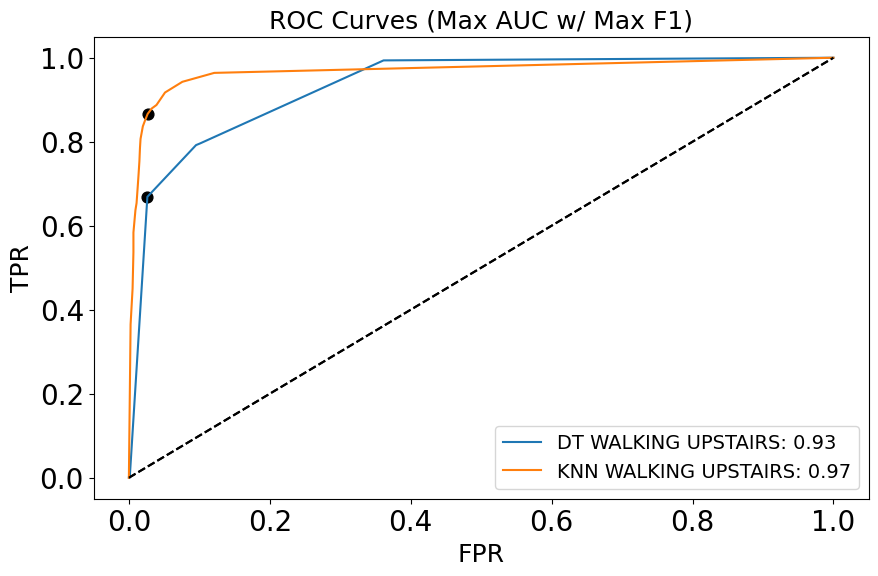

In [86]:
target = 'WALKING_UPSTAIRS'
fig = plt.figure(figsize=(10, 6))

for classifier in [DecisionTreeClassifier(), KNeighborsClassifier()]:
    y = pd.Series(1 if i == target else 0 for i in df['label'])
    y_train, y_test = y[:len(ind_train)], y[len(ind_train):]

    best_class(X_train, y_train, X_test, y_test, target, classifier)

WARNING: Slow (It took around 20 minutes)

Here the performances of each classifier for each target variable. As it can be seen the performances of the Decision Tree's ROC for most targets improved by a factor between 3 and 6 percent... Not that much, except for the classifier that predicts WALKING UPSTAIRS which reached an increase in ROC AUC score by 10%

DecisionTreeClassifier()
Predicting STANDING with the DT:
DecisionTreeClassifier(criterion='entropy', max_depth=3, min_samples_leaf=6,
                       random_state=42)

Area Under the Curve (ROC): 0.9626842727937858

Confusion Matrix: (threshold used: 0.9146153846153846)
 [[ 424  108]
 [  88 2327]]
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      2415
           1       0.83      0.80      0.81       532

    accuracy                           0.93      2947
   macro avg       0.89      0.88      0.89      2947
weighted avg       0.93      0.93      0.93      2947

Minority class represents 18.69% of the data
Majority class represents 81.31% of the data


DecisionTreeClassifier()
Predicting SITTING with the DT:
DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=42)

Area Under the Curve (ROC): 0.9605384709792553

Confusion Matrix: (threshold used: 0.8647058823529412)
 [[ 401   90]
 [ 108 2348]]
           

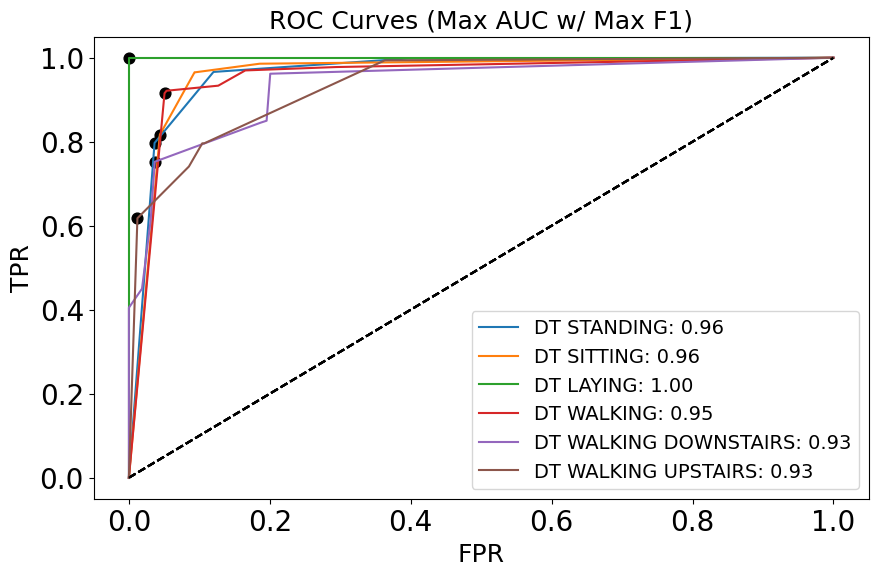

KNeighborsClassifier()
Predicting STANDING with the KNN:
KNeighborsClassifier(n_neighbors=16)

Area Under the Curve (ROC): 0.9897784056414328

Confusion Matrix: (threshold used: 0.5625)
 [[ 497   35]
 [  87 2328]]
              precision    recall  f1-score   support

           0       0.99      0.96      0.97      2415
           1       0.85      0.93      0.89       532

    accuracy                           0.96      2947
   macro avg       0.92      0.95      0.93      2947
weighted avg       0.96      0.96      0.96      2947

Minority class represents 18.69% of the data
Majority class represents 81.31% of the data


KNeighborsClassifier()
Predicting SITTING with the KNN:
KNeighborsClassifier(n_neighbors=19)

Area Under the Curve (ROC): 0.9851728507267625

Confusion Matrix: (threshold used: 0.47368421052631576)
 [[ 410   81]
 [  40 2416]]
              precision    recall  f1-score   support

           0       0.97      0.98      0.98      2456
           1       0.91      0.8

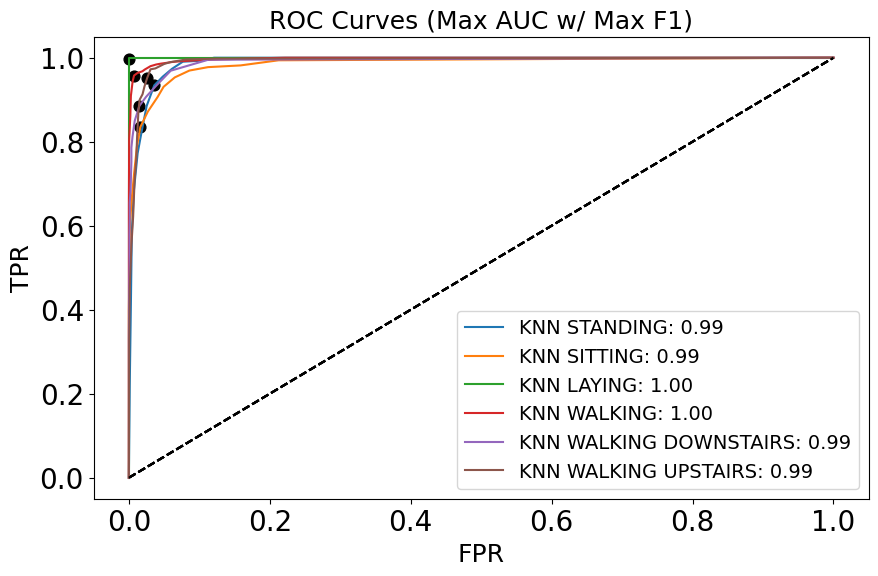

In [87]:
for classifier in [DecisionTreeClassifier(), KNeighborsClassifier()]:
  
    X = df.drop(columns=['label', 'individuals'])
    X_train, X_test = df_train.copy(deep=True).values, df_test.copy(deep=True).values #the original split

    fig = plt.figure(figsize=(10, 6))

    for target in df['label'].unique():
        y = pd.Series(1 if i == target else 0 for i in df['label'])
        y_train, y_test = y[:len(ind_train)], y[len(ind_train):]

        best_class(X_train, y_train, X_test, y_test, target, classifier)

    plt.show()

# Imbalance Learning

This section is the most didactical part of the project as there weren't imbalance in the data as I pointed out in the next cell, as such I had to create some temporary imbalances to test some techniques.

In [88]:
for x in df['label'].unique():
    print('{}: {:.2%}'.format(x[0]+x[1:].lower().replace('_', ' '), sum(df['label'] == x) / len(df)), end='\n')

Standing: 18.51%
Sitting: 17.25%
Laying: 18.88%
Walking: 16.72%
Walking downstairs: 13.65%
Walking upstairs: 14.99%


Here I selected as a target variable again Walking Upstairs, then I reduced by sampling the number of records with that label to 32

In [89]:
reduced_record_n = 32

X_train, X_test = df[:len(ind_train)].copy(deep=True), df[len(ind_train):].copy(deep=True)
X_train['index'] = X_train.index

target = 'WALKING_UPSTAIRS'
target_train = X_train[X_train['label'] == target]
undersampled_target_train = target_train.sample(n=reduced_record_n, random_state=42)

indexes_to_drop = []
for el in target_train['index'].values:
    if el not in undersampled_target_train['index'].values:
        indexes_to_drop.append(el)

undersampled = X_train.drop(indexes_to_drop, axis='index')

undersampled

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)",index
0,STANDING,1,-0.934724,-0.140840,0.977436,-0.995112,-0.992165,0.142051,-0.993592,-0.999766,-0.985033,-0.956134,0.179941,0
1,STANDING,1,-0.943068,-0.141551,0.984520,-0.833882,-0.989876,-0.692541,-0.998235,-0.999846,-0.984904,-0.975866,0.180289,1
2,STANDING,1,-0.938692,-0.142010,0.986770,-0.705039,-0.987868,-0.727227,-0.999388,-0.999784,-0.976642,-0.989015,0.180637,2
3,STANDING,1,-0.938692,-0.143976,0.986821,-0.385410,-0.991241,-0.599118,-0.999807,-0.999724,-0.992810,-0.986742,0.181935,3
4,STANDING,1,-0.942469,-0.148750,0.987434,-0.237474,-0.992882,-0.676997,-0.999806,-0.999853,-0.985982,-0.990063,0.185151,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7318,WALKING_DOWNSTAIRS,30,0.561410,-0.116866,0.922214,-0.306930,-0.437061,-0.134564,-0.775516,-0.696356,-0.082868,-0.183967,0.165343,7318
7319,WALKING_DOWNSTAIRS,30,0.561410,-0.118364,0.922214,-0.528925,-0.458328,-0.322792,-0.689009,-0.801329,-0.299370,0.036791,0.166359,7319
7320,WALKING_DOWNSTAIRS,30,0.527402,-0.081528,0.951631,-0.459897,-0.485465,-0.245589,-0.606282,-0.602812,-0.227086,-0.005460,0.139785,7320
7321,WALKING_DOWNSTAIRS,30,0.588099,-0.058539,0.971595,-0.512395,-0.420307,-0.193435,-0.666740,-0.723916,-0.161384,0.000535,0.124049,7321


This are the indices with the entire dataset minus the records excluded by the sampling of the records related to Walking Upstairs

In [90]:
indexes_to_consider = np.array((undersampled['index'].values.tolist()+X_test.index.tolist()))
indexes_to_consider

array([    0,     1,     2, ..., 10296, 10297, 10298])

As it can be seen now the weight of the classes is heavily unbalanced

In [91]:
target_variable = [1 if i == target else 0 for i in df['label'][indexes_to_consider]]

X = df.drop(columns=['label', 'individuals']).loc[indexes_to_consider].values
y = pd.Series(target_variable)

X_train, X_test, y_train, y_test = X[:len(undersampled)], X[len(undersampled):], y[:len(undersampled)], y[len(undersampled):]
print('Minority class represents {:.2%} of the data'.format(np.min(np.unique(y_train, return_counts=True)[1])/len(X_train)), sep='')
print('Majority class represents {:.2%} of the data'.format(np.max(np.unique(y_train, return_counts=True)[1])/len(X_train)), sep='')

Minority class represents 0.51% of the data
Majority class represents 99.49% of the data


<font size = "4">Random Undersampling, Random Oversampling and SMOTE</font>

ROS: Resampled dataset shape Counter({0: 6279, 1: 6279})
RUS: Resampled dataset shape Counter({0: 32, 1: 32})
SMOTE: Resampled dataset shape Counter({0: 6279, 1: 6279})


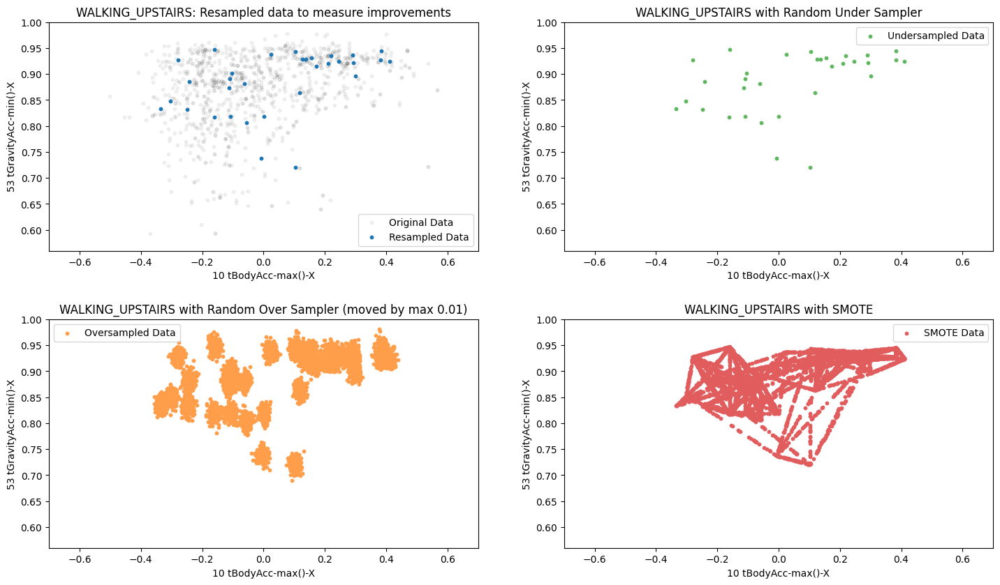

In [92]:
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.under_sampling import CondensedNearestNeighbour
from imblearn.over_sampling import SMOTE

from collections import Counter

x_lim1 = -0.7
x_lim2 = 0.7
y_lim1 = 0.56

target = 'WALKING_UPSTAIRS'
feat_x = '10 tBodyAcc-max()-X'
feat_y = '53 tGravityAcc-min()-X'

rus = RandomUnderSampler(random_state=42)
ros = RandomOverSampler(random_state=42)
sm = SMOTE(random_state=42)

fig = plt.figure(figsize=(46, 43)) 
fig_dims = (8, 5)

plt.subplot2grid(fig_dims, (0, 0), title='{}: Resampled data to measure improvements'.format(target))
original_data = df[df['label'] == target].loc[:len(ind_train)]
plt.scatter(original_data[feat_x], original_data[feat_y], color='k', s=10, alpha=0.05, label='Original Data')
plt.scatter(X_train[:,0][y_train == 1], X_train[:,2][y_train == 1], s=10, label='Resampled Data')

plt.ylabel(feat_y)
plt.xlabel(feat_x)
plt.xlim(x_lim1, x_lim2)
plt.ylim(y_lim1, 1)
plt.legend()

imb_names = ['ROS', 'RUS', 'SMOTE']
imb_tech = [ros, rus, sm]

fitted_imbalance = {}
for name_imb, imb in zip(imb_names, imb_tech):

    X_imb, y_imb = imb.fit_resample(X_train, y_train)
    fitted_imbalance[name_imb] = (X_imb, y_imb)
    
    if name_imb == 'RUS':
        plt.subplot2grid(fig_dims, (0, 1), title='{} with Random Under Sampler'.format(target))
        movement_x, movement_y = 0, 0
        color = '#60b760'
        label = 'Undersampled Data'
    elif name_imb == 'ROS':
        plt.subplot2grid(fig_dims, (1, 0), title='{} with Random Over Sampler (moved by max 0.01)'.format(target))
        movement_x, movement_y = np.random.normal(0, 0.01, size=len(X_imb[:,0][y_imb == 1])), np.random.normal(0, 0.01, size=len(X_imb[:,0][y_imb == 1]))
        color='#ff9e4a'
        label='Oversampled Data'
    elif name_imb == 'SMOTE':
        plt.subplot2grid(fig_dims, (1, 1), title='{} with SMOTE'.format(target))
        movement_x, movement_y = 0, 0
        color='#e05c5d'
        label='SMOTE Data'
    
    plt.scatter(X_imb[:,0][y_imb == 1]+movement_x, X_imb[:,2][y_imb == 1]+movement_y, color=color, s=10, label=label)
    print('{}: Resampled dataset shape {}'.format(name_imb, Counter(y_imb)))

    plt.ylabel(feat_y)
    plt.xlabel(feat_x)
    plt.xlim(x_lim1, x_lim2)
    plt.ylim(y_lim1, 1)
    plt.legend()

plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.3)

Performances using the Decision Tree

REDUCED
Predicting WALKING_UPSTAIRS with the Decision Tree (ORIGINAL):
Best Estimator: DecisionTreeClassifier(class_weight={0: 1, 1: 5}, criterion='entropy',
                       max_depth=2, random_state=42)
Area Under the Curve (ROC):  0.8025349083687475
Confusion Matrix:
 [[ 201  270]
 [  22 2454]]
              precision    recall  f1-score   support

           0       0.90      0.99      0.94      2476
           1       0.90      0.43      0.58       471

    accuracy                           0.90      2947
   macro avg       0.90      0.71      0.76      2947
weighted avg       0.90      0.90      0.89      2947
Minority class represents 0.51% of the data
Majority class represents 99.49% of the data

ROS
Predicting WALKING_UPSTAIRS with the Decision Tree (ORIGINAL):
Best Estimator: DecisionTreeClassifier(class_weight={0: 1, 1: 1}, criterion='entropy',
                       min_samples_leaf=3, random_state=42)
Area Under the Curve (ROC):  0.7232557820469285
Confusion Matrix:

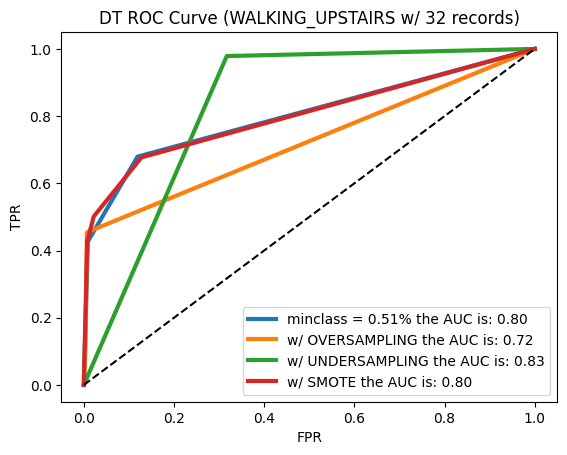

In [93]:
#JUST TRAIN ON THE REDUCED DATASET, THE OVERSMAPLING, THE UNDERSAMPLNG AND SMOTE
clf = DecisionTreeClassifier()
param_grid = [{'min_samples_leaf' : [1,3,10], 'class_weight' : [{0:1, 1: 1}, {0:1, 1: 5}], 'criterion' : ['gini', 'entropy'],
              'max_depth': [None, 2, 5], 'random_state' : [42],  'min_samples_split' : [2, 5, 10]}]
sampled_frames = [(X_train, y_train)]+[(fitted_imbalance[name_imb]) for name_imb in imb_names]

for n, what in enumerate(['REDUCED']+imb_names):

    print(what)

    X_imb, y_imb = sampled_frames[n]
    gridsearch = GridSearchCV(clf, param_grid, cv=5, scoring='roc_auc')
    gridsearch.fit(X_imb, y_imb)
    clf = gridsearch.best_estimator_
    clf.fit(X_imb, y_imb)
    prune_duplicate_leaves(clf)

    y_pred = clf.predict(X_test)
    y_score = clf.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
    roc_auc = auc(fpr, tpr)

    print('Predicting {} with the Decision Tree (ORIGINAL):'.format(target))
    print('Best Estimator:', gridsearch.best_estimator_)
    print('Area Under the Curve (ROC): ', roc_auc)
    print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred, labels=[1,0]))
    print(classification_report(y_test, y_pred), end='')

    minclass = np.min(np.unique(y_imb, return_counts=True)[1])/len(X_imb)
    maxclass = np.max(np.unique(y_imb, return_counts=True)[1])/len(X_imb)
    print('Minority class represents {:.2%} of the data'.format(minclass), sep='')
    print('Majority class represents {:.2%} of the data'.format(maxclass), sep='')
    print()

    labels_dict = {'REDUCED':'minclass = {rate:.2%} the AUC is: {auc:.2f}'.format(rate=minclass, auc=roc_auc),
                   'ROS': 'w/ OVERSAMPLING the AUC is: {auc:.2f}'.format(auc=roc_auc),
                   'RUS': 'w/ UNDERSAMPLING the AUC is: {auc:.2f}'.format(auc=roc_auc),
                   'SMOTE': 'w/ SMOTE the AUC is: {auc:.2f}'.format(auc=roc_auc)}
    
    plt.plot(fpr, tpr, label=labels_dict[what], linewidth=3.0)

plt.plot([0,1], [0,1], 'k--')
plt.title("DT ROC Curve ({} w/ {} records)".format(target, reduced_record_n))
plt.ylabel('TPR')
plt.xlabel('FPR')
plt.legend()
plt.show()

Predicting WALKING_UPSTAIRS with the Desision Tree (WITH UNDERSAMPLING):
Area Under the Curve (ROC):  0.8308624793773945
Confusion Matrix:
 [[ 461   10]
 [ 785 1691]]
              precision    recall  f1-score   support

           0       0.99      0.68      0.81      2476
           1       0.37      0.98      0.54       471

    accuracy                           0.73      2947
   macro avg       0.68      0.83      0.67      2947
weighted avg       0.89      0.73      0.77      2947
Minority class represents 50.0% of the data
Majority class represents 50.0% of the data


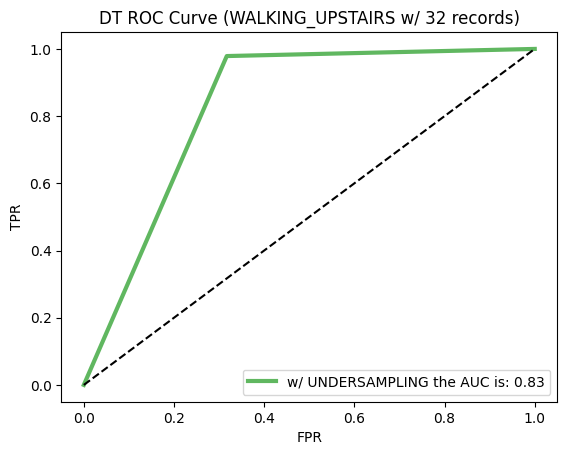

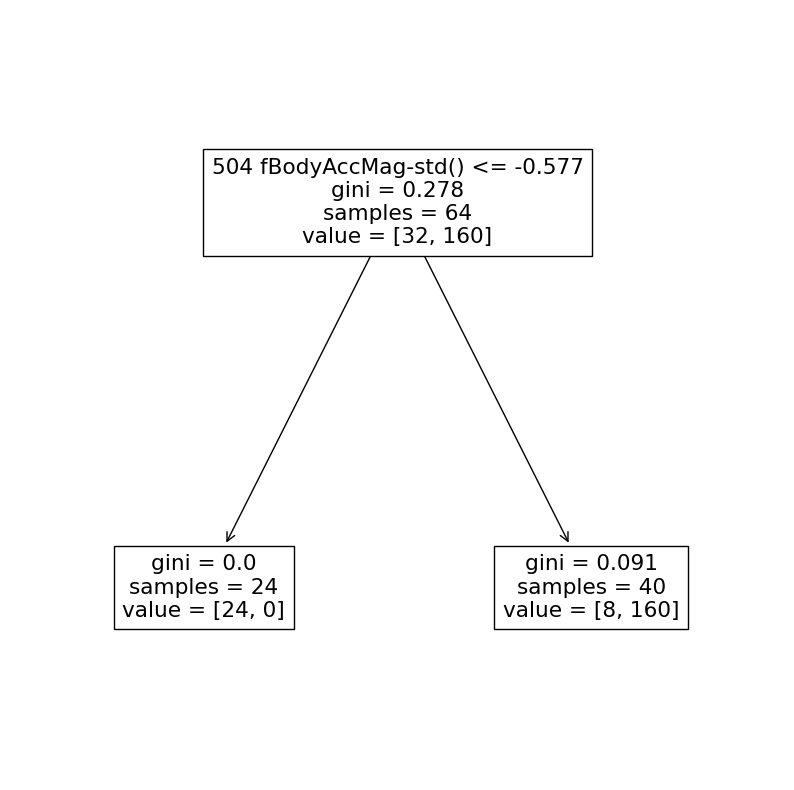

In [94]:
X_rus, y_rus = sampled_frames[2]
clf = DecisionTreeClassifier()
param_grid = [{'min_samples_leaf' : [1,3,10], 'class_weight' : [{0:1, 1: 1}, {0:1, 1: 5}], 'criterion' : ['gini', 'entropy'],
               'max_depth': [None, 2, 5], 'random_state' : [42],  'min_samples_split' : [2, 5, 10]}]
gridsearch = GridSearchCV(clf, param_grid, cv=5, scoring='roc_auc')
gridsearch.fit(X_rus, y_rus)
clf = gridsearch.best_estimator_

clf.fit(X_rus, y_rus)
prune_duplicate_leaves(clf)

y_pred = clf.predict(X_test)
y_score = clf.predict_proba(X_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc = auc(fpr, tpr)

print('Predicting {} with the Desision Tree (WITH UNDERSAMPLING):'.format(target))
print('Area Under the Curve (ROC): ', roc_auc)
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred, labels=[1,0]))
print(classification_report(y_test, y_pred), end='')

minclass = round(np.min(np.unique(y_rus, return_counts=True)[1])/len(X_rus)*100, 2)
maxclass = round(np.max(np.unique(y_rus, return_counts=True)[1])/len(X_rus)*100, 2)
print('Minority class represents ', minclass, '% of the data', sep='')
print('Majority class represents ', maxclass, '% of the data', sep='')

plt.plot(fpr, tpr, label='w/ UNDERSAMPLING the AUC is: ' + str(round(roc_auc, 2)), color='#60b760', linewidth=3.0)
plt.plot([0,1], [0,1], 'k--')
plt.title("DT ROC Curve ({} w/ {} records)".format(target, reduced_record_n))
plt.ylabel('TPR')
plt.xlabel('FPR')
plt.legend()
plt.show()

plt.figure(figsize=(10,10))
tree.plot_tree(clf, feature_names=features_to_keep)
plt.show()

In [95]:
for idx, el in enumerate(features_to_keep):
    print('X[{idx}] = {el}'.format(idx=idx, el=el))

X[0] = 10 tBodyAcc-max()-X
X[1] = 42 tGravityAcc-mean()-Y
X[2] = 53 tGravityAcc-min()-X
X[3] = 74 tGravityAcc-arCoeff()-Z,1
X[4] = 167 tBodyGyroJerk-mad()-X
X[5] = 297 fBodyAcc-skewness()-X
X[6] = 331 fBodyAcc-bandsEnergy()-1,8
X[7] = 411 fBodyAccJerk-bandsEnergy()-9,16
X[8] = 427 fBodyGyro-std()-X
X[9] = 504 fBodyAccMag-std()
X[10] = 560 angle(Y,gravityMean)


Performances using KNN

REDUCED
Predicting WALKING_UPSTAIRS with the Decision Tree (ORIGINAL):
Best Estimator: KNeighborsClassifier(n_neighbors=14)
Area Under the Curve (ROC):  0.8180425931833072
Confusion Matrix:
 [[  36  435]
 [   0 2476]]
              precision    recall  f1-score   support

           0       0.85      1.00      0.92      2476
           1       1.00      0.08      0.14       471

    accuracy                           0.85      2947
   macro avg       0.93      0.54      0.53      2947
weighted avg       0.87      0.85      0.80      2947
Minority class represents 0.51% of the data
Majority class represents 99.49% of the data

ROS
Predicting WALKING_UPSTAIRS with the Decision Tree (ORIGINAL):
Best Estimator: KNeighborsClassifier(n_neighbors=1)
Area Under the Curve (ROC):  0.6748072365194187
Confusion Matrix:
 [[ 166  305]
 [   7 2469]]
              precision    recall  f1-score   support

           0       0.89      1.00      0.94      2476
           1       0.96      0.35      0.52 

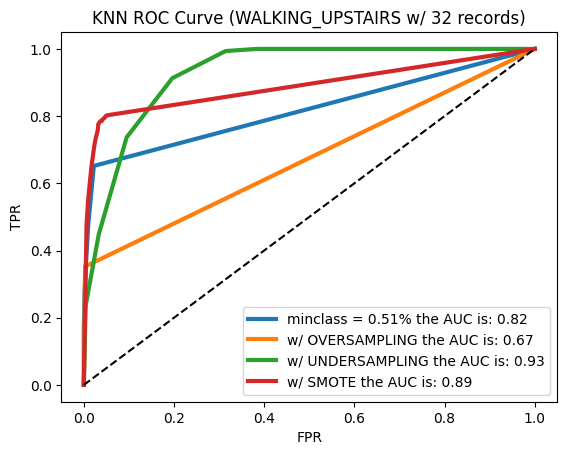

In [96]:
clf = KNeighborsClassifier()
param_grid = [{'n_neighbors' : np.arange(1,20).tolist()}]

for n, what in enumerate(['REDUCED']+imb_names):

    print(what)

    X_imb, y_imb = sampled_frames[n]
    gridsearch = GridSearchCV(clf, param_grid, cv=5, scoring='roc_auc')
    gridsearch.fit(X_imb, y_imb)
    clf = gridsearch.best_estimator_
    clf.fit(X_imb, y_imb)

    y_pred = clf.predict(X_test)
    y_score = clf.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
    roc_auc = auc(fpr, tpr)

    print('Predicting {} with the Decision Tree (ORIGINAL):'.format(target))
    print('Best Estimator:', gridsearch.best_estimator_)
    print('Area Under the Curve (ROC): ', roc_auc)
    print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred, labels=[1,0]))
    print(classification_report(y_test, y_pred), end='')

    minclass = np.min(np.unique(y_imb, return_counts=True)[1])/len(X_imb)
    maxclass = np.max(np.unique(y_imb, return_counts=True)[1])/len(X_imb)
    print('Minority class represents {:.2%} of the data'.format(minclass), sep='')
    print('Majority class represents {:.2%} of the data'.format(maxclass), sep='')
    print()

    labels_dict = {'REDUCED':'minclass = {rate:.2%} the AUC is: {auc:.2f}'.format(rate=minclass, auc=roc_auc),
                   'ROS': 'w/ OVERSAMPLING the AUC is: {auc:.2f}'.format(auc=roc_auc),
                   'RUS': 'w/ UNDERSAMPLING the AUC is: {auc:.2f}'.format(auc=roc_auc),
                   'SMOTE': 'w/ SMOTE the AUC is: {auc:.2f}'.format(auc=roc_auc)}
    
    plt.plot(fpr, tpr, label=labels_dict[what], linewidth=3.0)

plt.plot([0,1], [0,1], 'k--')
plt.title("KNN ROC Curve ({} w/ {} records)".format(target, reduced_record_n))
plt.ylabel('TPR')
plt.xlabel('FPR')
plt.legend()
plt.show()

Predicting WALKING_UPSTAIRS with KNN (WITH UNDERSAMPLING):
Area Under the Curve (ROC):  0.9286234903909806
Confusion Matrix:
 [[ 468    3]
 [ 778 1698]]
              precision    recall  f1-score   support

           0       1.00      0.69      0.81      2476
           1       0.38      0.99      0.55       471

    accuracy                           0.73      2947
   macro avg       0.69      0.84      0.68      2947
weighted avg       0.90      0.73      0.77      2947
Minority class represents 50.0% of the data
Majority class represents 50.0% of the data


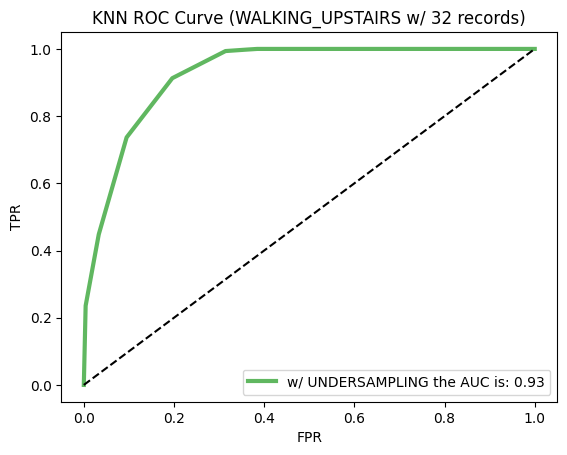

In [97]:
X_rus, y_rus = sampled_frames[2]
clf = KNeighborsClassifier()
param_grid = [{'n_neighbors' : np.arange(1,20).tolist()}]
gridsearch = GridSearchCV(clf, param_grid, cv=5, scoring='roc_auc')
gridsearch.fit(X_rus, y_rus)
clf = gridsearch.best_estimator_
clf.fit(X_rus, y_rus)

y_pred = clf.predict(X_test)
y_score = clf.predict_proba(X_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc = auc(fpr, tpr)

print('Predicting {} with KNN (WITH UNDERSAMPLING):'.format(target))
print('Area Under the Curve (ROC): ', roc_auc)
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred, labels=[1,0]))
print(classification_report(y_test, y_pred), end='')

minclass = round(np.min(np.unique(y_rus, return_counts=True)[1])/len(X_rus)*100, 2)
maxclass = round(np.max(np.unique(y_rus, return_counts=True)[1])/len(X_rus)*100, 2)
print('Minority class represents ', minclass, '% of the data', sep='')
print('Majority class represents ', maxclass, '% of the data', sep='')

plt.plot(fpr, tpr, label='w/ UNDERSAMPLING the AUC is: ' + str(round(roc_auc, 2)), color='#60b760', linewidth=3.0)
plt.plot([0,1], [0,1], 'k--')
plt.title("KNN ROC Curve ({} w/ {} records)".format(target, reduced_record_n))
plt.ylabel('TPR')
plt.xlabel('FPR')
plt.legend()
plt.show()

# Anomaly Detection

The apporach with the following techniques will be local, I will use the labels of the records to look for the outliers pertaining to each class

In [98]:
rdf = df
rdf_train, rdf_test = df[:len(ind_train)], df[len(ind_train):]
rdf_train_val, rdf_test_val = rdf_train[features_to_keep].values, rdf_test[features_to_keep].values

<font size = "5">Dataset reduced with Feature selection</font>

<font size = "4">Boxplot Method</font>

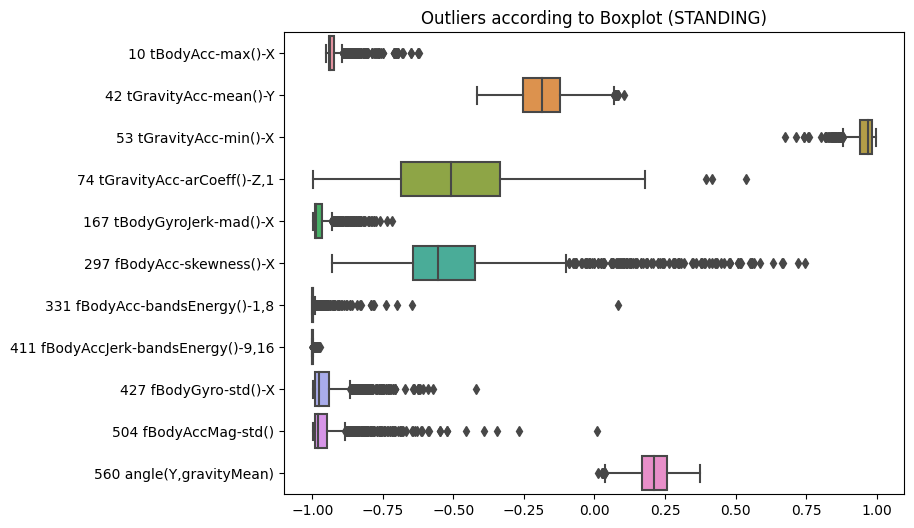

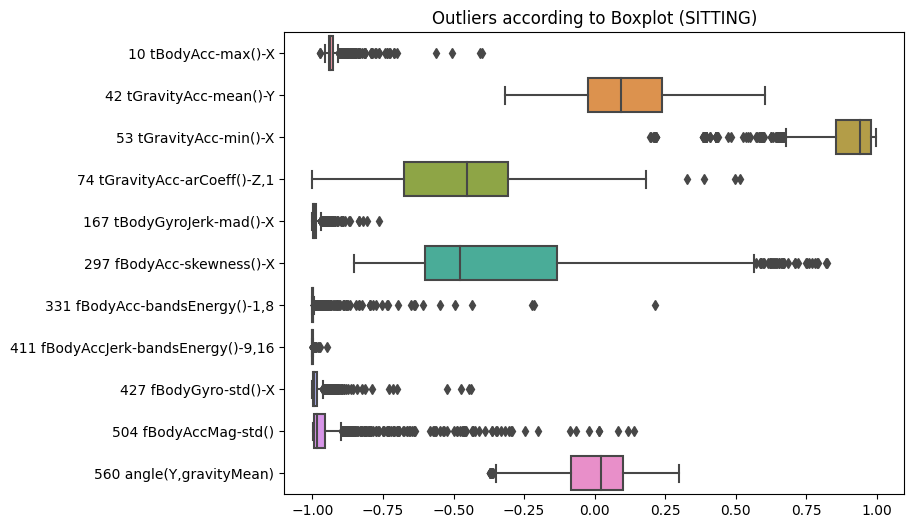

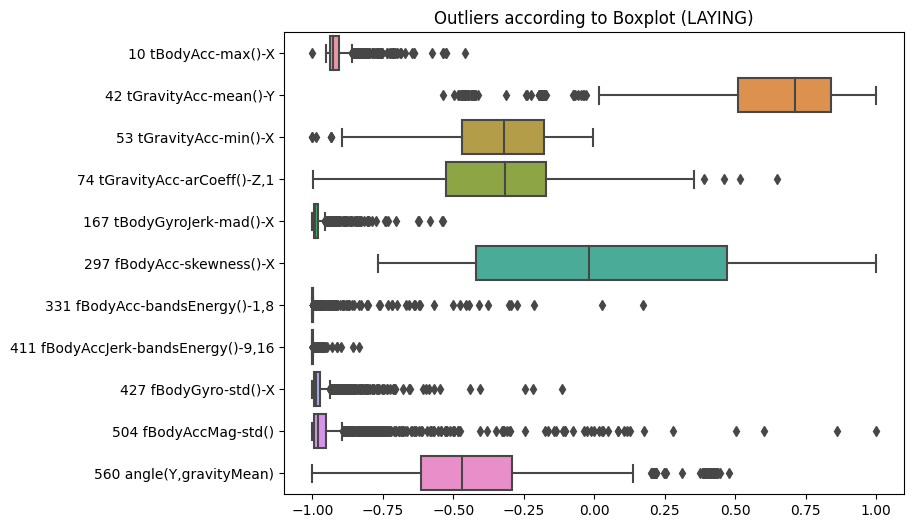

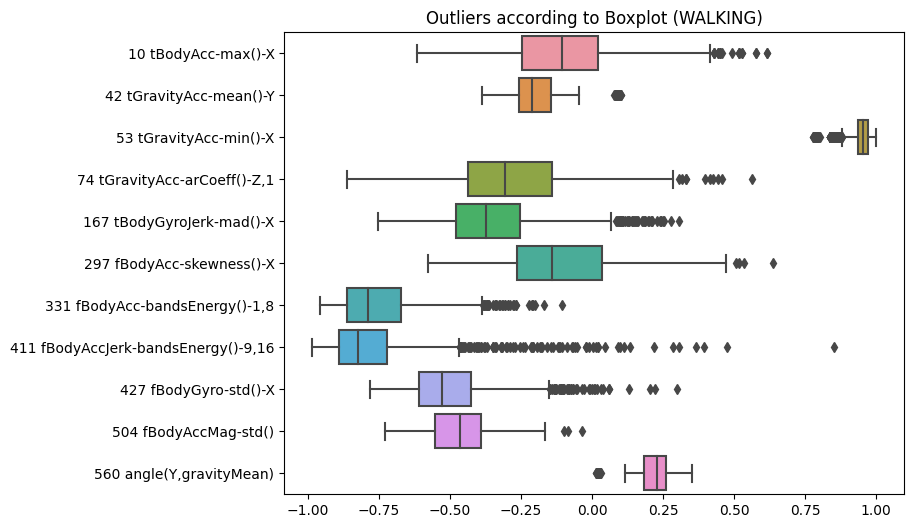

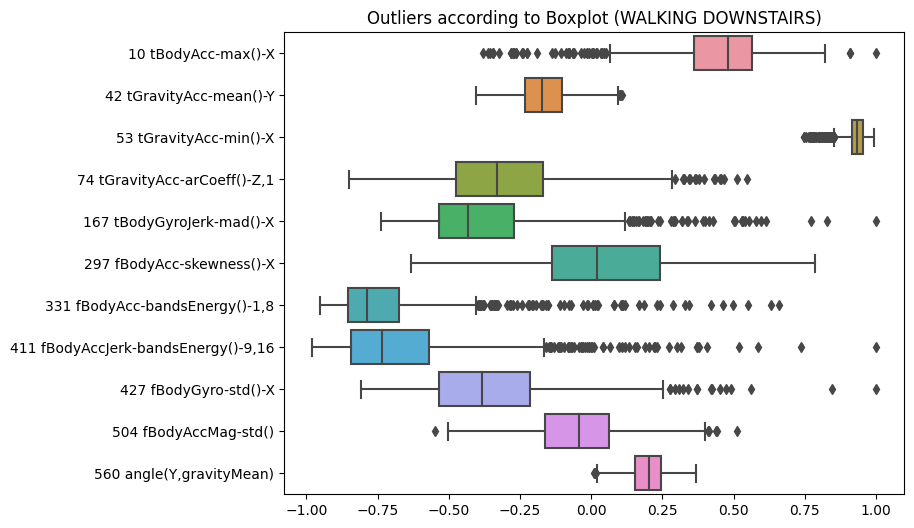

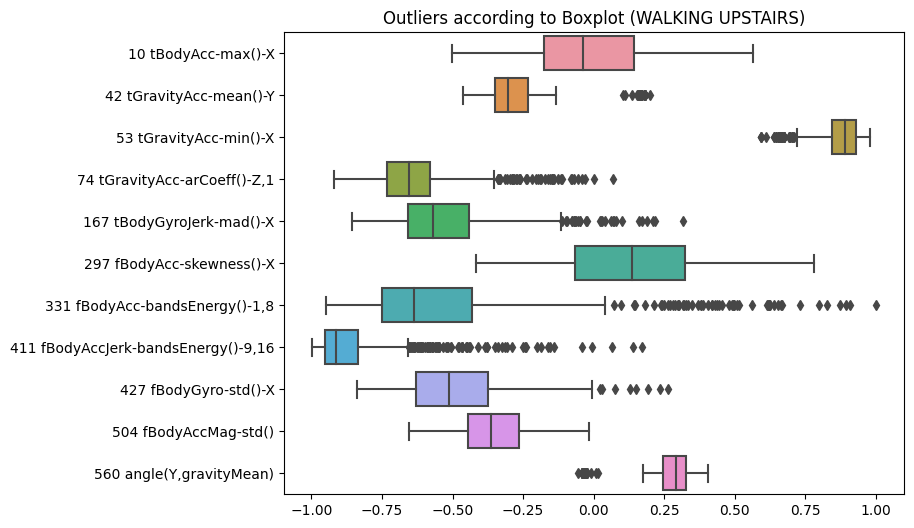

In [99]:
for lab in rdf_train['label'].unique():
    plt.figure(figsize=(8, 6))

    sns.boxplot(data=[rdf_train_val[:,x][rdf_train['label'] == lab] for x in range(len(features_to_keep))], orient="h")
    plt.yticks([x for x in range(len(features_to_keep))], features_to_keep)
    plt.title('Outliers according to Boxplot ({})'.format(lab.replace('_', ' ')))
    plt.show()

In [100]:
boxplot_idx = []
for lab in rdf_train['label'].unique():
    print('--------------------', lab.replace('_',' '), '--------------------')
    for col in features_to_keep:
        Q1 = rdf_train[col].quantile(0.25)
        Q3 = rdf_train[col].quantile(0.75)
        IQR = Q3 - Q1

        filtering = (rdf_train[col] >= Q1 - 1.5 * IQR) & (rdf_train[col] <= Q3 + 1.5 *IQR)

        print(col, 'number of outliers:', len(rdf_train.loc[~filtering].index))

        for x in rdf_train.loc[~filtering].index: # the tilde ~ inverts a boolean series
            boxplot_idx.append(x)
        
    print()
boxplot_idx = set(boxplot_idx)
print('Total Outliers according to boxplot=', len(boxplot_idx))

-------------------- STANDING --------------------
10 tBodyAcc-max()-X number of outliers: 0
42 tGravityAcc-mean()-Y number of outliers: 686
53 tGravityAcc-min()-X number of outliers: 1465
74 tGravityAcc-arCoeff()-Z,1 number of outliers: 38
167 tBodyGyroJerk-mad()-X number of outliers: 24
297 fBodyAcc-skewness()-X number of outliers: 0
331 fBodyAcc-bandsEnergy()-1,8 number of outliers: 380
411 fBodyAccJerk-bandsEnergy()-9,16 number of outliers: 541
427 fBodyGyro-std()-X number of outliers: 25
504 fBodyAccMag-std() number of outliers: 3
560 angle(Y,gravityMean) number of outliers: 776

-------------------- SITTING --------------------
10 tBodyAcc-max()-X number of outliers: 0
42 tGravityAcc-mean()-Y number of outliers: 686
53 tGravityAcc-min()-X number of outliers: 1465
74 tGravityAcc-arCoeff()-Z,1 number of outliers: 38
167 tBodyGyroJerk-mad()-X number of outliers: 24
297 fBodyAcc-skewness()-X number of outliers: 0
331 fBodyAcc-bandsEnergy()-1,8 number of outliers: 380
411 fBodyAccJerk

In [101]:
reverted_map_dict

{'LAYING': 6,
 'SITTING': 4,
 'STANDING': 5,
 'WALKING': 1,
 'WALKING_DOWNSTAIRS': 3,
 'WALKING_UPSTAIRS': 2}

In [102]:
mapping_color

{'LAYING': 'm',
 'SITTING': 'y',
 'STANDING': 'c',
 'WALKING': 'b',
 'WALKING_DOWNSTAIRS': 'g',
 'WALKING_UPSTAIRS': 'r'}

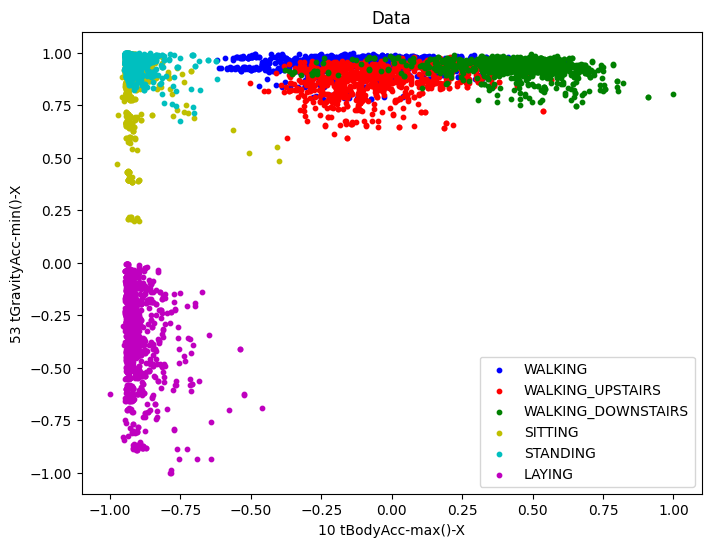

In [103]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][rdf_train['label'] == k], rdf_train_val[:,2][rdf_train['label'] == k], c=v, label = k, s=10)
plt.xlabel(rdf.columns[2:][0])
plt.ylabel(rdf.columns[2:][2])
plt.title('Data')
plt.legend()

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
51,LAYING,1,-0.785104,0.774659,-0.289102,-0.832276,-0.977912,0.378035,-0.990528,-0.999214,-0.956264,-0.836196,-0.553351
52,LAYING,1,-0.920051,0.773905,-0.194196,-0.808631,-0.996606,0.228383,-0.999538,-0.999705,-0.981145,-0.978484,-0.550364
53,LAYING,1,-0.940164,0.771712,-0.165103,-0.579669,-0.997441,-0.222316,-0.999979,-0.999692,-0.990490,-0.996777,-0.546725
54,LAYING,1,-0.940773,0.771097,-0.165103,-0.140760,-0.998576,-0.260760,-0.999959,-0.999911,-0.996087,-0.998449,-0.546477
55,LAYING,1,-0.942673,0.771037,-0.163477,-0.271013,-0.998958,-0.531937,-0.999870,-0.999933,-0.999390,-0.998283,-0.546712
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7347,WALKING_UPSTAIRS,30,0.210795,-0.222004,0.920554,-0.787143,-0.533656,-0.154387,-0.274644,-0.918070,-0.420143,-0.232600,0.238604
7348,WALKING_UPSTAIRS,30,0.117440,-0.242054,0.920554,-0.710545,-0.609540,-0.053694,-0.310596,-0.878160,-0.496589,-0.275373,0.252676
7349,WALKING_UPSTAIRS,30,0.043999,-0.236950,0.933008,-0.821631,-0.662918,0.363110,0.034897,-0.909565,-0.373464,-0.220288,0.249145
7350,WALKING_UPSTAIRS,30,0.101702,-0.233230,0.933008,-0.838582,-0.645452,0.382837,0.040506,-0.936716,-0.527553,-0.234539,0.246432


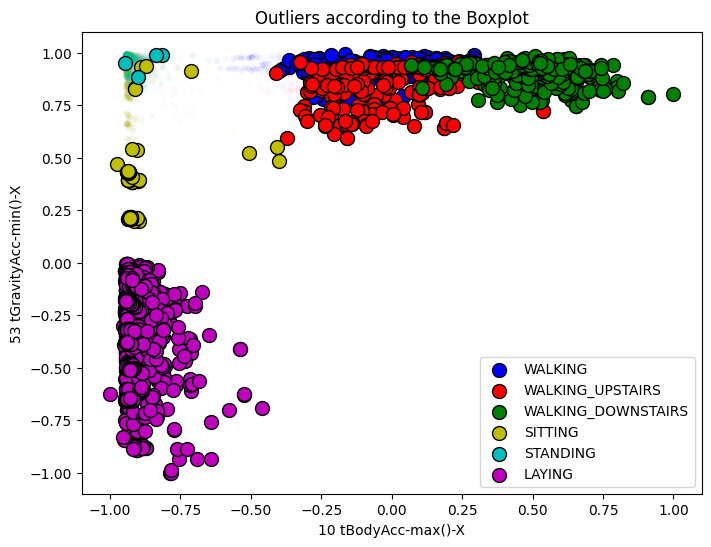

In [104]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][rdf_train['label'] == k], rdf_train_val[:,2][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(rdf_train.loc[boxplot_idx].values[:,2][rdf_train['label'].loc[boxplot_idx] == k], rdf_train.loc[boxplot_idx].values[:,4][rdf_train['label'].loc[boxplot_idx] == k], edgecolor='k', marker='o', c=v, label = k, s=100)
plt.xlabel(rdf.columns[2:][0])
plt.ylabel(rdf.columns[2:][2])
plt.title('Outliers according to the Boxplot')
plt.legend()

df_bpout = rdf_train.loc[boxplot_idx].sort_index()
df_bpout

In [105]:
np.unique(df_bpout['label'].values, return_counts=True)

(array(['LAYING', 'SITTING', 'STANDING', 'WALKING', 'WALKING_DOWNSTAIRS',
        'WALKING_UPSTAIRS'], dtype=object),
 array([1407,   63,    4,  200,  334,  273]))

<font size = "4">Density Based: DBSCAN</font>

In [106]:
!pip install kneed

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


STANDING:
The point of maximum curvature has a distance of 0.2807525811512598
(array([-1,  0]), array([  19, 1355]))

SITTING:
The point of maximum curvature has a distance of 0.4026844727891745
(array([-1,  0]), array([  10, 1276]))

LAYING:
The point of maximum curvature has a distance of 0.4418193701745591
(array([-1,  0,  1]), array([  48, 1284,   75]))

WALKING:
The point of maximum curvature has a distance of 0.413653665745993
(array([-1,  0]), array([   5, 1221]))

WALKING_DOWNSTAIRS:
The point of maximum curvature has a distance of 0.5891899629350719
(array([-1,  0]), array([ 11, 975]))

WALKING_UPSTAIRS:
The point of maximum curvature has a distance of 0.4546713959653397
(array([-1,  0]), array([   3, 1070]))

How many noise points: 96 
Which: [536, 688, 689, 690, 691, 703, 847, 861, 871, 872, 1757, 1773, 1788, 2891, 3074, 3444, 3823, 5271, 7189, 564, 716, 1343, 1355, 1513, 2412, 2570, 2907, 4567, 4730, 66, 67, 70, 71, 72, 73, 237, 238, 1062, 1209, 1210, 1369, 1523, 1813, 1826

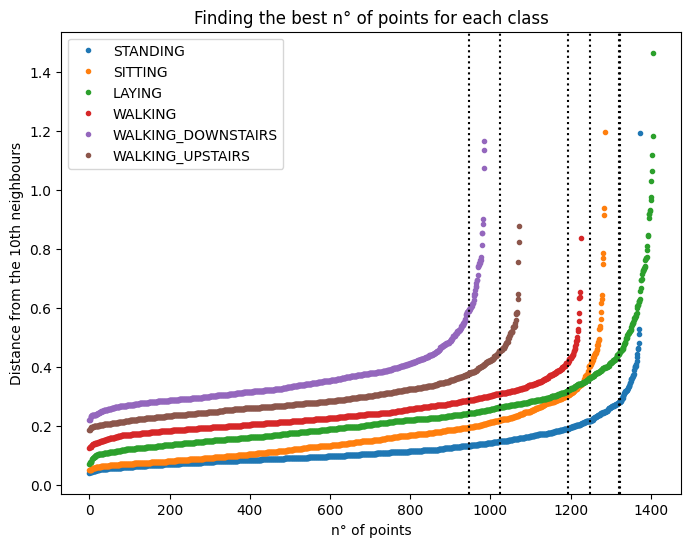

In [107]:
from sklearn.cluster import DBSCAN
from scipy.spatial.distance import pdist, squareform
from kneed import KneeLocator

db_outliers = []

plt.figure(figsize=(8, 6))

for targ in rdf_train['label'].unique():
    redefined_for_temp_target = rdf_train[rdf_train['label'] == targ][features_to_keep]
    rdf_train_val = redefined_for_temp_target.values
    
    ####################################
    
    metrica = 'euclidean'
    distanza = squareform(pdist(rdf_train_val, metrica))

    punti = 10
    kth_distances = []
    for dist in distanza:
        index_kth_dist = np.argsort(dist)[punti]
        kth_distances.append(dist[index_kth_dist])
    
    plt.plot(range(0, len(kth_distances)), sorted(kth_distances), marker='.', linewidth=0, label=targ)
    plt.title('Finding the best n° of points for each class')
    plt.ylabel('Distance from the {}th neighbours'.format(punti))
    plt.xlabel('n° of points')
    plt.grid()
    
    
    kneedle = KneeLocator(np.arange(0, len(kth_distances)), np.array(sorted(kth_distances)[:]), S=1.0, curve="convex", direction="increasing")
    plt.axvline(kneedle.knee, c='k', ls=':')
    
    #####################################
    
    epsilon = sorted(kth_distances)[kneedle.knee]

    X_dbscan = rdf_train_val.copy()
    dbscan = DBSCAN(eps=epsilon, min_samples=punti)
    dbscan.fit(X_dbscan)
    
    print('{}:\nThe point of maximum curvature has a distance of {}'.format(targ, epsilon))
    print(np.unique(dbscan.labels_, return_counts=True))
    
    for x in redefined_for_temp_target[dbscan.labels_ == -1].index:
        db_outliers.append(x)
    print()

plt.legend()

print('How many noise points:', len(db_outliers), '\nWhich:', db_outliers)

rdf_train_val = rdf_train[features_to_keep].values

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
3130,LAYING,16,-0.894313,-0.496213,-0.272745,-0.952757,-0.974727,0.802399,-0.998355,-0.999019,-0.976369,-0.929185,0.445582
70,LAYING,1,-0.717081,0.716437,-0.555148,-0.712867,-0.537871,0.429942,-0.410236,-0.855335,-0.113750,0.280697,-0.496132
71,LAYING,1,-0.866296,0.525105,-0.709935,-0.713060,-0.625818,0.219973,-0.622200,-0.833951,-0.218998,-0.102780,-0.336641
72,LAYING,1,-0.866296,0.160141,-0.710240,-0.676679,-0.942987,-0.443785,-0.913021,-0.991614,-0.724341,-0.026812,-0.034020
73,LAYING,1,-0.920486,-0.058996,-0.710240,-0.933790,-0.978923,-0.105617,-0.998911,-0.999851,-0.944576,-0.771569,0.125019
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5016,WALKING_DOWNSTAIRS,23,0.550072,-0.095528,0.921475,-0.252127,-0.204365,-0.514101,-0.206184,1.000000,-0.327869,0.218170,0.150938
5030,WALKING_DOWNSTAIRS,23,0.742717,-0.119211,0.926162,-0.202767,-0.174424,-0.237721,-0.077996,0.299890,0.038282,0.177073,0.166843
2376,WALKING_UPSTAIRS,14,0.537230,-0.329308,0.721304,-0.610416,-0.598033,-0.083687,0.381111,-0.481499,-0.182087,-0.043296,0.315901
2375,WALKING_UPSTAIRS,14,0.537230,-0.335591,0.721304,-0.617188,-0.589833,-0.296519,0.666696,-0.155066,-0.489659,-0.037397,0.319937


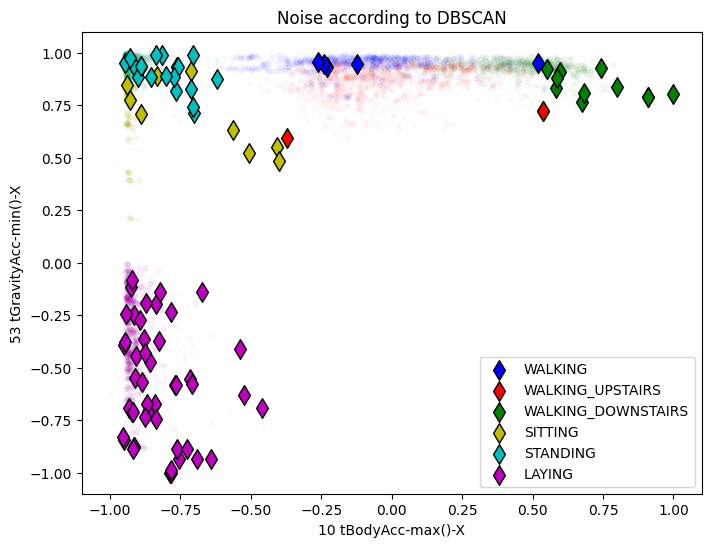

In [108]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][rdf_train['label'] == k], rdf_train_val[:,2][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(rdf_train.loc[db_outliers].values[:,2][rdf_train['label'].loc[db_outliers] == k], rdf_train.loc[db_outliers].values[:,4][rdf_train['label'].loc[db_outliers] == k], edgecolor='k', marker='d', c=v, label = k, s=100)
plt.xlabel(rdf.columns[2:][0])
plt.ylabel(rdf.columns[2:][2])
plt.title('Noise according to DBSCAN')
plt.legend()

df_dbout = rdf_train.loc[db_outliers].sort_values(by='label')
df_dbout

<font size = "4">Density Based: Local Outlier Factor</font>

STANDING
(array([-1,  1]), array([  58, 1316]))
Max value of score array: -0.8775729321072431 
Min value of score array: -3.013503058147273 
Mean value of score array: -1.1085176533742183
Outlier threshold: -1.5019712767375313
Indices of the outliers: [  84   86   87   98  101  109  131  132  133  135  142  165  166  167
  170  203  204  207  215  216  262  263  282  312  318  332  333  334
  345  419  434  466  472  521  527  539  554  560  567  649  721  772
  773  806  831  832  871  873  913  932  940  943 1211 1344 1348 1349
 1362 1363]
Bins (Sturge Approximation): 11


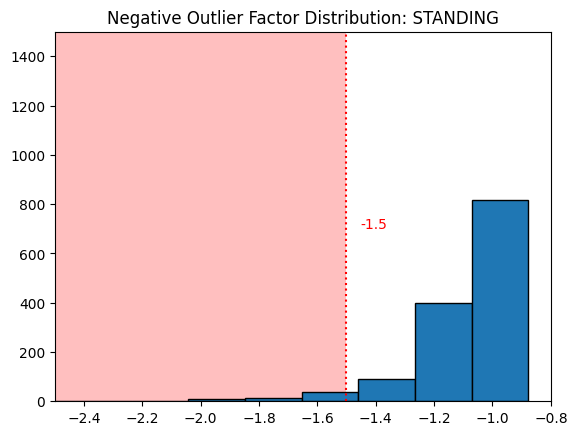

Number of identified outlier with the specified threshold: 58
(array([-1,  1]), array([  58, 1316]))
SITTING
(array([-1,  1]), array([  37, 1249]))
Max value of score array: -0.8812237967415217 
Min value of score array: -2.9627231591167345 
Mean value of score array: -1.098162348559647
Outlier threshold: -1.5033748441804817
Indices of the outliers: [  85   99  163  164  174  175  198  203  227  228  290  308  323  333
  392  396  398  459  488  596  622  633  808  811  813  814  828 1023
 1102 1106 1108 1111 1140 1141 1146 1161 1242]
Bins (Sturge Approximation): 11


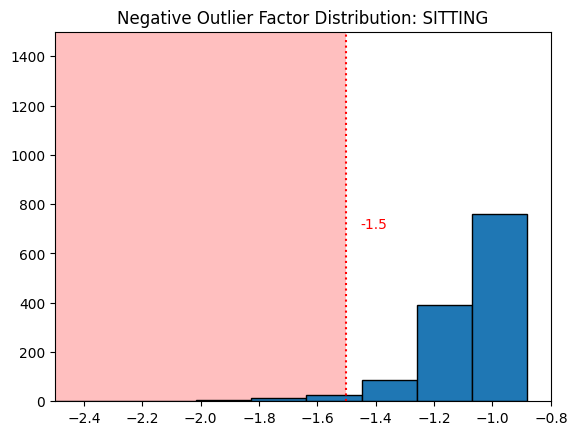

Number of identified outlier with the specified threshold: 37
(array([-1,  1]), array([  37, 1249]))
LAYING
(array([-1,  1]), array([  45, 1362]))
Max value of score array: -0.9051349266691929 
Min value of score array: -3.419750318695692 
Mean value of score array: -1.1074816557928282
Outlier threshold: -1.5020314703336886
Indices of the outliers: [  32  193  197  198  199  206  234  250  308  347  349  354  357  361
  370  408  409  420  435  542  547  577  611  717  798  821  861  862
  868  884  910  977  995 1008 1014 1015 1018 1054 1056 1082 1191 1315
 1351 1353 1376]
Bins (Sturge Approximation): 11


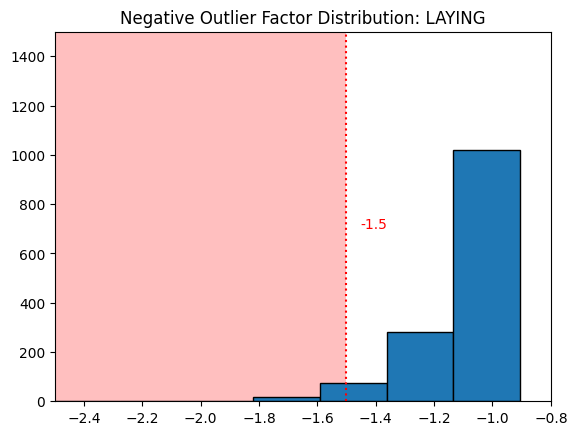

Number of identified outlier with the specified threshold: 45
(array([-1,  1]), array([  45, 1362]))
WALKING
(array([-1,  1]), array([  26, 1200]))
Max value of score array: -0.9177164980604571 
Min value of score array: -2.8942989913228225 
Mean value of score array: -1.0816360276125385
Outlier threshold: -1.506588534739414
Indices of the outliers: [  68  198  217  218  249  265  267  346  359  545  593  600  655  668
  669  681  694  746  789  794  834  883  884 1011 1023 1134]
Bins (Sturge Approximation): 11


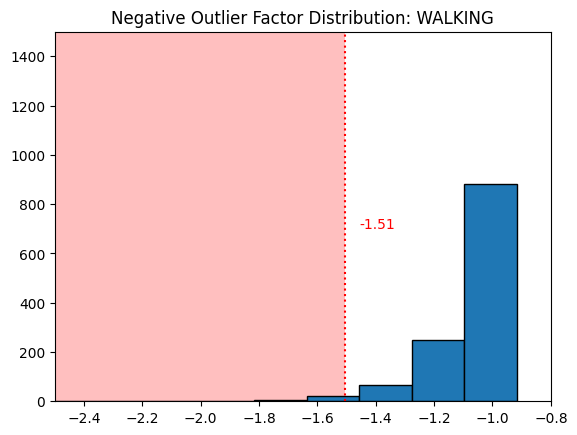

Number of identified outlier with the specified threshold: 26
(array([-1,  1]), array([  26, 1200]))
WALKING_DOWNSTAIRS
(array([-1,  1]), array([  1, 985]))
Max value of score array: -0.9204955975658399 
Min value of score array: -1.5053349521047235 
Mean value of score array: -1.0649557432816783
Outlier threshold: -1.5053349521047235
Indices of the outliers: [654]
Bins (Sturge Approximation): 11


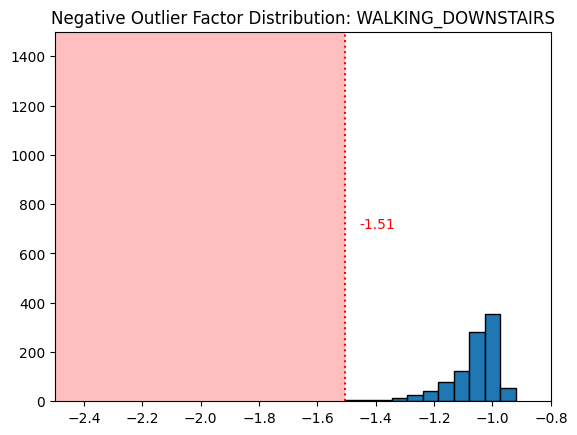

Number of identified outlier with the specified threshold: 1
(array([-1,  1]), array([  1, 985]))
WALKING_UPSTAIRS
(array([-1,  1]), array([   8, 1065]))
Max value of score array: -0.9267293498859551 
Min value of score array: -1.681908575857878 
Mean value of score array: -1.065825524663345
Outlier threshold: -1.5055404745848153
Indices of the outliers: [136 207 377 399 499 506 590 727]
Bins (Sturge Approximation): 11


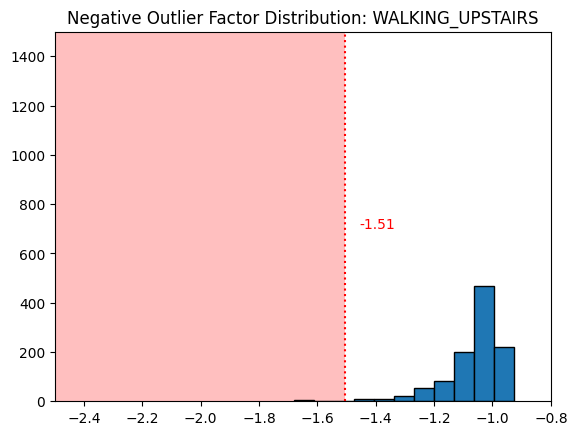

Number of identified outlier with the specified threshold: 8
(array([-1,  1]), array([   8, 1065]))
[84, 86, 87, 98, 101, 109, 131, 132, 133, 135, 142, 165, 166, 167, 170, 203, 204, 207, 215, 216, 262, 263, 282, 312, 318, 332, 333, 334, 345, 419, 434, 466, 472, 521, 527, 539, 554, 560, 567, 649, 721, 772, 773, 806, 831, 832, 871, 873, 913, 932, 940, 943, 1211, 1344, 1348, 1349, 1362, 1363, 85, 99, 163, 164, 174, 175, 198, 203, 227, 228, 290, 308, 323, 333, 392, 396, 398, 459, 488, 596, 622, 633, 808, 811, 813, 814, 828, 1023, 1102, 1106, 1108, 1111, 1140, 1141, 1146, 1161, 1242, 32, 193, 197, 198, 199, 206, 234, 250, 308, 347, 349, 354, 357, 361, 370, 408, 409, 420, 435, 542, 547, 577, 611, 717, 798, 821, 861, 862, 868, 884, 910, 977, 995, 1008, 1014, 1015, 1018, 1054, 1056, 1082, 1191, 1315, 1351, 1353, 1376, 68, 198, 217, 218, 249, 265, 267, 346, 359, 545, 593, 600, 655, 668, 669, 681, 694, 746, 789, 794, 834, 883, 884, 1011, 1023, 1134, 654, 136, 207, 377, 399, 499, 506, 590, 727]


In [109]:
from sklearn.neighbors import LocalOutlierFactor

lof_outliers = []
idx_for_score = []
lof_score_outliers = []

for targ in rdf_train['label'].unique():
    redefined_for_temp_target = rdf_train[rdf_train['label'] == targ][features_to_keep]
    rdf_train_val = redefined_for_temp_target.values

    X_lof = rdf_train_val.copy()
    clf_lof = LocalOutlierFactor(n_neighbors=5)
    outliers_lof = clf_lof.fit_predict(X_lof)
    
    outliers_val_array = clf_lof.negative_outlier_factor_
    outliers_val_array
    
    print(targ)
    print(np.unique(outliers_lof, return_counts=True))
    
    max_lof = np.max(outliers_val_array)
    min_lof = np.min(outliers_val_array)
    mean_lof = np.mean(outliers_val_array)
    print('Max value of score array:', max_lof, '\nMin value of score array:', min_lof, '\nMean value of score array:', mean_lof)
    
    outliers_lof_ind = np.where(outliers_lof==-1)[0] #indeces of the outliers
    outliers_lof_ind
    
    try:
        computed_score = np.max(outliers_val_array[outliers_lof_ind])
        print('Outlier threshold:', computed_score)
    except ValueError:
        #print('EMPTY ARRAY OF OUTLIERS, REDEFINE THRESHOLD') #redefining the threshold
        #computed_score = -1.45 #selected by trial and error
        #outliers_lof = np.array([-1 if x < computed_score else 1 for x in outliers_val_array])
        #outliers_lof_ind = np.where(outliers_lof==-1)[0] #indeces of the outliers
        #print('Outlier threshold:', computed_score)
        print('No outliers found for', targ)
    print('Indices of the outliers:', outliers_lof_ind)
    
    k_sturge = round(1+np.log2(len(outliers_val_array)))
    print('Bins (Sturge Approximation):', k_sturge)
    
    plt.hist(outliers_val_array, bins=k_sturge, edgecolor='k')
    plt.axvline(computed_score, c='r', ls=':')
    plt.text(computed_score+0.05, 700, s=round(computed_score, 2), c='r')
    plt.fill_between((-3, computed_score), 0, 3500, facecolor='red', alpha=0.25)
    plt.xlim(-2.5,-0.8)
    plt.ylim(0, 1500)
    plt.title("Negative Outlier Factor Distribution: {}".format(targ))
    plt.show()
    
    print('Number of identified outlier with the specified threshold:', 
          len(outliers_val_array[outliers_val_array <= computed_score])) #values lower than -1.50 tend to be outliers, scikit learn's LOF use this value
    print(np.unique(outliers_lof, return_counts=True))
    
    for x in outliers_lof_ind:
        lof_outliers.append(x)
    for x in redefined_for_temp_target.index:
        idx_for_score.append(x)
    for x in outliers_val_array:
        lof_score_outliers.append(x)
        
print(lof_outliers)

rdf_train_val = rdf_train[features_to_keep].values

In [110]:
lof_score_df = pd.DataFrame([(idx, score) for idx, score in zip(idx_for_score, lof_score_outliers)]).sort_values(by=0).reset_index(drop=True)
lof_score_df.columns = ['index', 'scores']
lof_score_df

,index,scores
0,0,-1.000135
1,1,-1.030951
2,2,-1.036115
3,3,-1.039551
4,4,-1.118144
...,...,...
7347,7347,-1.007592
7348,7348,-0.971006
7349,7349,-1.169589
7350,7350,-1.142704


Number of identified outlier with the -1.51 threshold: 164 on 7352 

Max value of score array: -0.8775729321072431 
Min value of score array: -3.419750318695692 
Mean value of score array: -1.0899523458075173


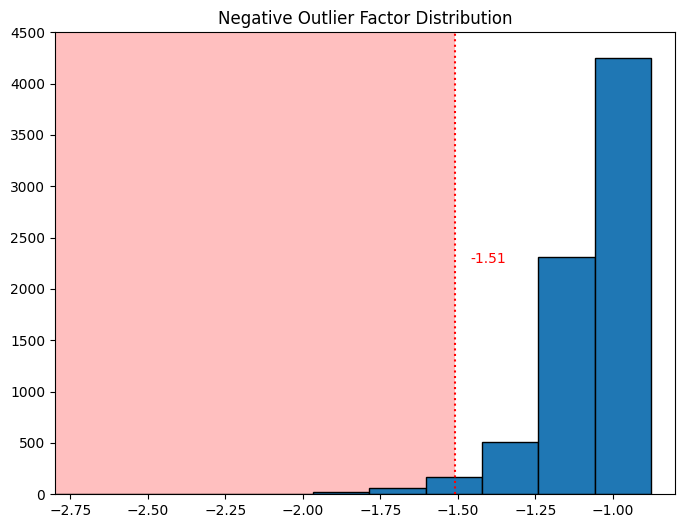

In [111]:
computed_score = -1.51
outliers_val_array = lof_score_df['scores'].values
print('Number of identified outlier with the {} threshold:'.format(computed_score), 
            len(outliers_val_array[outliers_val_array <= computed_score]), 'on', len(outliers_val_array), '\n') #values lower than -1.50 tend to be outliers, LOF use this value

############

max_lof = np.max(outliers_val_array)
min_lof = np.min(outliers_val_array)
mean_lof = np.mean(outliers_val_array)
print('Max value of score array:', max_lof, '\nMin value of score array:', min_lof, '\nMean value of score array:', mean_lof)

############

k_sturge = round(1+np.log2(len(outliers_val_array)))
plt.figure(figsize=(8, 6))

plt.hist(outliers_val_array, bins=k_sturge, edgecolor='k')
plt.axvline(computed_score, c='r', ls=':')
plt.text(computed_score+0.05, 2250, s=round(computed_score, 2), c='r')
plt.fill_between((-3, computed_score), 0, 5000, facecolor='red', alpha=0.25)
plt.xlim(-2.80,-0.8)
plt.ylim(0, 4500)
plt.title("Negative Outlier Factor Distribution")
plt.show()

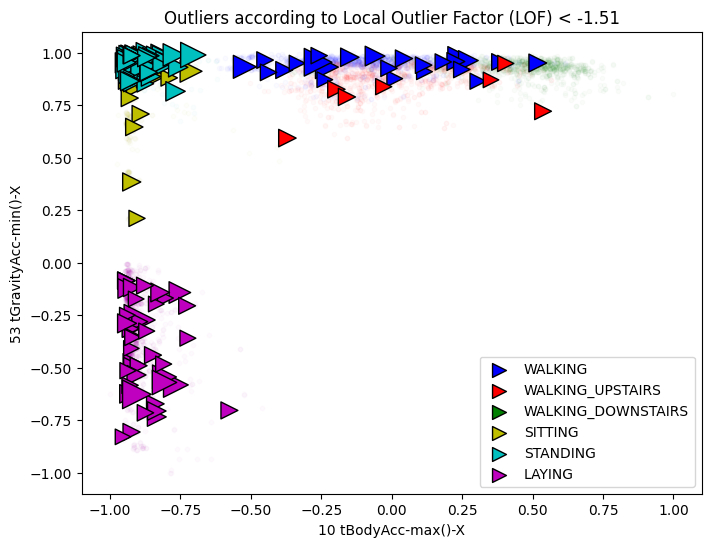

In [112]:
outliers_lof = np.array([-1 if x < computed_score else 1 for x in outliers_val_array])
outliers_lof_ind = np.where(outliers_lof==-1)[0] #indeces of the outliers

plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][rdf_train['label'] == k], rdf_train_val[:,2][rdf_train['label'] == k], c=v, alpha=0.02, s=10)

radius = ((max_lof - outliers_val_array) / (max_lof - min_lof))[outliers_lof_ind] #setting the radius of the outlier score by normalizing

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][outliers_lof_ind][rdf_train['label'].loc[outliers_lof_ind] == k], 
                rdf_train_val[:,2][outliers_lof_ind][rdf_train['label'].loc[outliers_lof_ind] == k], 
                edgecolor='k', marker='>', c=v, label = k, 
                s=500*(radius[rdf_train['label'].loc[outliers_lof_ind] == k]))
    
plt.title("Outliers according to Local Outlier Factor (LOF) < {}".format(round(computed_score, 2)))
legend = plt.legend()
for x in range(6):
    legend.legendHandles[x]._sizes = [100]
plt.xlabel(rdf.columns[2:][0])
plt.ylabel(rdf.columns[2:][2])
plt.show()

In [113]:
[(x,y) for x,y in zip(outliers_lof_ind, radius) if y >= 0.6]

[(706, 0.6505724180416623),
 (1185, 0.8202221599523081),
 (1210, 0.6346889226060138),
 (1773, 0.8401971228712741),
 (3130, 1.0),
 (4601, 0.6183618903575192),
 (4730, 0.6562600811173761),
 (4827, 0.7933065842907152),
 (6332, 0.8473594212636453),
 (7189, 0.6620608498737129)]

In [114]:
df_lofout = rdf_train.loc[outliers_lof_ind].sort_values(by='label')
df_lofout

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
7231,LAYING,30,-0.869124,0.787053,-0.325453,-0.495797,-0.975622,-0.615133,-0.998576,-0.997045,-0.972614,-0.869946,-0.549200
5355,LAYING,25,-0.833392,0.156754,-0.734082,-0.811837,-0.972549,0.725955,-0.973601,-0.999254,-0.912867,-0.680156,-0.027255
5349,LAYING,25,-0.838527,0.033684,-0.672151,-0.947335,-0.957771,0.852214,-0.962614,-0.998542,-0.930468,-0.728547,0.059714
5167,LAYING,25,-0.937765,0.903123,-0.249771,0.271996,-0.997260,0.554918,-0.999931,-0.999858,-0.998072,-0.996650,-0.698623
1382,LAYING,7,-0.846869,0.190931,-0.440068,-0.202313,-0.958832,0.222754,-0.997270,-0.997273,-0.886461,-0.767631,-0.051262
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5056,WALKING_UPSTAIRS,23,-0.028184,-0.210346,0.838336,-0.501043,-0.485609,0.060276,-0.457629,-0.680530,0.148418,-0.395606,0.229502
3952,WALKING_UPSTAIRS,19,-0.158697,-0.388049,0.789339,-0.219916,-0.424584,0.261127,-0.834432,-0.893465,-0.650442,-0.503985,0.354986
3227,WALKING_UPSTAIRS,16,-0.196077,0.171807,0.825805,-0.651142,-0.698855,-0.126136,-0.422607,-0.637878,-0.311544,-0.320810,-0.036196
1312,WALKING_UPSTAIRS,6,0.352574,-0.408486,0.870692,-0.078684,0.169401,-0.199476,-0.823554,0.170548,-0.104597,-0.145133,0.367094


<font size = "4">Depth Based: Convex Hull</font>

In [115]:
[(n, col) for n, col in enumerate(features_to_keep)]

[(0, '10 tBodyAcc-max()-X'),
 (1, '42 tGravityAcc-mean()-Y'),
 (2, '53 tGravityAcc-min()-X'),
 (3, '74 tGravityAcc-arCoeff()-Z,1'),
 (4, '167 tBodyGyroJerk-mad()-X'),
 (5, '297 fBodyAcc-skewness()-X'),
 (6, '331 fBodyAcc-bandsEnergy()-1,8'),
 (7, '411 fBodyAccJerk-bandsEnergy()-9,16'),
 (8, '427 fBodyGyro-std()-X'),
 (9, '504 fBodyAccMag-std()'),
 (10, '560 angle(Y,gravityMean)')]

In [116]:
rdf_train[rdf_train['label']==targ][[val for v in dict_importances.values() for val in v.keys() if (v[val] > 0.25)]]

,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,53 tGravityAcc-min()-X,167 tBodyGyroJerk-mad()-X,504 fBodyAccMag-std(),10 tBodyAcc-max()-X,"74 tGravityAcc-arCoeff()-Z,1","331 fBodyAcc-bandsEnergy()-1,8"
150,-0.280996,0.915996,0.915996,-0.664216,-0.422101,-0.220939,-0.747380,-0.353783
151,-0.316394,0.915996,0.915996,-0.691733,-0.459710,-0.319136,-0.607568,-0.505788
152,-0.328781,0.916175,0.916175,-0.630404,-0.536492,-0.269518,-0.585009,-0.504176
153,-0.325376,0.916986,0.916986,-0.597226,-0.441798,-0.169848,-0.738409,-0.388529
154,-0.323277,0.917057,0.917057,-0.653808,-0.402954,-0.169848,-0.710299,-0.330614
...,...,...,...,...,...,...,...,...
7347,-0.222004,0.920554,0.920554,-0.533656,-0.232600,0.210795,-0.787143,-0.274644
7348,-0.242054,0.920554,0.920554,-0.609540,-0.275373,0.117440,-0.710545,-0.310596
7349,-0.236950,0.933008,0.933008,-0.662918,-0.220288,0.043999,-0.821631,0.034897
7350,-0.233230,0.933008,0.933008,-0.645452,-0.234539,0.101702,-0.838582,0.040506


In [117]:
codes_to_keep = [0,1,2,4,5,7,10]
feat_convexhull = np.array(features_to_keep)[codes_to_keep]
print(feat_convexhull)
print('Dimensions used:', len(feat_convexhull))

['10 tBodyAcc-max()-X' '42 tGravityAcc-mean()-Y' '53 tGravityAcc-min()-X'
 '167 tBodyGyroJerk-mad()-X' '297 fBodyAcc-skewness()-X'
 '411 fBodyAccJerk-bandsEnergy()-9,16' '560 angle(Y,gravityMean)']
Dimensions used: 7


In [118]:
from scipy.spatial import ConvexHull

vertices_idx = []
for targ in rdf_train['label'].unique():
    rdf_train_val = rdf_train[rdf_train['label']==targ][features_to_keep]
    idx_original = rdf_train_val.index
    rdf_train_val = rdf_train_val.values
    hull = ConvexHull(rdf_train_val[:,codes_to_keep])
    
    correct_idx_hull = idx_original[hull.vertices]
    
    for simplex in correct_idx_hull:
        vertices_idx.append(simplex)
        
rdf_train_val = rdf_train[features_to_keep].values

In [119]:
len(vertices_idx) #thus not usable with too many dimensions... It will just add points

3347

In [120]:
len(set(vertices_idx)) #just checking correctness of the loop through classes

3347

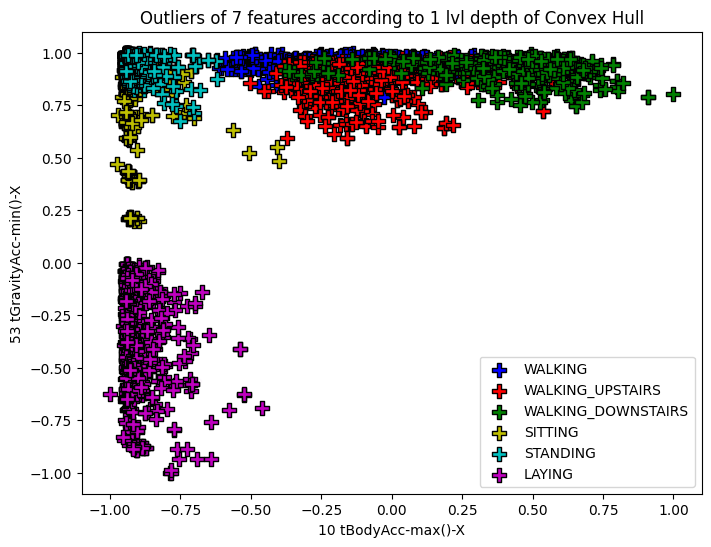

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
12,STANDING,1,-0.943906,-0.152362,0.988613,0.006303,-0.995961,-0.398552,-0.999959,-0.999864,-0.995685,-0.996788,0.187611
13,STANDING,1,-0.943323,-0.154141,0.988900,-0.106053,-0.997496,-0.718744,-0.999873,-0.999798,-0.998065,-0.998481,0.188812
14,STANDING,1,-0.925977,-0.292623,0.946749,-0.951518,-0.986120,0.233673,-0.991765,-0.999528,-0.979067,-0.836253,0.283159
15,STANDING,1,-0.941716,-0.263117,0.968635,-0.940622,-0.994191,-0.688309,-0.999500,-0.999960,-0.988245,-0.986083,0.263119
16,STANDING,1,-0.941716,-0.265091,0.972776,-0.639267,-0.995117,-0.605306,-0.999425,-0.999827,-0.988699,-0.990112,0.264324
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7343,WALKING_UPSTAIRS,30,0.185661,-0.219879,0.950148,-0.598707,-0.754640,-0.148922,-0.234912,-0.936548,-0.643103,-0.314210,0.235490
7346,WALKING_UPSTAIRS,30,0.210795,-0.216344,0.921088,-0.847749,-0.575046,0.199273,-0.148937,-0.950475,-0.007692,-0.303397,0.234996
7349,WALKING_UPSTAIRS,30,0.043999,-0.236950,0.933008,-0.821631,-0.662918,0.363110,0.034897,-0.909565,-0.373464,-0.220288,0.249145
7350,WALKING_UPSTAIRS,30,0.101702,-0.233230,0.933008,-0.838582,-0.645452,0.382837,0.040506,-0.936716,-0.527553,-0.234539,0.246432


In [121]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][rdf_train['label'] == k], rdf_train_val[:,2][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(rdf_train.loc[vertices_idx].values[:,2][rdf_train['label'].loc[vertices_idx] == k], rdf_train.loc[vertices_idx].values[:,4][rdf_train['label'].loc[vertices_idx] == k], edgecolor='k', marker='P', c=v, label = k, s=100)

plt.title('Outliers of 7 features according to 1 lvl depth of Convex Hull')
plt.xlabel(features_to_keep[0])
plt.ylabel(features_to_keep[2])
plt.legend()
plt.show()

df_highdim_hullout = rdf_train.loc[vertices_idx].sort_index()
df_highdim_hullout

In [122]:
vertices_idx = []

for targ in rdf_train['label'].unique():
    rdf_train_val = rdf_train[rdf_train['label']==targ][features_to_keep]
    idx_original = rdf_train_val.index
    rdf_train_val = rdf_train_val.values
    hull = ConvexHull(rdf_train_val[:,[0,2]])
    
    correct_idx_hull = idx_original[hull.vertices]
    
    for simplex in correct_idx_hull:
        vertices_idx.append(simplex)
        
rdf_train_val = rdf_train[features_to_keep].values

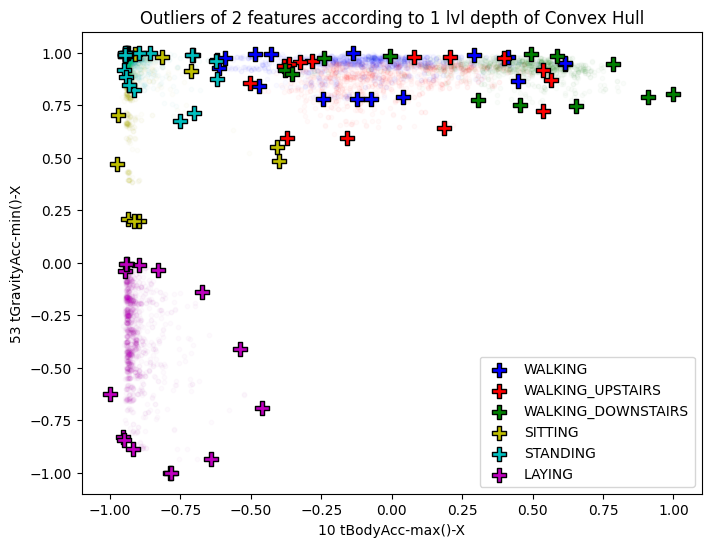

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
220,LAYING,1,-0.941680,0.794941,-0.004372,0.154368,-0.998638,-0.459541,-0.999930,-0.999789,-0.999758,-0.996868,-0.577603
221,LAYING,1,-0.939448,0.795038,-0.004380,-0.002589,-0.998275,-0.627023,-0.999896,-0.999880,-0.999426,-0.998661,-0.577824
237,LAYING,1,-0.671284,0.872346,-0.140425,-0.913712,-0.540253,0.634595,-0.477383,-0.929928,-0.246572,-0.143637,-0.754285
385,SITTING,3,-0.971348,0.154022,0.703716,-0.880144,-0.947089,0.572359,-0.964124,-0.998475,-0.945275,-0.522158,-0.024623
564,SITTING,3,-0.711757,0.064106,0.911653,-0.888127,-0.763382,-0.256954,0.212647,-0.978793,-0.439487,-0.291972,0.038530
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7101,WALKING_DOWNSTAIRS,30,-0.007459,-0.126237,0.983421,-0.436516,-0.613262,0.003393,-0.815243,-0.796453,-0.102112,-0.261678,0.170174
7160,WALKING_UPSTAIRS,30,-0.324444,-0.196743,0.953985,-0.848378,-0.836841,0.040161,-0.407867,-0.992088,-0.721755,-0.592563,0.219415
7162,WALKING_UPSTAIRS,30,-0.383518,-0.234883,0.937368,-0.861278,-0.763830,0.250993,-0.633486,-0.979057,-0.164925,-0.535125,0.246325
7169,STANDING,30,-0.709588,-0.055491,0.991396,-0.744823,-0.948361,-0.627850,-0.994285,-0.998133,-0.910330,-0.826920,0.121803


In [123]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][rdf_train['label'] == k], rdf_train_val[:,2][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(rdf_train.loc[vertices_idx].values[:,2][rdf_train['label'].loc[vertices_idx] == k], rdf_train.loc[vertices_idx].values[:,4][rdf_train['label'].loc[vertices_idx] == k], edgecolor='k', marker='P', c=v, label = k, s=100)

plt.title('Outliers of 2 features according to 1 lvl depth of Convex Hull')
plt.xlabel(features_to_keep[0])
plt.ylabel(features_to_keep[2])
plt.legend()
plt.show()

df_hullout = rdf_train.loc[vertices_idx].sort_index()
df_hullout

<font size = "4">Silhouette Score</font>

In [124]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

silhouette_avg = silhouette_score(rdf_train_val, labels_train[0]) #labels[0] because otherwise it's a df and not a series
silhouette_smp = silhouette_samples(rdf_train_val, labels_train[0])
print('Average Silhouette Score:', silhouette_avg)

Average Silhouette Score: 0.21005492389559774


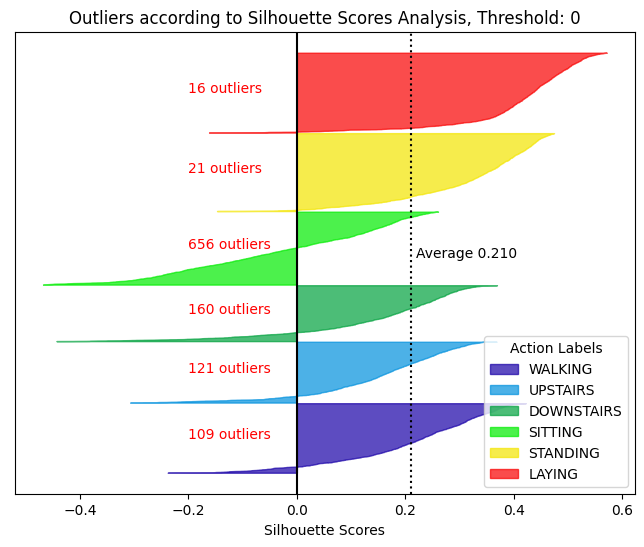

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
125,WALKING_DOWNSTAIRS,1,0.244225,-0.250038,0.932294,-0.428667,-0.470564,0.330701,-0.823280,-0.951659,-0.728113,-0.338320,0.256712
126,WALKING_DOWNSTAIRS,1,0.199676,-0.230489,0.936635,0.175934,-0.511060,0.326833,-0.797684,-0.921164,-0.761943,-0.292072,0.242048
133,WALKING_DOWNSTAIRS,1,0.158678,-0.210712,0.962302,0.065078,-0.607424,-0.004358,-0.870322,-0.818868,-0.795338,-0.324059,0.228405
142,WALKING_DOWNSTAIRS,1,0.124859,-0.276421,0.933958,-0.491138,-0.438022,0.090267,-0.734298,-0.897796,-0.694636,-0.222152,0.274972
143,WALKING_DOWNSTAIRS,1,0.345697,-0.262377,0.936733,-0.461049,-0.429252,0.379449,-0.770845,-0.903324,-0.677569,-0.279742,0.264695
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7228,SITTING,30,-0.941988,0.005728,0.946751,-0.441297,-0.997133,-0.616706,-0.999303,-0.999684,-0.997115,-0.988087,0.080048
7229,SITTING,30,-0.942948,0.005634,0.946751,-0.409119,-0.997291,-0.383747,-0.999519,-0.999826,-0.994500,-0.991828,0.080114
7262,WALKING,30,0.157066,-0.138658,0.971682,-0.673830,-0.398441,-0.038762,-0.397019,-0.807760,-0.463330,-0.330851,0.178857
7294,WALKING_DOWNSTAIRS,30,0.298281,-0.081714,0.957265,-0.363784,-0.557798,-0.064117,-0.706982,-0.843449,-0.541143,-0.394701,0.140430


In [125]:
plt.figure(figsize=(8, 6))
y_lower = 10

threshold_silhouette = 0


outliers_by_silhouette = []
for x in silhouette_smp:
    if x < threshold_silhouette:
        outliers_by_silhouette.append(-1)
    else:
        outliers_by_silhouette.append(1)
        
outliers_by_silhouette = np.array(outliers_by_silhouette)
silout_df = rdf_train[outliers_by_silhouette == -1]

label_origin_silout = labels_train[outliers_by_silhouette == -1]

conta_out_sil = np.unique(label_origin_silout, return_counts=True)

for i in range(1, len(np.unique(labels))+1):
    ith_cluster_silhouette_values = silhouette_smp[labels_train[0] == i]

    ith_cluster_silhouette_values.sort()
    outlier_sil = len(ith_cluster_silhouette_values[ith_cluster_silhouette_values < 0])

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    
    if threshold_silhouette != 0:
        plt.text(-0.20, y_lower + 0.5 * size_cluster_i, s='{} negatives'.format(outlier_sil), c='k')
    y_upper = y_lower + size_cluster_i
    
    try:
        pos_outs = np.where(conta_out_sil[0]==i)[0][0]
        plt.text(threshold_silhouette-0.2, y_lower + 0.5 * size_cluster_i, s='{} outliers'.format(conta_out_sil[1][pos_outs]), c='r')
    except:
        pos_of_outliers = -1

    color = cm.nipy_spectral(float(i) / (len(np.unique(labels))+1)) #+1 to adjust the color to the right length
    action_lab = remap_dict[i][remap_dict[i].find('_')+1:] #so that if it is -1 it starts from 0, if not it starts after '_'
    
    plt.fill_betweenx(np.arange(y_lower, y_upper), 0,
        ith_cluster_silhouette_values,
        facecolor=color, edgecolor=color, alpha=0.7, label=action_lab)
    
    y_lower = y_upper + 10  # 10 for the 0 samples
    
plt.axvline(silhouette_avg, c='k', ls=':')
plt.text(silhouette_avg+0.01, 3800, s='Average {:.3f}'.format(silhouette_avg), c='k')

if threshold_silhouette != 0:
    thr_line_color = 'r'
else:
    thr_line_color = 'k'
    
plt.axvline(threshold_silhouette, c=thr_line_color, ls='-')

plt.yticks([])
plt.xlabel('Silhouette Scores')
plt.title('Outliers according to Silhouette Scores Analysis, Threshold: {}'.format(round(threshold_silhouette, 3)))
plt.legend(loc='lower right', title='Action Labels')
plt.show()

df_silout = rdf_train.loc[np.where(silhouette_smp<=threshold_silhouette)[0]]
df_silout

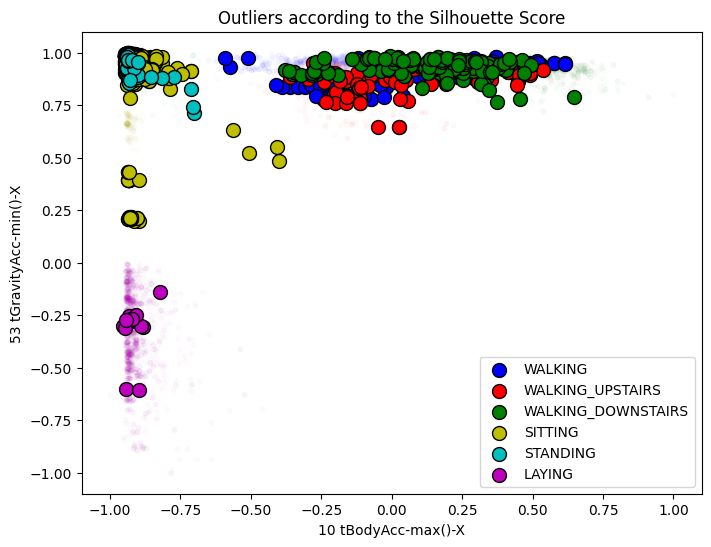

In [126]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][rdf_train['label'] == k], rdf_train_val[:,2][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(rdf_train.loc[df_silout.index].values[:,2][rdf_train['label'].loc[df_silout.index] == k], rdf_train.loc[df_silout.index].values[:,4][rdf_train['label'].loc[df_silout.index] == k], edgecolor='k', marker='o', c=v, label = k, s=100)

plt.title('Outliers according to the Silhouette Score')
plt.xlabel(features_to_keep[0])
plt.ylabel(features_to_keep[2])
plt.legend()
plt.show()


<font size = "4">Angle Based: ABOD</font>

In [127]:
!pip install pyod

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 134 kB 5.1 MB/s 
  Created wheel for pyod: filename=pyod-1.0.4-py3-none-any.whl size=165073 sha256=8d59d614c218fc6719bc44389a9cea5f5374306e616050eba627e7a56a6a7578
  Stored in directory: /root/.cache/pip/wheels/3d/48/a8/87d61660791c7e6b0f5c3068da7fb17ade7fdc041e864fe053
Successfully built pyod


In [128]:
from pyod.models.abod import ABOD
clf = ABOD()
clf.fit(rdf_train_val)
clf.decision_scores_

array([ -771.86461428, -5044.30546072, -9304.08069269, ...,
         -12.01171326,   -21.27074503,   -11.37665474])

In [129]:
outliers = clf.predict(rdf_train_val)
np.unique(outliers, return_counts=True)

(array([0, 1]), array([6528,  824]))

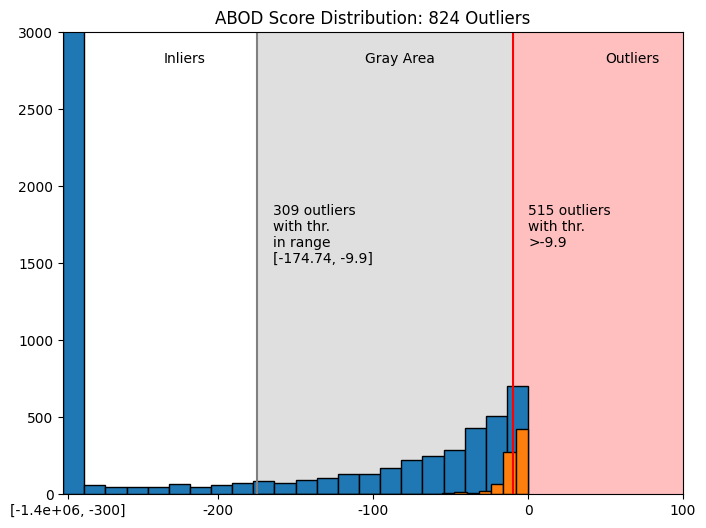

In [130]:
group = -300
minstd_threshold = np.min(clf.decision_scores_[np.where(outliers == 1)])
maxstd_threshold = np.max(clf.decision_scores_[np.where(outliers == 0)])

outliers_frommin_tomax = len(clf.decision_scores_[np.where(outliers == 1)][clf.decision_scores_[np.where(outliers == 1)] <= maxstd_threshold])
outliers_frommax = len(clf.decision_scores_[np.where(outliers == 1)][clf.decision_scores_[np.where(outliers == 1)] > maxstd_threshold])

abod_num_outliers = len(clf.decision_scores_[np.where(outliers==1)])

plt.figure(figsize=(8, 6))
plt.hist([x if (x >= group) else (group) for x in clf.decision_scores_], edgecolor='k', bins=22)
plt.hist(clf.decision_scores_[np.where(outliers == 1)], edgecolor='k', bins=22)
plt.axvline(minstd_threshold, c='gray')
plt.axvline(maxstd_threshold, c='red')
plt.text(minstd_threshold+10, 1500, s='{} outliers \nwith thr.\nin range\n[{}, {}]'.format(outliers_frommin_tomax, round(minstd_threshold,2), round(maxstd_threshold,2)), c='k')
plt.text(maxstd_threshold+10, 1500, s='{} outliers \nwith thr.\n>{}\n'.format(outliers_frommax, round(maxstd_threshold,2)), c='k')


plt.text(-235, 2800, s='Inliers', c='k')
plt.text(-105, 2800, s='Gray Area', c='k')
plt.text(50, 2800, s='Outliers', c='k')

plt.fill_between((minstd_threshold, maxstd_threshold), 0, 3200, facecolor='gray', alpha=0.25)
plt.fill_between((maxstd_threshold, 200), 0, 3200, facecolor='red', alpha=0.25)

plt.xlim(group, 100)
plt.ylim(0, 3000)
plt.title('ABOD Score Distribution: {} Outliers'.format(abod_num_outliers))
plt.xticks([-297]+list(np.arange(-200, 200, 100)), ['[{:.1e}, -300]'.format(round(np.min(clf.decision_scores_[np.where(outliers == 0)]),0))]+list(np.arange(-200, 200, 100)))
plt.show()

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
27,SITTING,1,-0.931896,0.042479,0.849573,-0.998575,-0.988861,0.507073,-0.797311,-0.999465,-0.975132,-0.199416,0.054216
30,SITTING,1,-0.737152,0.150702,0.858348,-0.869052,-0.919300,-0.205774,-0.880954,-0.993452,-0.730034,-0.533869,-0.020756
31,SITTING,1,-0.737152,0.195595,0.716291,-0.910968,-0.899820,0.233649,-0.786990,-0.992316,-0.712815,-0.488148,-0.053539
64,LAYING,1,-0.891284,0.758454,-0.034266,-0.922722,-0.952052,0.200505,-0.942879,-0.996520,-0.887202,-0.475762,-0.536104
66,LAYING,1,-0.925208,0.755542,-0.113391,-0.874732,-0.774072,0.485527,-0.699417,-0.989187,-0.441307,0.085679,-0.534122
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7329,WALKING_UPSTAIRS,30,0.069333,-0.235789,0.932667,-0.674905,-0.703628,-0.238768,-0.308943,-0.940406,-0.376203,-0.302191,0.248160
7335,WALKING_UPSTAIRS,30,0.185029,-0.236284,0.930208,-0.780167,-0.709014,-0.134736,-0.073581,-0.941318,-0.107915,-0.314879,0.248205
7346,WALKING_UPSTAIRS,30,0.210795,-0.216344,0.921088,-0.847749,-0.575046,0.199273,-0.148937,-0.950475,-0.007692,-0.303397,0.234996
7349,WALKING_UPSTAIRS,30,0.043999,-0.236950,0.933008,-0.821631,-0.662918,0.363110,0.034897,-0.909565,-0.373464,-0.220288,0.249145


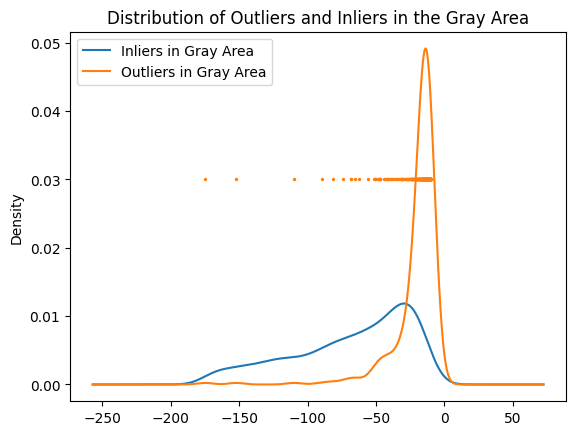

In [131]:
plt.scatter([],[])
plt.scatter(clf.decision_scores_[np.where(outliers == 1)][clf.decision_scores_[np.where(outliers == 1)] <= maxstd_threshold],
           [0.03 for _ in clf.decision_scores_[np.where(outliers == 1)][clf.decision_scores_[np.where(outliers == 1)] <= maxstd_threshold]], s=2)
pd.Series(clf.decision_scores_[np.where(outliers == 0)][clf.decision_scores_[np.where(outliers == 0)] > minstd_threshold]).plot(kind='kde', label='Inliers in Gray Area')
pd.Series(clf.decision_scores_[np.where(outliers == 1 & (clf.decision_scores_ <= maxstd_threshold))]).plot(kind='kde', label='Outliers in Gray Area')
plt.title('Distribution of Outliers and Inliers in the Gray Area')
plt.legend()

df_abodout = rdf_train.loc[np.where(outliers == 1)]
df_abodout

In [132]:
#there are strangely some outliers with lower scores in the grey area
#by focusing on the following threshold I can get for certain only outliers, excluding thus the gray area:
maxstd_threshold
#nonetheless the difference is very small (300 hundred more outliers), thus I will keep using the ABOD library standard

-9.901858123415844

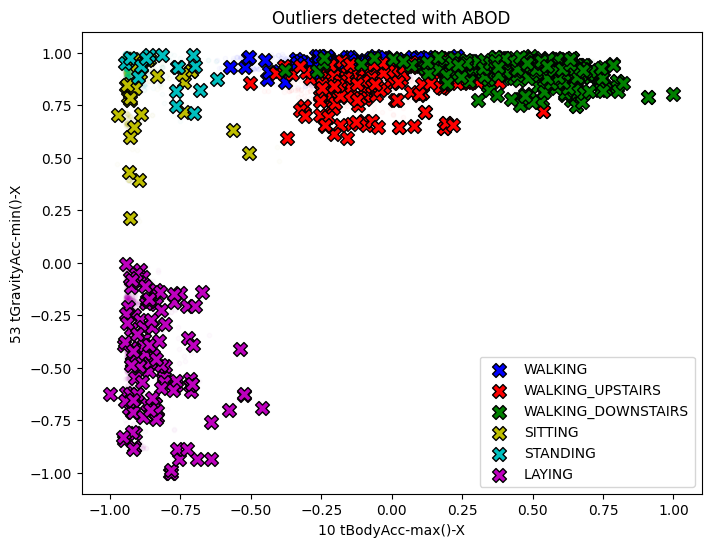

In [133]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][rdf_train['label'] == k], rdf_train_val[:,2][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(rdf_train.loc[df_abodout.index].values[:,2][rdf_train['label'].loc[df_abodout.index] == k], rdf_train.loc[df_abodout.index].values[:,4][rdf_train['label'].loc[df_abodout.index] == k], edgecolor='k', marker='X', c=v, label = k, s=100)

plt.title('Outliers detected with ABOD')
plt.xlabel(features_to_keep[0])
plt.ylabel(features_to_keep[2])
plt.legend()
plt.show()

<font size = "4">Comparing the results for each methods</font>

In [134]:
indexes_to_check = set(list(df_bpout.index)+list(df_dbout.index)+list(df_lofout.index)+list(df_highdim_hullout.index)+list(df_hullout.index)+list(df_silout.index)+list(df_abodout.index))
len(indexes_to_check)

5028

In [135]:
common_out_idx = set(df_bpout.index) & set(df_dbout.index) & set(df_lofout.index) & set(df_highdim_hullout.index) & set(df_silout.index) & set(df_abodout.index)
common_out_idx

{564, 1773, 2451, 3915}

In [136]:
rdf_train.loc[common_out_idx]

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
3915,WALKING,19,0.518618,-0.181234,0.951127,0.156372,0.243814,-0.327547,-0.671563,-0.486727,0.203951,-0.036189,0.208059
2451,LAYING,14,-0.821282,0.370974,-0.141663,-0.898474,-0.892187,0.496123,0.173585,-0.971960,-0.864192,1.000000,-0.220034
1773,STANDING,8,-0.901006,-0.127684,0.882206,-0.985841,-0.940439,0.103620,0.081971,-0.997071,-0.821073,0.007856,0.174306
564,SITTING,3,-0.711757,0.064106,0.911653,-0.888127,-0.763382,-0.256954,0.212647,-0.978793,-0.439487,-0.291972,0.038530


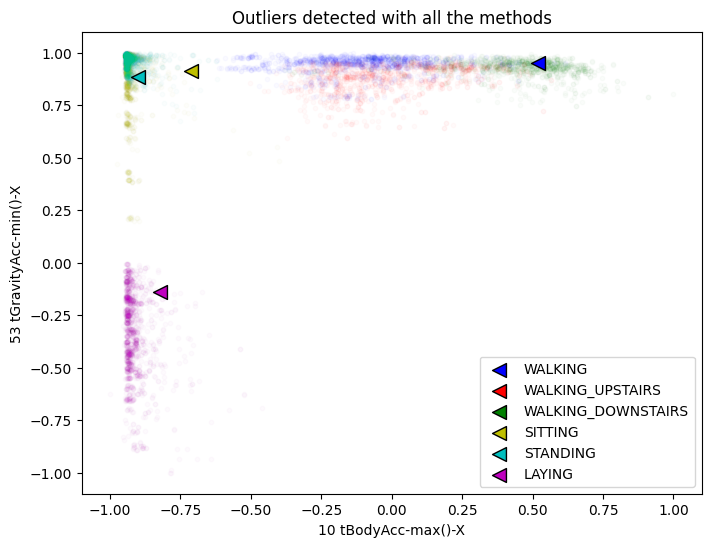

In [137]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][rdf_train['label'] == k], rdf_train_val[:,2][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(rdf_train.loc[common_out_idx].values[:,2][rdf_train['label'].loc[common_out_idx] == k], rdf_train.loc[common_out_idx].values[:,4][rdf_train['label'].loc[common_out_idx] == k], edgecolor='k', marker='<', c=v, label = k, s=100)

plt.title('Outliers detected with all the methods')
plt.xlabel(features_to_keep[0])
plt.ylabel(features_to_keep[2])
plt.legend()
plt.show()

<font size = "5">Dataset reduced with tSNE</font>

<font size = "4">Boxplot Method</font>

In [138]:
df_train_tsne = pd.DataFrame(tsne_train, columns=['PC1', 'PC2'])
X_tsne = tsne_train
df_train_tsne

,PC1,PC2
0,-66.521851,-46.051243
1,-40.967422,5.205186
2,-56.539421,-25.181896
3,-50.307587,10.727977
4,-51.159279,-5.548335
...,...,...
7347,-2.793952,-72.910767
7348,-2.602537,-72.936264
7349,-3.597741,-73.893837
7350,-3.693708,-73.668411


In [139]:
to_remap = labels[:len(ind_train)][0].values
remap_dict = {1 : 'WALKING', 2 : 'WALKING_UPSTAIRS', 3 : 'WALKING_DOWNSTAIRS', 4 : 'SITTING', 5 : 'STANDING', 6 : 'LAYING'}
activity_labels_train = [remap_dict.get(number, number) for number in to_remap]
df_train_tsne['label'] = activity_labels_train
color_map = [mapping_color.get(number, number) for number in df_train_tsne['label']]
df_train_tsne['color'] = color_map

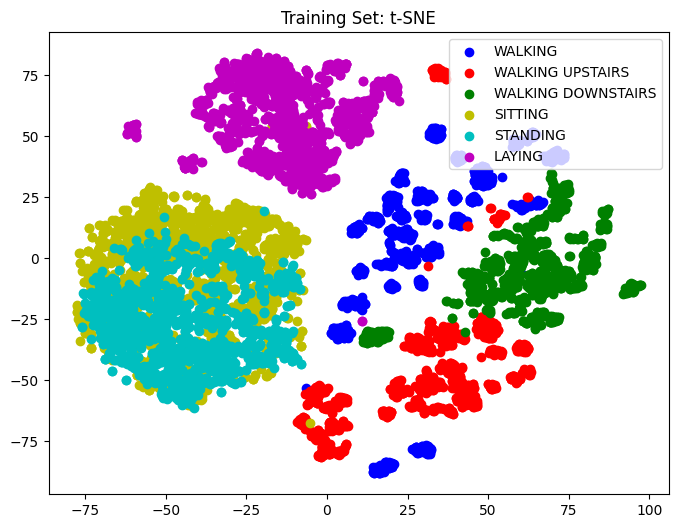

In [140]:
plt.figure(figsize=(8, 6))
for k, v in mapping_color.items():
    plt.scatter(df_train_tsne[df_train_tsne['label'] == k]['PC1'].values, df_train_tsne[df_train_tsne['label'] == k]['PC2'].values, c=v, label=k.replace('_', ' '))
plt.title('Training Set: t-SNE')
plt.legend()
plt.show()

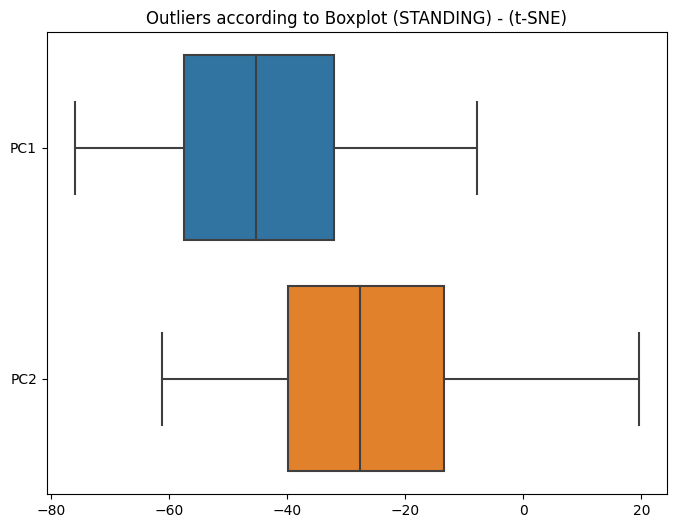

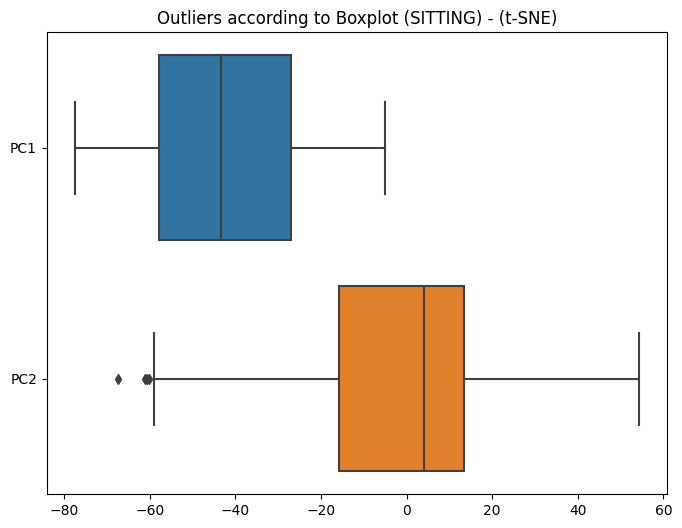

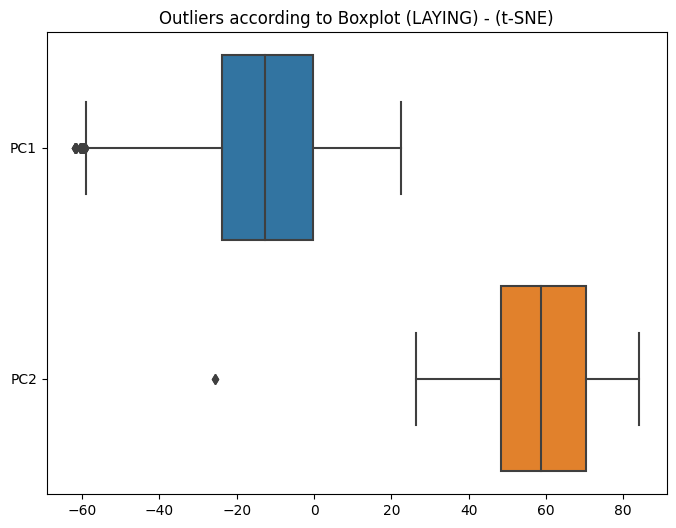

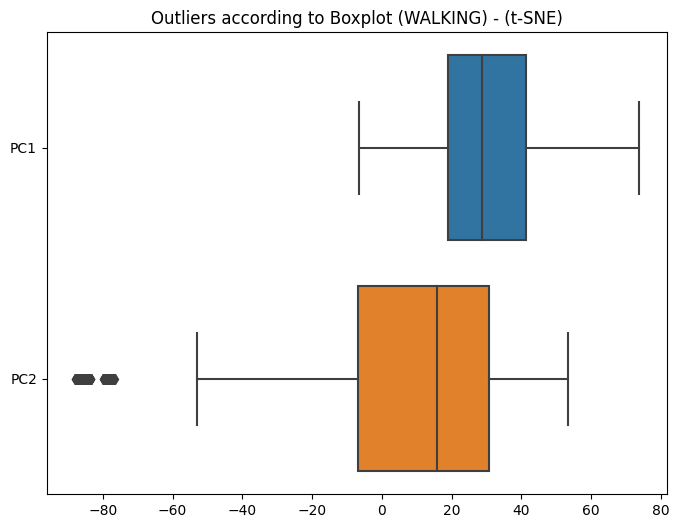

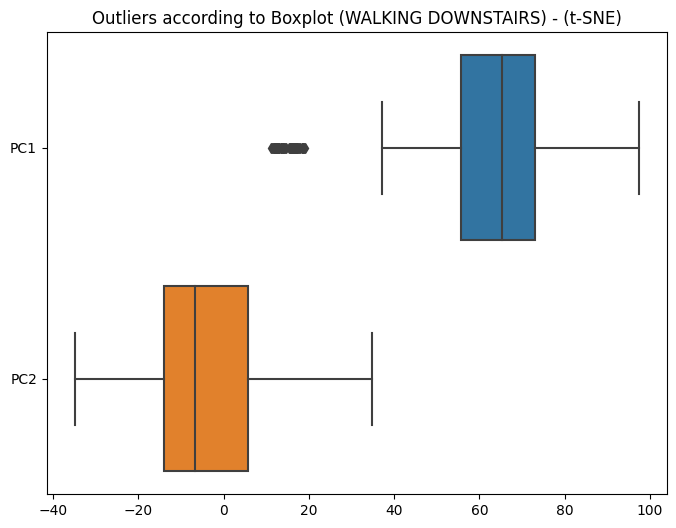

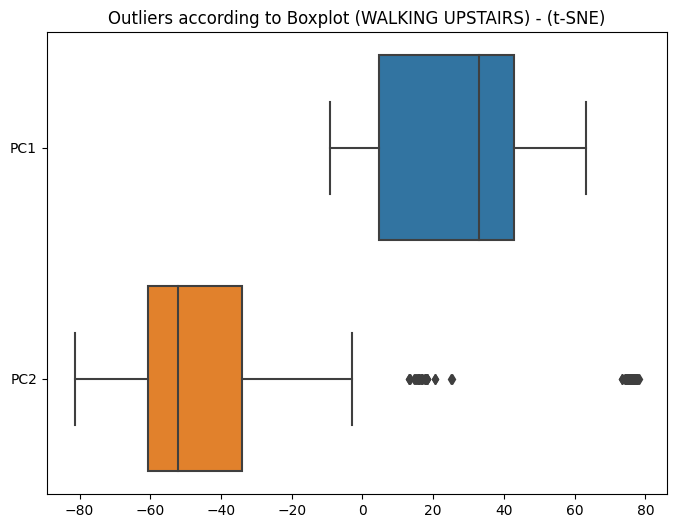

In [141]:
for lab in rdf_train['label'].unique():
    plt.figure(figsize=(8, 6))

    sns.boxplot(data=[X_tsne[:,x][df_train_tsne['label'] == lab] for x in range(2)], orient="h")
    plt.yticks([x for x in range(2)], ['PC1', 'PC2'])
    plt.title('Outliers according to Boxplot ({}) - (t-SNE)'.format(lab.replace('_', ' ')))
    plt.show()

In [142]:
boxplot_idx = []

for lab in df_train_tsne['label'].unique():

    for col in ['PC1', 'PC2']:
        Q1 = df_train_tsne[df_train_tsne['label'] == lab][col].quantile(0.25)
        Q3 = df_train_tsne[df_train_tsne['label'] == lab][col].quantile(0.75)
        IQR = Q3 - Q1

        filtering = (df_train_tsne[df_train_tsne['label'] == lab][col] >= Q1 - 1.5 * IQR) & (df_train_tsne[df_train_tsne['label'] == lab][col] <= Q3 + 1.5 *IQR)

        print(lab, col, 'number of outliers:', len(df_train_tsne[df_train_tsne['label'] == lab].loc[~filtering].index))

        for x in df_train_tsne[df_train_tsne['label'] == lab].loc[~filtering].index: # the tilde ~ inverts a boolean series
            boxplot_idx.append(x)

boxplot_idx = set(boxplot_idx)
print('Total Outliers by', len(boxplot_idx))

STANDING PC1 number of outliers: 0
STANDING PC2 number of outliers: 0
SITTING PC1 number of outliers: 0
SITTING PC2 number of outliers: 4
LAYING PC1 number of outliers: 33
LAYING PC2 number of outliers: 2
WALKING PC1 number of outliers: 0
WALKING PC2 number of outliers: 124
WALKING_DOWNSTAIRS PC1 number of outliers: 58
WALKING_DOWNSTAIRS PC2 number of outliers: 0
WALKING_UPSTAIRS PC1 number of outliers: 0
WALKING_UPSTAIRS PC2 number of outliers: 85
Total Outliers by 306


In [143]:
df_bpout_tsne = df_train_tsne.loc[boxplot_idx].sort_index()
df_bpout_tsne

,PC1,PC2,label,color
70,10.911652,-25.731762,LAYING,m
71,10.902035,-25.734543,LAYING,m
378,-43.016994,-60.055431,SITTING,y
564,-5.092209,-67.349686,SITTING,y
1290,51.888142,16.013506,WALKING_UPSTAIRS,r
...,...,...,...,...
7289,16.113834,-87.347389,WALKING,b
7290,15.817547,-87.316071,WALKING,b
7291,15.818738,-86.747681,WALKING,b
7292,15.820813,-86.488800,WALKING,b


In [144]:
print('12-Feat', len(df_bpout))
print('TSNE', len(df_bpout_tsne))
box_common = set(df_bpout.index) & set(df_bpout_tsne.index)
print('Common Found:', len(box_common))
box_common

12-Feat 2281
TSNE 306
Common Found: 142


{70,
 71,
 564,
 1290,
 1292,
 1293,
 1294,
 1295,
 1296,
 1297,
 1298,
 1299,
 1301,
 1302,
 1303,
 1304,
 1305,
 1307,
 1308,
 1309,
 1310,
 1311,
 1312,
 1313,
 2318,
 2355,
 2356,
 2357,
 2358,
 2359,
 2360,
 2361,
 2362,
 2363,
 2364,
 2365,
 2366,
 2367,
 2368,
 2369,
 2370,
 2371,
 2372,
 2373,
 2374,
 2375,
 2376,
 2377,
 2378,
 2379,
 2380,
 2381,
 2466,
 2467,
 2468,
 2469,
 2470,
 2471,
 2472,
 2474,
 2475,
 2476,
 2477,
 2478,
 2479,
 2481,
 2482,
 2483,
 2484,
 2485,
 2486,
 2487,
 2490,
 2491,
 2492,
 2493,
 2494,
 2516,
 2517,
 2518,
 2519,
 2520,
 2521,
 2522,
 2523,
 2524,
 2525,
 2526,
 2527,
 2528,
 2529,
 2530,
 2531,
 2532,
 2533,
 2534,
 2535,
 2536,
 2537,
 2538,
 2539,
 2540,
 2541,
 2542,
 2907,
 4678,
 4679,
 6329,
 6330,
 6331,
 6332,
 6333,
 6334,
 6335,
 6337,
 6338,
 6339,
 6340,
 6344,
 6345,
 6346,
 6516,
 6517,
 6518,
 6519,
 6520,
 6521,
 6522,
 6523,
 6524,
 6525,
 6526,
 6527,
 6528,
 6529,
 6530,
 6531,
 6532,
 6533,
 6534,
 7262,
 7293}

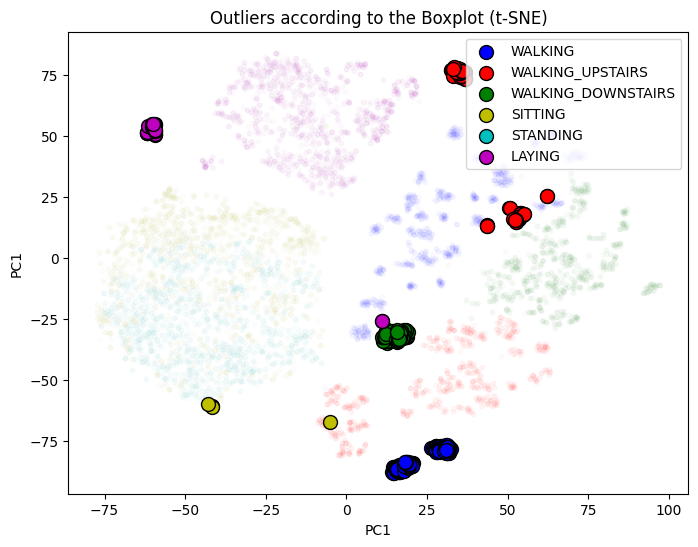

In [145]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(X_tsne[:,0][df_train_tsne['label'] == k], X_tsne[:,1][df_train_tsne['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(df_train_tsne.loc[boxplot_idx].values[:,0][df_train_tsne['label'].loc[boxplot_idx] == k], df_train_tsne.loc[boxplot_idx].values[:,1][df_train_tsne['label'].loc[boxplot_idx] == k], edgecolor='k', marker='o', c=v, label = k, s=100)
plt.xlabel('PC1')
plt.ylabel('PC1')
plt.title('Outliers according to the Boxplot (t-SNE)')
plt.legend()

<font size = "4">Density Based: DBSCAN</font>

STANDING:
The point of maximum curvature has a distance of 5.346888755146068
(array([-1,  0]), array([   6, 1368]))

SITTING:
The point of maximum curvature has a distance of 8.187171044890766
(array([-1,  0]), array([   6, 1280]))

LAYING:
The point of maximum curvature has a distance of 4.247820499006094
(array([-1,  0,  1,  2]), array([   2, 1334,   34,   37]))

WALKING:
The point of maximum curvature has a distance of 2.5920342278296453
(array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 22, 23, 24]), array([ 10,  95,  54,  30,  25,  29,  28,  56,  24,  24,  59,  59,  28,
        26, 138,  25,  32,  29,  49,  51,  46,  59,  73,  59,  53,  65]))

WALKING_DOWNSTAIRS:
The point of maximum curvature has a distance of 7.344536084095509
(array([0, 1, 2]), array([883,  45,  58]))

WALKING_UPSTAIRS:
The point of maximum curvature has a distance of 2.8809328079367273
(array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]), arra

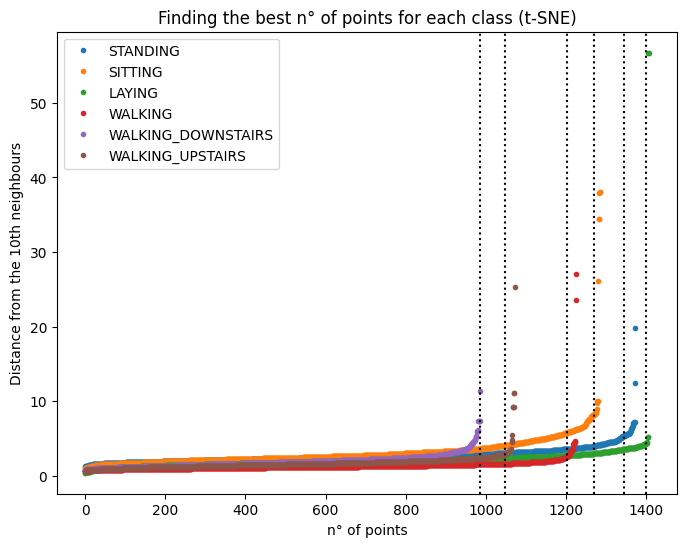

In [146]:
db_outliers = []

plt.figure(figsize=(8, 6))

for targ in df_train_tsne['label'].unique():
    redefined_for_temp_target = df_train_tsne[df_train_tsne['label'] == targ][['PC1', 'PC2']]
    X_tsne = redefined_for_temp_target.values
    
    ####################################
    
    metrica = 'euclidean'
    distanza = squareform(pdist(X_tsne, metrica))

    punti = 10
    kth_distances = []
    for dist in distanza:
        index_kth_dist = np.argsort(dist)[punti]
        kth_distances.append(dist[index_kth_dist])
    
    plt.plot(range(0, len(kth_distances)), sorted(kth_distances), marker='.', linewidth=0, label=targ)
    plt.title('Finding the best n° of points for each class (t-SNE)')
    plt.ylabel('Distance from the {}th neighbours'.format(punti))
    plt.xlabel('n° of points')
    plt.grid()
    
    
    kneedle = KneeLocator(np.arange(0, len(kth_distances)), np.array(sorted(kth_distances)[:]), S=1.0, curve="convex", direction="increasing")
    plt.axvline(kneedle.knee, c='k', ls=':')
    
    #####################################
    
    epsilon = sorted(kth_distances)[kneedle.knee]

    X_dbscan = X_tsne.copy()
    dbscan = DBSCAN(eps=epsilon, min_samples=punti)
    dbscan.fit(X_dbscan)
    
    print('{}:\nThe point of maximum curvature has a distance of {}'.format(targ, epsilon))
    print(np.unique(dbscan.labels_, return_counts=True))
    
    for x in redefined_for_temp_target[dbscan.labels_ == -1].index:
        db_outliers.append(x)
    print()

plt.legend()

print('How many noise points:', len(db_outliers), '\nWhich:', db_outliers)

X_tsne = df_train_tsne[['PC1', 'PC2']].values

,PC1,PC2,label,color
71,10.902035,-25.734543,LAYING,m
70,10.911652,-25.731762,LAYING,m
3651,-6.725276,54.205460,SITTING,y
3830,-16.933237,54.132183,SITTING,y
3829,-16.948771,54.112637,SITTING,y
3650,-6.522590,54.143898,SITTING,y
564,-5.092209,-67.349686,SITTING,y
3649,-6.393536,53.925316,SITTING,y
1923,-50.498932,16.970638,STANDING,c
5685,-12.419951,-19.697727,STANDING,c


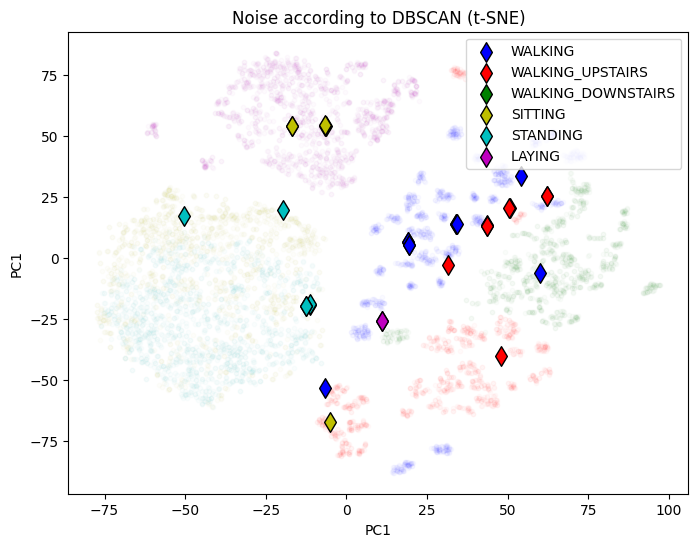

In [147]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(X_tsne[:,0][df_train_tsne['label'] == k], X_tsne[:,1][df_train_tsne['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(df_train_tsne.loc[db_outliers].values[:,0][df_train_tsne['label'].loc[db_outliers] == k], df_train_tsne.loc[db_outliers].values[:,1][df_train_tsne['label'].loc[db_outliers] == k], edgecolor='k', marker='d', c=v, label = k, s=100)
plt.xlabel('PC1')
plt.ylabel('PC1')
plt.title('Noise according to DBSCAN (t-SNE)')
plt.legend()

df_dbout_tsne = df_train_tsne.loc[db_outliers].sort_values(by='label')
df_dbout_tsne 

<font size = "4">Density Based: Local Outlier Factor</font>

STANDING
(array([-1,  1]), array([  45, 1329]))
Max value of score array: -0.8799238918195019 
Min value of score array: -5.600934448494627 
Mean value of score array: -1.082993786480135
Outlier threshold: -2.25
Outlier threshold: -2.25
Indices of the outliers: [  0 217 218 316 317 318 353 554 573 871 872]
Bins (NOT Sturge): 50


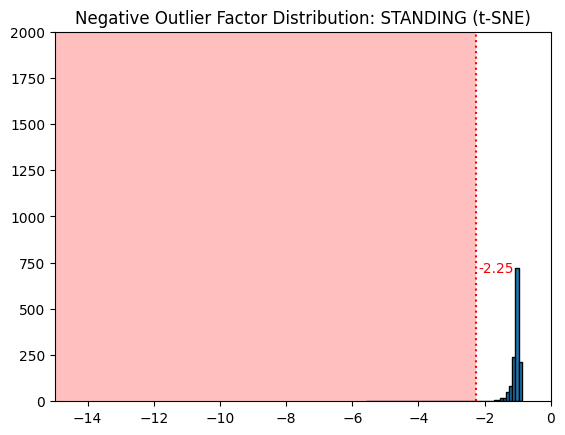

Number of identified outlier with the specified threshold: 11
(array([-1,  1]), array([  11, 1363]))
SITTING
(array([-1,  1]), array([  53, 1233]))
Max value of score array: -0.8629157635880089 
Min value of score array: -12.265505752344223 
Mean value of score array: -1.114976711377573
Outlier threshold: -2.25
Outlier threshold: -2.25
Indices of the outliers: [  8  85 139 225 396 397 594 595 596 631 632 633 634 710 918 990]
Bins (NOT Sturge): 50


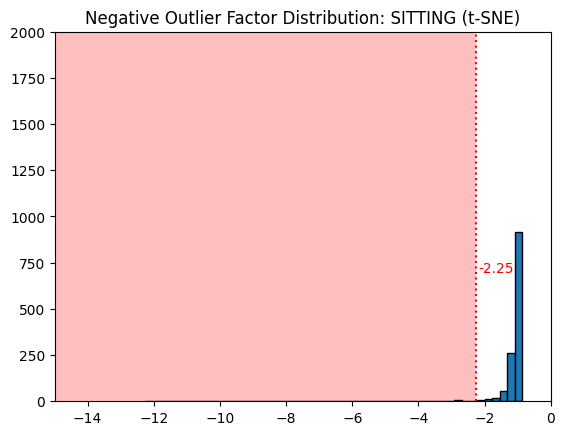

Number of identified outlier with the specified threshold: 16
(array([-1,  1]), array([  16, 1270]))
LAYING
(array([-1,  1]), array([  81, 1326]))
Max value of score array: -0.8449471927439444 
Min value of score array: -13.837923827939935 
Mean value of score array: -1.129879480324551
Outlier threshold: -2.25
Outlier threshold: -2.25
Indices of the outliers: [  19   20  237  238  263  536  537  542  543  580  626  996 1233]
Bins (NOT Sturge): 50


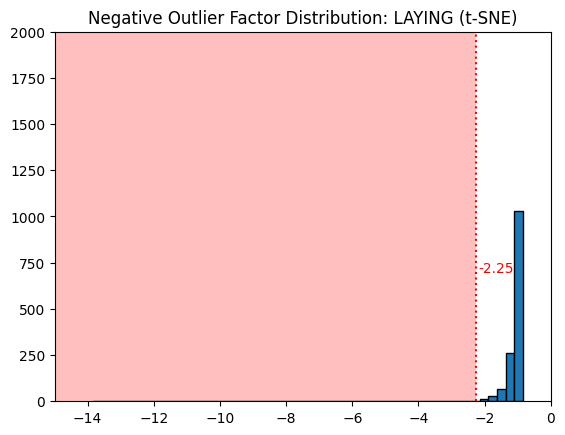

Number of identified outlier with the specified threshold: 13
(array([-1,  1]), array([  13, 1394]))
WALKING
(array([-1,  1]), array([  49, 1177]))
Max value of score array: -0.8826982868568832 
Min value of score array: -22.390459676653215 
Mean value of score array: -1.1317302170589958
Outlier threshold: -2.25
Outlier threshold: -2.25
Indices of the outliers: [114 196 346 396 666 667 668 734 900]
Bins (NOT Sturge): 50


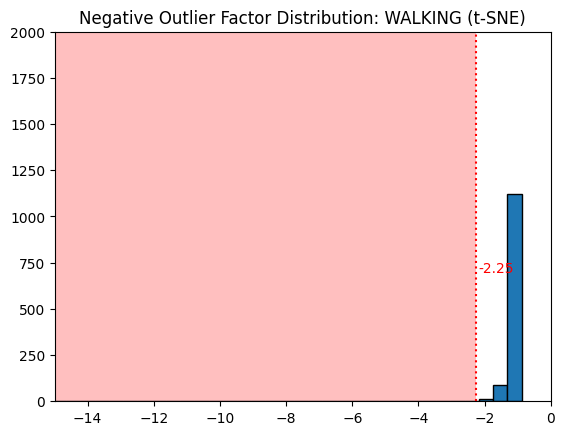

Number of identified outlier with the specified threshold: 9
(array([-1,  1]), array([   9, 1217]))
WALKING_DOWNSTAIRS
(array([-1,  1]), array([ 54, 932]))
Max value of score array: -0.8780652364056019 
Min value of score array: -6.4325549524754475 
Mean value of score array: -1.114256853288579
Outlier threshold: -2.25
Outlier threshold: -2.25
Indices of the outliers: [  0   1  25  69  70  77  78  83 481 482 792 806 807 832]
Bins (NOT Sturge): 50


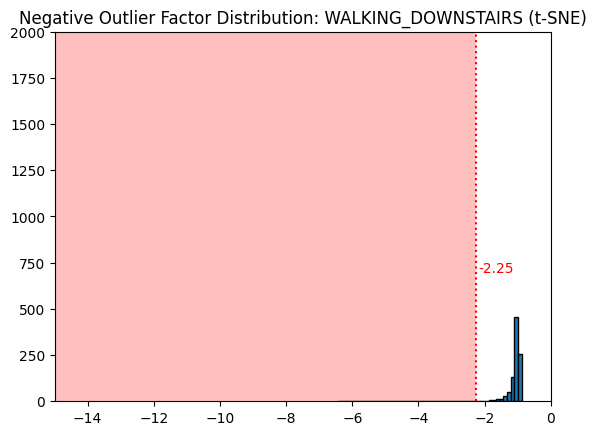

Number of identified outlier with the specified threshold: 14
(array([-1,  1]), array([ 14, 972]))
WALKING_UPSTAIRS
(array([-1,  1]), array([  51, 1022]))
Max value of score array: -0.7866434992136766 
Min value of score array: -15.649562801148402 
Mean value of score array: -1.1389577728500118
Outlier threshold: -2.25
Outlier threshold: -2.25
Indices of the outliers: [203 558 577 583 584 590 670 671 678 694 718]
Bins (NOT Sturge): 50


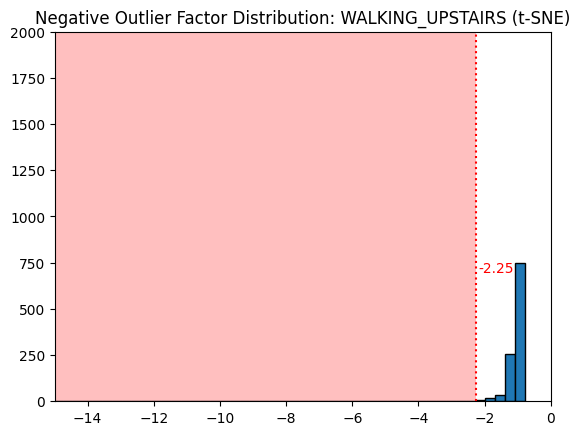

Number of identified outlier with the specified threshold: 11
(array([-1,  1]), array([  11, 1062]))
[0, 217, 218, 316, 317, 318, 353, 554, 573, 871, 872, 8, 85, 139, 225, 396, 397, 594, 595, 596, 631, 632, 633, 634, 710, 918, 990, 19, 20, 237, 238, 263, 536, 537, 542, 543, 580, 626, 996, 1233, 114, 196, 346, 396, 666, 667, 668, 734, 900, 0, 1, 25, 69, 70, 77, 78, 83, 481, 482, 792, 806, 807, 832, 203, 558, 577, 583, 584, 590, 670, 671, 678, 694, 718]


In [148]:
lof_outliers = []
idx_for_score = []
lof_score_outliers = []

for targ in df_train_tsne['label'].unique():
    redefined_for_temp_target = df_train_tsne[df_train_tsne['label'] == targ][['PC1','PC2']]
    X_tsne = redefined_for_temp_target.values

    X_lof = X_tsne.copy()
    clf_lof = LocalOutlierFactor(n_neighbors=5)
    outliers_lof = clf_lof.fit_predict(X_lof)
    
    outliers_val_array = clf_lof.negative_outlier_factor_
    outliers_val_array
    
    print(targ)
    print(np.unique(outliers_lof, return_counts=True))
    
    max_lof = np.max(outliers_val_array)
    min_lof = np.min(outliers_val_array)
    mean_lof = np.mean(outliers_val_array)
    print('Max value of score array:', max_lof, '\nMin value of score array:', min_lof, '\nMean value of score array:', mean_lof)
    
    outliers_lof_ind = np.where(outliers_lof==-1)[0] #indeces of the outliers
    outliers_lof_ind
    
    try:
        computed_score = -2.25
        print('Outlier threshold:', computed_score)
    except ValueError:
        #print('EMPTY ARRAY OF OUTLIERS, REDEFINE THRESHOLD') #redefining the threshold
        #computed_score = -1.45 #selected by trial and error
        #outliers_lof = np.array([-1 if x < computed_score else 1 for x in outliers_val_array])
        #outliers_lof_ind = np.where(outliers_lof==-1)[0] #indeces of the outliers
        #print('Outlier threshold:', computed_score)
        print('No outliers found for', targ)
    outliers_lof = np.array([-1 if x < computed_score else 1 for x in outliers_val_array])
    outliers_lof_ind = np.where(outliers_lof==-1)[0] #indeces of the outliers
    print('Outlier threshold:', computed_score)
    print('Indices of the outliers:', outliers_lof_ind)
    
    k_sturge = 50
    print('Bins (NOT Sturge):', k_sturge)
    
    plt.hist(outliers_val_array, bins=k_sturge, edgecolor='k')
    plt.axvline(computed_score, c='r', ls=':')
    plt.text(computed_score+0.05, 700, s=round(computed_score, 2), c='r')
    plt.fill_between((-15, computed_score), 0, 11500, facecolor='red', alpha=0.25)
    plt.ylim(0, 2000)
    plt.xlim(-14.99, 0)
    plt.title("Negative Outlier Factor Distribution: {} (t-SNE)".format(targ))
    plt.show()
    
    print('Number of identified outlier with the specified threshold:', 
          len(outliers_val_array[outliers_val_array <= computed_score])) #values lower than -1.50 tend to be outliers, scikit learn's LOF use this value
    print(np.unique(outliers_lof, return_counts=True))
    
    for x in outliers_lof_ind:
        lof_outliers.append(x)
    for x in redefined_for_temp_target.index:
        idx_for_score.append(x)
    for x in outliers_val_array:
        lof_score_outliers.append(x)
        
print(lof_outliers)

X_tsne = df_train_tsne[['PC1','PC2']].values


In [149]:
lof_score_df = pd.DataFrame([(idx, score) for idx, score in zip(idx_for_score, lof_score_outliers)]).sort_values(by=0).reset_index(drop=True)
lof_score_df.columns = ['index', 'scores']
lof_score_df

,index,scores
0,0,-2.590576
1,1,-1.022250
2,2,-0.996387
3,3,-1.715518
4,4,-1.019179
...,...,...
7347,7347,-1.136277
7348,7348,-1.243934
7349,7349,-1.211427
7350,7350,-1.112176


In [150]:
computed_score = -2.25
outliers_val_array = lof_score_df['scores'].values
print('Number of identified outlier with the {} threshold:'.format(computed_score), 
            len(outliers_val_array[outliers_val_array <= computed_score]), 'on', len(outliers_val_array)) #values lower than -1.50 tend to be outliers, LOF use this value

Number of identified outlier with the -2.25 threshold: 74 on 7352


In [151]:
max_lof = np.max(outliers_val_array)
min_lof = np.min(outliers_val_array)
mean_lof = np.mean(outliers_val_array)
print('Max value of score array:', max_lof, '\nMin value of score array:', min_lof, '\nMean value of score array:', mean_lof)

Max value of score array: -0.7866434992136766 
Min value of score array: -22.390459676653215 
Mean value of score array: -1.1180487127307994


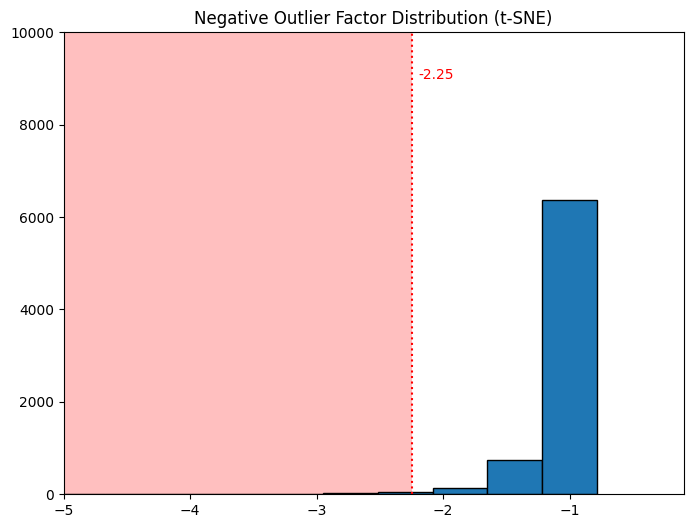

In [152]:
k_sturge = 50
plt.figure(figsize=(8, 6))

plt.hist(outliers_val_array, bins=k_sturge, edgecolor='k')
plt.axvline(computed_score, c='r', ls=':')
plt.text(computed_score+0.05, 9000, s=round(computed_score, 2), c='r')
plt.fill_between((-6, computed_score), 0, 11000, facecolor='red', alpha=0.25)
plt.xlim(-5, -0.1)
plt.ylim(0, 10000)
plt.title("Negative Outlier Factor Distribution (t-SNE)")
plt.show()

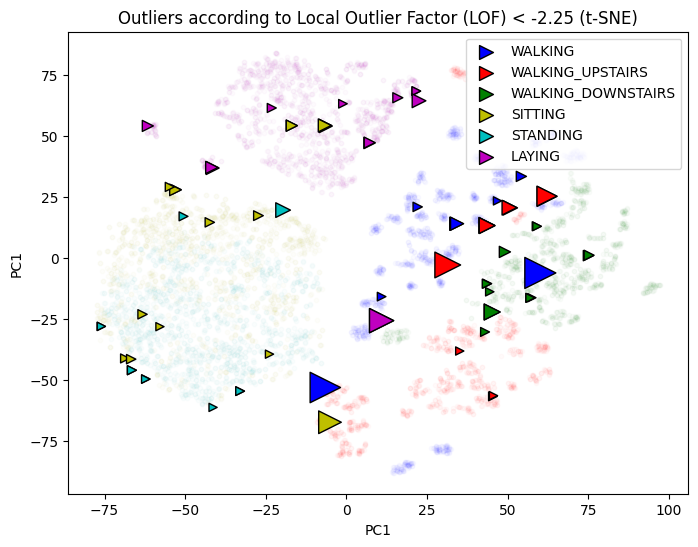

,PC1,PC2,label,color
6519,-61.570724,54.006050,LAYING,m
2968,21.677961,68.292427,LAYING,m
3130,-41.480278,36.766266,LAYING,m
3131,-41.736320,36.990471,LAYING,m
3316,22.515469,64.302078,LAYING,m
...,...,...,...,...
3792,50.542316,20.546553,WALKING_UPSTAIRS,r
3766,35.140270,-38.176853,WALKING_UPSTAIRS,r
1308,50.814030,20.438412,WALKING_UPSTAIRS,r
4845,45.422646,-56.760372,WALKING_UPSTAIRS,r


In [153]:
outliers_lof = np.array([-1 if x < computed_score else 1 for x in outliers_val_array])
outliers_lof_ind = np.where(outliers_lof==-1)[0] #indeces of the outliers

plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(X_tsne[:,0][df_train_tsne['label'] == k], X_tsne[:,1][df_train_tsne['label'] == k], c=v, alpha=0.02, s=10)

radius = ((max_lof - outliers_val_array) / (max_lof - min_lof))[outliers_lof_ind] #setting the radius of the outlier score by normalizing

for k, v in mapping_color.items():
    plt.scatter(X_tsne[:,0][outliers_lof_ind][df_train_tsne['label'].loc[outliers_lof_ind] == k], 
                X_tsne[:,1][outliers_lof_ind][df_train_tsne['label'].loc[outliers_lof_ind] == k], 
                edgecolor='k', marker='>', c=v, label = k, 
                s=500*(radius[df_train_tsne['label'].loc[outliers_lof_ind] == k]))
    
plt.title("Outliers according to Local Outlier Factor (LOF) < {} (t-SNE)".format(round(computed_score, 2)))
legend = plt.legend()
for x in range(6):
    legend.legendHandles[x]._sizes = [100]
plt.xlabel('PC1')
plt.ylabel('PC1')
plt.show()

df_lofout_tsne = df_train_tsne.loc[outliers_lof_ind].sort_values(by='label')
df_lofout_tsne

In [154]:
print('12-Feat', len(df_lofout))
print('TSNE', len(df_lofout_tsne))
lof_common = set(df_lofout.index) & set(df_lofout_tsne.index)
print('Common Found:', len(lof_common))
lof_common

12-Feat 164
TSNE 74
Common Found: 11


{564, 1715, 1773, 2437, 3074, 3130, 3651, 3737, 3830, 3952, 4563}

<font size = "4">Depth Based: Convex Hull</font>

In [155]:
vertices_idx = []
for lab in df_train_tsne['label'].unique():
    tsne_temp = df_train_tsne[df_train_tsne['label']==lab][['PC1', 'PC2']]
    idx_original = tsne_temp.index
    tsne_val = tsne_temp.values
    hull = ConvexHull(tsne_temp)
    
    correct_idx_hull = idx_original[hull.vertices]
    
    for simplex in correct_idx_hull:
        vertices_idx.append(simplex)

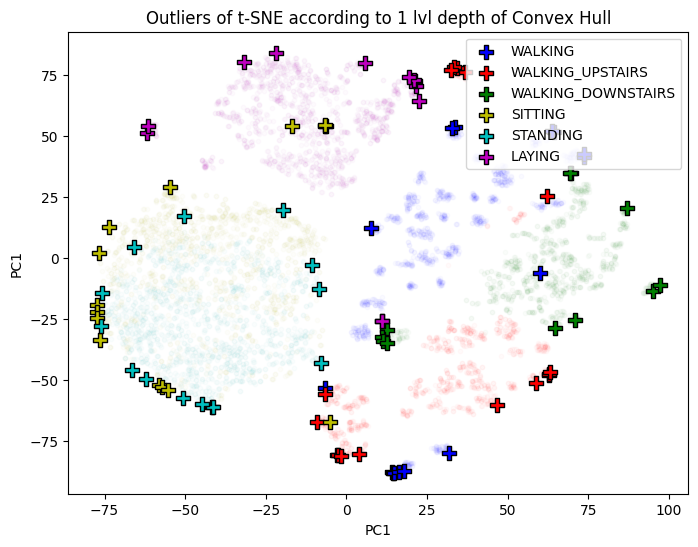

,PC1,PC2,label,color
0,-66.521851,-46.051243,STANDING,c
70,10.911652,-25.731762,LAYING,m
71,10.902035,-25.734543,LAYING,m
556,-76.465515,-33.699493,SITTING,y
564,-5.092209,-67.349686,SITTING,y
...,...,...,...,...
7275,16.265837,-87.886345,WALKING,b
7284,14.270391,-87.637344,WALKING,b
7285,14.556743,-87.994667,WALKING,b
7286,14.717019,-88.021927,WALKING,b


In [156]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(X_tsne[:,0][rdf_train['label'] == k], X_tsne[:,1][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(df_train_tsne.loc[vertices_idx].values[:,0][df_train_tsne['label'].loc[vertices_idx] == k], df_train_tsne.loc[vertices_idx].values[:,1][df_train_tsne['label'].loc[vertices_idx] == k], edgecolor='k', marker='P', c=v, label = k, s=100)

plt.title('Outliers of t-SNE according to 1 lvl depth of Convex Hull')
plt.xlabel('PC1')
plt.ylabel('PC1')
plt.legend()
plt.show()

df_hullout_tsne = df_train_tsne.loc[vertices_idx].sort_index()
df_hullout_tsne

In [157]:
print('12-Feat', len(df_highdim_hullout))
print('TSNE', len(df_hullout_tsne))
hull_common = set(df_highdim_hullout.index) & set(df_hullout_tsne.index)
print('Common Found:', len(hull_common))
hull_common

12-Feat 3347
TSNE 83
Common Found: 48


{70,
 71,
 564,
 689,
 861,
 933,
 1353,
 1771,
 1773,
 1968,
 2363,
 2412,
 2466,
 2511,
 2533,
 2731,
 2949,
 3060,
 3074,
 3198,
 3277,
 3281,
 3304,
 3316,
 3321,
 3649,
 3651,
 3830,
 3831,
 3883,
 3934,
 3948,
 3960,
 3961,
 4729,
 4830,
 4834,
 4838,
 4998,
 5227,
 5228,
 5232,
 5379,
 6516,
 6519,
 6911,
 6951,
 7125}

<font size = "4">Silhouette Score</font>

In [158]:
silhouette_avg = silhouette_score(X_tsne, labels_train[0])
silhouette_smp = silhouette_samples(X_tsne, labels_train[0])
print('Average Silhouette Score:', silhouette_avg)

Average Silhouette Score: 0.26142523


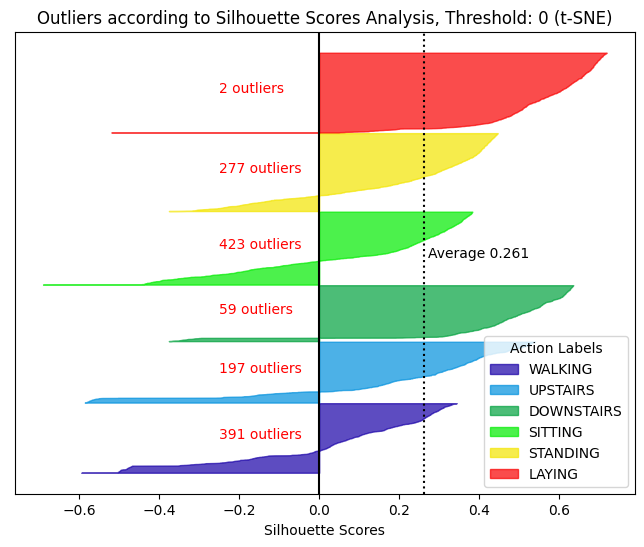

In [159]:
plt.figure(figsize=(8, 6))
y_lower = 10

threshold_silhouette = 0

outliers_by_silhouette = []
for x in silhouette_smp:
    if x < threshold_silhouette:
        outliers_by_silhouette.append(-1)
    else:
        outliers_by_silhouette.append(1)
        
outliers_by_silhouette = np.array(outliers_by_silhouette)
silout_df = rdf_train[outliers_by_silhouette == -1]

label_origin_silout = labels_train[outliers_by_silhouette == -1]

conta_out_sil = np.unique(label_origin_silout, return_counts=True)

for i in range(1, len(np.unique(labels))+1):
    ith_cluster_silhouette_values = silhouette_smp[labels_train[0] == i]

    ith_cluster_silhouette_values.sort()
    outlier_sil = len(ith_cluster_silhouette_values[ith_cluster_silhouette_values < 0])

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    
    if threshold_silhouette != 0:
        plt.text(-0.25, y_lower + 0.5 * size_cluster_i, s='{} negatives'.format(outlier_sil), c='k')
    y_upper = y_lower + size_cluster_i
    
    try:
        pos_outs = np.where(conta_out_sil[0]==i)[0][0]
        plt.text(threshold_silhouette-0.25, y_lower + 0.5 * size_cluster_i, s='{} outliers'.format(conta_out_sil[1][pos_outs]), c='r')
    except:
        pos_of_outliers = -1

    color = cm.nipy_spectral(float(i) / (len(np.unique(labels))+1)) #+1 to adjust the color to the right length
    action_lab = remap_dict[i][remap_dict[i].find('_')+1:] #so that if it is -1 it starts from 0, if not it starts after '_'
    
    plt.fill_betweenx(np.arange(y_lower, y_upper), 0,
        ith_cluster_silhouette_values,
        facecolor=color, edgecolor=color, alpha=0.7, label=action_lab)
    
    y_lower = y_upper + 10  # 10 for the 0 samples
    
plt.axvline(silhouette_avg, c='k', ls=':')
plt.text(silhouette_avg+0.01, 3800, s='Average {:.3f}'.format(silhouette_avg), c='k')

if threshold_silhouette != 0:
    thr_line_color = 'r'
else:
    thr_line_color = 'k'
    
plt.axvline(threshold_silhouette, c=thr_line_color, ls='-')

plt.yticks([])
plt.xlabel('Silhouette Scores')
plt.title('Outliers according to Silhouette Scores Analysis, Threshold: {} (t-SNE)'.format(round(threshold_silhouette, 3)))
plt.legend(loc='lower right', title='Action Labels')
plt.show()

In [160]:
df_silout_tsne = df_train_tsne.loc[np.where(silhouette_smp<=threshold_silhouette)[0]]
df_silout_tsne

,PC1,PC2,label,color
1,-40.967422,5.205186,STANDING,c
3,-50.307587,10.727977,STANDING,c
4,-51.159279,-5.548335,STANDING,c
5,-51.155067,-5.642771,STANDING,c
7,-40.848000,0.280077,STANDING,c
...,...,...,...,...
7289,16.113834,-87.347389,WALKING,b
7290,15.817547,-87.316071,WALKING,b
7291,15.818738,-86.747681,WALKING,b
7292,15.820813,-86.488800,WALKING,b


In [161]:
print('12-Feat', len(df_silout))
print('TSNE', len(df_silout_tsne))
sil_common = set(df_silout.index) & set(df_silout_tsne.index)
print('Common Found:', len(sil_common))
sil_common

12-Feat 1083
TSNE 1349
Common Found: 542


{236,
 296,
 380,
 396,
 564,
 565,
 566,
 567,
 568,
 571,
 574,
 575,
 576,
 577,
 689,
 727,
 730,
 731,
 732,
 733,
 737,
 738,
 827,
 843,
 844,
 846,
 888,
 889,
 933,
 968,
 971,
 973,
 974,
 976,
 977,
 978,
 979,
 980,
 981,
 984,
 985,
 986,
 989,
 1020,
 1035,
 1039,
 1040,
 1041,
 1134,
 1135,
 1138,
 1143,
 1144,
 1147,
 1151,
 1152,
 1153,
 1154,
 1183,
 1184,
 1188,
 1194,
 1195,
 1196,
 1197,
 1198,
 1199,
 1200,
 1201,
 1202,
 1203,
 1204,
 1205,
 1206,
 1207,
 1208,
 1290,
 1291,
 1292,
 1293,
 1294,
 1295,
 1296,
 1297,
 1298,
 1299,
 1300,
 1301,
 1302,
 1303,
 1304,
 1305,
 1306,
 1307,
 1308,
 1309,
 1310,
 1311,
 1312,
 1313,
 1314,
 1343,
 1345,
 1351,
 1353,
 1354,
 1359,
 1362,
 1501,
 1502,
 1505,
 1506,
 1507,
 1551,
 1553,
 1862,
 1944,
 2104,
 2105,
 2106,
 2107,
 2110,
 2252,
 2253,
 2254,
 2255,
 2260,
 2262,
 2263,
 2264,
 2265,
 2266,
 2268,
 2269,
 2270,
 2271,
 2272,
 2274,
 2275,
 2302,
 2303,
 2304,
 2305,
 2306,
 2307,
 2308,
 2310,
 2311,
 2312,


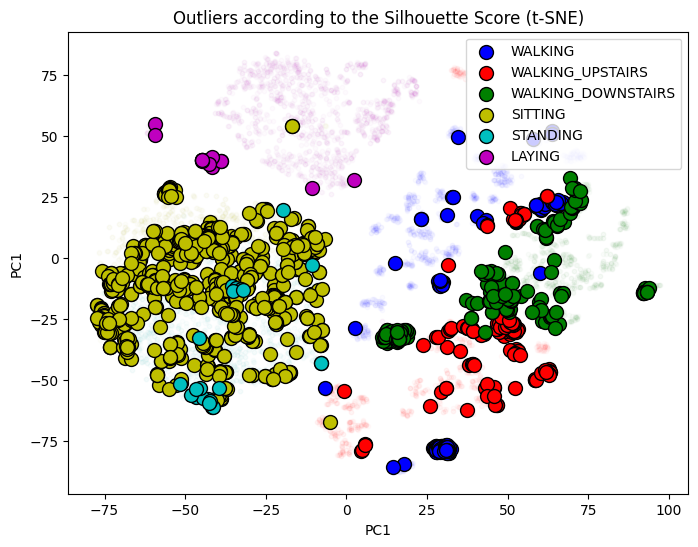

In [162]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(X_tsne[:,0][rdf_train['label'] == k], X_tsne[:,1][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(df_train_tsne.loc[df_silout.index].values[:,0][df_train_tsne['label'].loc[df_silout.index] == k], df_train_tsne.loc[df_silout.index].values[:,1][df_train_tsne['label'].loc[df_silout.index] == k], edgecolor='k', marker='o', c=v, label = k, s=100)

plt.title('Outliers according to the Silhouette Score (t-SNE)')
plt.xlabel('PC1')
plt.ylabel('PC1')
plt.legend()
plt.show()

<font size = "4">Angle Based: ABOD</font>

In [163]:
clf = ABOD()
clf.fit(X_tsne)
clf.decision_scores_

array([-15.58510194,  -0.13454263,  -0.1208017 , ..., -12.84104909,
        -8.53030582, -13.04950769])

In [164]:
outliers = clf.predict(X_tsne)
np.unique(outliers, return_counts=True)

(array([0, 1]), array([6616,  736]))

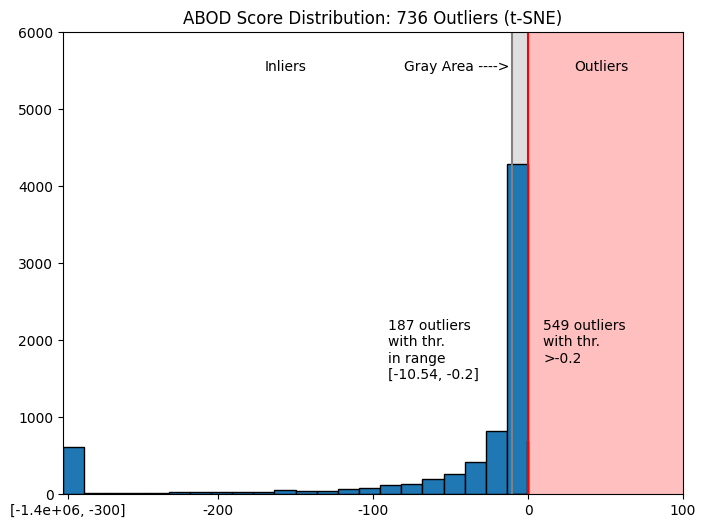

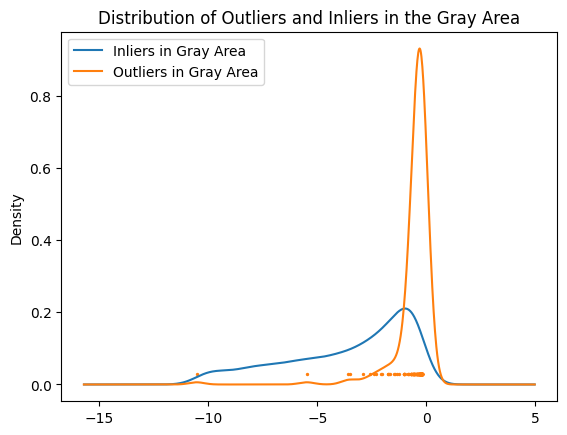

,PC1,PC2,label,color
1,-40.967422,5.205186,STANDING,c
2,-56.539421,-25.181896,STANDING,c
7,-40.848000,0.280077,STANDING,c
11,-58.222778,4.533144,STANDING,c
17,-59.403179,-27.613382,STANDING,c
...,...,...,...,...
7278,16.441093,-84.805748,WALKING,b
7296,50.157291,-14.682413,WALKING_DOWNSTAIRS,g
7297,63.777882,-8.471895,WALKING_DOWNSTAIRS,g
7299,46.683090,-16.340483,WALKING_DOWNSTAIRS,g


In [165]:
group = -300
minstd_threshold = np.min(clf.decision_scores_[np.where(outliers == 1)])
maxstd_threshold = np.max(clf.decision_scores_[np.where(outliers == 0)])

outliers_frommin_tomax = len(clf.decision_scores_[np.where(outliers == 1)][clf.decision_scores_[np.where(outliers == 1)] <= maxstd_threshold])
outliers_frommax = len(clf.decision_scores_[np.where(outliers == 1)][clf.decision_scores_[np.where(outliers == 1)] > maxstd_threshold])

abod_num_outliers = len(clf.decision_scores_[np.where(outliers==1)])

plt.figure(figsize=(8, 6))
plt.hist([x if (x >= group) else (group) for x in clf.decision_scores_], edgecolor='k', bins=22)
plt.hist(clf.decision_scores_[np.where(outliers == 1)], edgecolor='k', bins=22)
plt.axvline(minstd_threshold, c='gray')
plt.axvline(maxstd_threshold, c='red')
plt.text(minstd_threshold-80, 1500, s='{} outliers \nwith thr.\nin range\n[{}, {}]'.format(outliers_frommin_tomax, round(minstd_threshold,2), round(maxstd_threshold,2)), c='k')
plt.text(maxstd_threshold+10, 1500, s='{} outliers \nwith thr.\n>{}\n'.format(outliers_frommax, round(maxstd_threshold,2)), c='k')


plt.text(-170, 5500, s='Inliers', c='k')
plt.text(-80, 5500, s='Gray Area ---->', c='k')
plt.text(30, 5500, s='Outliers', c='k')

plt.fill_between((minstd_threshold, maxstd_threshold), 0, 10000, facecolor='gray', alpha=0.25)
plt.fill_between((maxstd_threshold, 200), 0, 10000, facecolor='red', alpha=0.25)

plt.xlim(group, 100)
plt.ylim(0, 6000)
plt.title('ABOD Score Distribution: {} Outliers (t-SNE)'.format(abod_num_outliers))
plt.xticks([-297]+list(np.arange(-200, 200, 100)), ['[{:.1e}, -300]'.format(round(np.min(clf.decision_scores_[np.where(outliers == 0)]),0))]+list(np.arange(-200, 200, 100)))
plt.show()

plt.scatter([],[])
plt.scatter(clf.decision_scores_[np.where(outliers == 1)][clf.decision_scores_[np.where(outliers == 1)] <= maxstd_threshold],
           [0.03 for _ in clf.decision_scores_[np.where(outliers == 1)][clf.decision_scores_[np.where(outliers == 1)] <= maxstd_threshold]], s=2)
pd.Series(clf.decision_scores_[np.where(outliers == 0)][clf.decision_scores_[np.where(outliers == 0)] > minstd_threshold]).plot(kind='kde', label='Inliers in Gray Area')
pd.Series(clf.decision_scores_[np.where(outliers == 1 & (clf.decision_scores_ <= maxstd_threshold))]).plot(kind='kde', label='Outliers in Gray Area')
plt.title('Distribution of Outliers and Inliers in the Gray Area')
plt.legend()
plt.show()

df_abodout_tsne = df_train_tsne.loc[np.where(outliers == 1)]
df_abodout_tsne

In [166]:
#by focusing on the following threshold I can get for certain only outliers, excluding thus the gray area:
maxstd_threshold

-0.20050161125395588

In [167]:
print('12-Feat', len(df_abodout))
print('TSNE', len(df_abodout_tsne))
abod_common = set(df_abodout.index) & set(df_abodout_tsne.index)
print('Common Found:', len(abod_common))
abod_common

12-Feat 824
TSNE 736
Common Found: 64


{140,
 481,
 485,
 486,
 536,
 564,
 565,
 690,
 935,
 1063,
 1085,
 1210,
 1274,
 1308,
 1383,
 1396,
 1597,
 1598,
 1715,
 1722,
 1723,
 1731,
 1788,
 1826,
 1827,
 1828,
 1865,
 1897,
 1903,
 1925,
 2031,
 2099,
 2176,
 2525,
 3130,
 3210,
 3227,
 3738,
 3750,
 3823,
 3889,
 3915,
 3916,
 3952,
 4281,
 4304,
 4316,
 4581,
 4617,
 4687,
 4830,
 4833,
 4834,
 4871,
 5137,
 5308,
 5360,
 5365,
 5379,
 6401,
 6518,
 6922,
 6949,
 7297}

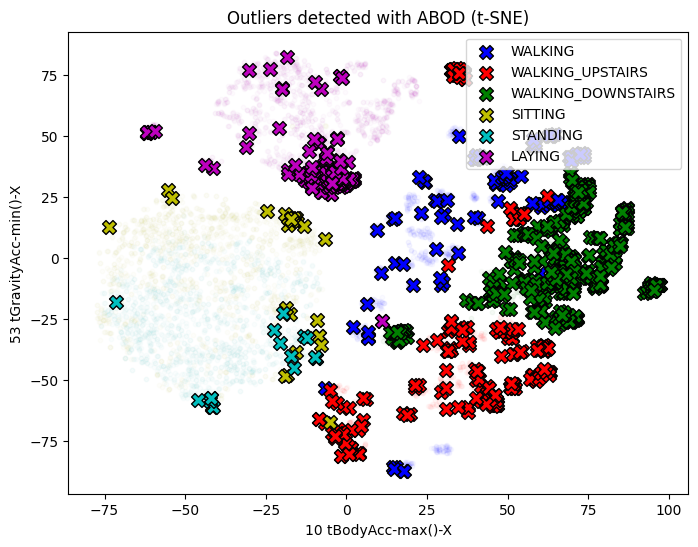

In [168]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(X_tsne[:,0][rdf_train['label'] == k], X_tsne[:,1][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(df_train_tsne.loc[df_abodout.index].values[:,0][df_train_tsne['label'].loc[df_abodout.index] == k], df_train_tsne.loc[df_abodout.index].values[:,1][df_train_tsne['label'].loc[df_abodout.index] == k], edgecolor='k', marker='X', c=v, label = k, s=100)

plt.title('Outliers detected with ABOD (t-SNE)')
plt.xlabel(features_to_keep[0])
plt.ylabel(features_to_keep[2])
plt.legend()
plt.show()

<font size = "4">Comparing the results for each methods</font>

In [169]:
indexes_to_check_tsne = set(list(df_bpout_tsne.index)+list(df_dbout_tsne.index)+list(df_lofout_tsne.index)+list(df_hullout_tsne.index)+list(df_silout_tsne.index)+list(df_abodout_tsne.index))
len(indexes_to_check_tsne)

2047

In [170]:
common_out_idx_tsne = set(df_bpout_tsne.index) & set(df_dbout_tsne.index) & set(df_lofout_tsne.index) & set(df_hullout_tsne.index) & set(df_silout_tsne.index) & set(df_abodout_tsne.index)
common_out_idx_tsne

{564}

In [171]:
df_train_tsne.loc[common_out_idx_tsne]

,PC1,PC2,label,color
564,-5.092209,-67.349686,SITTING,y


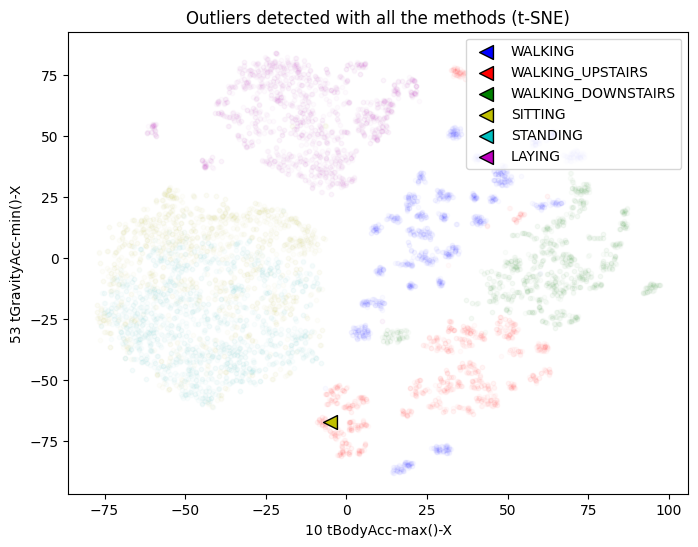

In [172]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(X_tsne[:,0][rdf_train['label'] == k], X_tsne[:,1][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(df_train_tsne.loc[common_out_idx_tsne].values[:,0][df_train_tsne['label'].loc[common_out_idx_tsne] == k], df_train_tsne.loc[common_out_idx_tsne].values[:,1][df_train_tsne['label'].loc[common_out_idx_tsne] == k], edgecolor='k', marker='<', c=v, label = k, s=100)

plt.title('Outliers detected with all the methods (t-SNE)')
plt.xlabel(features_to_keep[0])
plt.ylabel(features_to_keep[2])
plt.legend()
plt.show()

In [173]:
common_out_idx

{564, 1773, 2451, 3915}

In [174]:
set(df_lofout.index) & set(df_highdim_hullout.index) & set(df_lofout_tsne.index) & set(df_hullout_tsne.index)

{564, 1773, 3074, 3651, 3830}